# 预处理（改指数后的）

数据读取完成.
训练集样本数: 40669
测试集样本数: 21859

排除 SOC > 120 后:
训练集样本数: 40669 -> 37690
测试集样本数: 21859 -> 20461

原始特征数量: 93
计算训练集特征相关性矩阵...


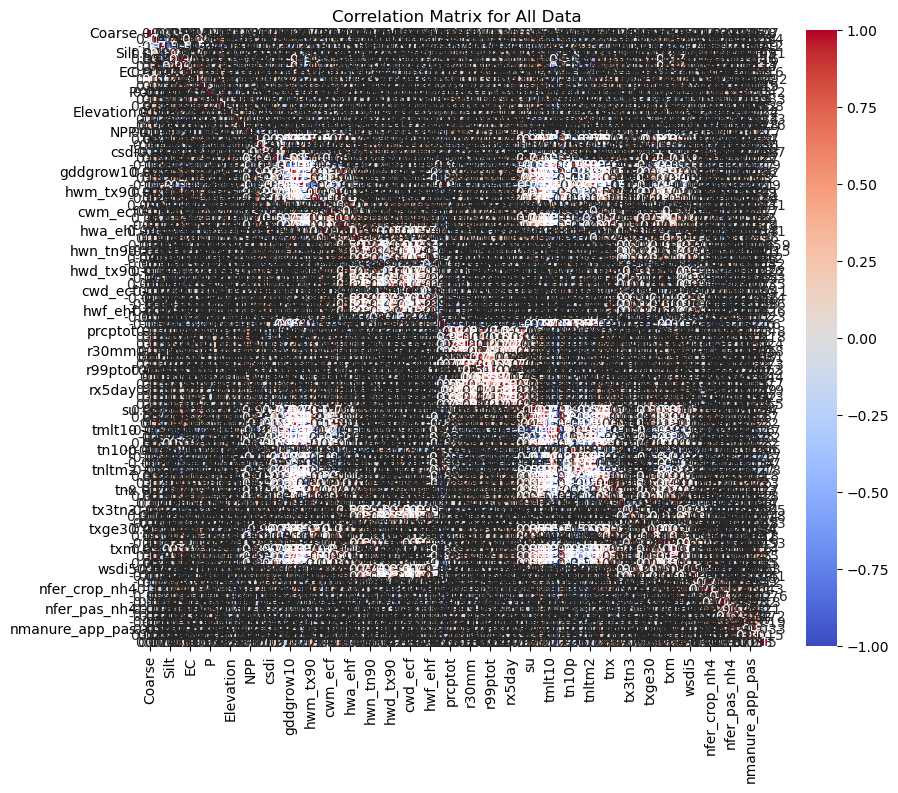

相关性矩阵热图已显示
查找相关性 > 0.75 的特征对...
 - 高相关对 (Sand, Silt)，删除 Silt
 - 高相关对 (pH_CaCl2, pH_H2O)，保留 pH_H2O，删除 pH_CaCl2
 - 高相关对 (csdi5, csdi)，删除 csdi
 - 高相关对 (cddcold18, gddgrow10)，删除 gddgrow10
 - 高相关对 (fd, gsl)，删除 gsl
 - 高相关对 (gddgrow10, gsl)，删除 gsl
 - 高相关对 (fd, hddheat18)，删除 hddheat18
 - 高相关对 (gddgrow10, hddheat18)，删除 hddheat18
 - 高相关对 (gsl, hddheat18)，删除 hddheat18
 - 高相关对 (cddcold18, hwm_tx90)，删除 hwm_tx90
 - 高相关对 (gddgrow10, hwm_tx90)，删除 hwm_tx90
 - 高相关对 (cddcold18, hwm_tn90)，删除 hwm_tn90
 - 高相关对 (gddgrow10, hwm_tn90)，删除 hwm_tn90
 - 高相关对 (hwm_tx90, hwa_tx90)，删除 hwa_tx90
 - 高相关对 (hwm_tn90, hwa_tn90)，删除 hwa_tn90
 - 高相关对 (hwm_ehf, hwa_ehf)，删除 hwa_ehf
 - 高相关对 (cwm_ecf, cwa_ecf)，删除 cwa_ecf
 - 高相关对 (hwn_tx90, hwn_ehf)，删除 hwn_ehf
 - 高相关对 (hwn_tn90, hwn_ehf)，删除 hwn_ehf
 - 高相关对 (hwd_tx90, hwd_ehf)，删除 hwd_ehf
 - 高相关对 (hwd_tn90, hwd_ehf)，删除 hwd_ehf
 - 高相关对 (hwn_tx90, hwf_tx90)，删除 hwf_tx90
 - 高相关对 (hwn_ehf, hwf_tx90)，删除 hwf_tx90
 - 高相关对 (hwd_tx90, hwf_tx90)，删除 hwf_tx90
 - 高相关对 (hwd_ehf, hwf_tx90)，删除 hwf_t

In [5]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import KNNImputer
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import dump
import os

# 模型保存路径
model_dir = r'E:\Project-yqr\new\model\weight'
os.makedirs(model_dir, exist_ok=True)

# --- 1. 读取数据 ---
try:
    df_2009 = pd.read_csv(r'E:\Project-yqr\组会\data\SOC\results\soc_filled_2009_average.csv')
    df_2015 = pd.read_csv(r'E:\Project-yqr\组会\data\SOC\results\soc_filled_2015_average.csv')
    df_2018 = pd.read_csv(r'E:\Project-yqr\组会\data\SOC\results\soc_filled_2018_average.csv')
    print("数据读取完成.")
except FileNotFoundError:
    print("错误：请确保文件路径正确无误！")
    exit()

# --- 2. 合并训练和测试集 ---
df_train = pd.concat([df_2009, df_2018], ignore_index=True)
df_test = df_2015.copy()

print(f"训练集样本数: {len(df_train)}")
print(f"测试集样本数: {len(df_test)}")

# --- 3. 排除 SOC > 120 ---
soc_threshold = 120
initial_train_count = len(df_train)
initial_test_count = len(df_test)
df_train = df_train[df_train['OC'] <= soc_threshold].copy()
df_test = df_test[df_test['OC'] <= soc_threshold].copy()
print(f"\n排除 SOC > {soc_threshold} 后:")
print(f"训练集样本数: {initial_train_count} -> {len(df_train)}")
print(f"测试集样本数: {initial_test_count} -> {len(df_test)}")

# --- 4. 特征选择 ---
X_train_orig = df_train.iloc[:, 7:].copy()
y_train_full = df_train['SOC'].copy()
X_test_orig = df_test.iloc[:, 7:].copy()
y_test = df_test['SOC'].copy()
original_covariate_names = X_train_orig.columns.tolist()
print(f"\n原始特征数量: {len(original_covariate_names)}")

# --- 5. 删除相关性高的特征，优先保留列表 ---
print("计算训练集特征相关性矩阵...")
corr_matrix = X_train_orig.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix for All Data')
plt.show()
print("相关性矩阵热图已显示")

threshold = 0.75
priority_keep = ['su', 'pH_H2O']  # ✅ 你希望优先保留的变量名
to_drop = set()

print(f"查找相关性 > {threshold} 的特征对...")
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        col_i = corr_matrix.columns[i]
        col_j = corr_matrix.columns[j]
        corr_val = abs(corr_matrix.iloc[i, j])

        if corr_val > threshold:
            if col_i in priority_keep and col_j not in priority_keep:
                to_drop.add(col_j)
                print(f" - 高相关对 ({col_j}, {col_i})，保留 {col_i}，删除 {col_j}")
            elif col_j in priority_keep and col_i not in priority_keep:
                to_drop.add(col_i)
                print(f" - 高相关对 ({col_j}, {col_i})，保留 {col_j}，删除 {col_i}")
            elif col_i in priority_keep and col_j in priority_keep:
                print(f" - 高相关对 ({col_j}, {col_i})，但都是优先保留变量，都保留")
            else:
                to_drop.add(col_i)
                print(f" - 高相关对 ({col_j}, {col_i})，删除 {col_i}")

if to_drop:
    print(f"将删除的特征: {to_drop}")
else:
    print("未发现相关性超过阈值的特征，不删除任何特征。")

cols_to_drop_existing = [c for c in to_drop if c in X_train_orig.columns]
X_train_orig = X_train_orig.drop(columns=cols_to_drop_existing).copy()
X_test_orig = X_test_orig.drop(columns=cols_to_drop_existing).copy()
covariate_names = X_train_orig.columns.tolist()
print(f"特征数量从 {len(original_covariate_names)} 降至 {len(covariate_names)}")

# --- 6. KNN 插补 ---
imputer = KNNImputer(n_neighbors=5)
X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train_orig), columns=covariate_names)
X_test_imputed = pd.DataFrame(imputer.transform(X_test_orig), columns=covariate_names)
print("完成 KNN 插补")

# --- 7. 训练初始随机森林，获取特征重要性 ---
print("训练初始随机森林模型，计算特征重要性...")
initial_params = {
    'n_estimators': 100,
    'max_depth': None,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'max_features': 'sqrt',
    'random_state': 66,
    'n_jobs': -1
}
model_rf = RandomForestRegressor(**initial_params)
model_rf.fit(X_train_imputed, y_train_full)
feat_importances = pd.Series(model_rf.feature_importances_, index=covariate_names).sort_values(ascending=False)
print("特征重要性排序:\n", feat_importances)

# --- 8. 选择前15个特征 ---
top_k = 15
selected_features = feat_importances.head(top_k).index.tolist()
print(f"选择前 {top_k} 个特征: {selected_features}")

X_train_selected = X_train_imputed[selected_features].copy()
X_test_selected = X_test_imputed[selected_features].copy()

# --- 9. 标准化，并保存 scaler ---
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_selected)
X_test_scaled = scaler.transform(X_test_selected)
scaler_path = os.path.join(model_dir, 'scaler_all_data.joblib')
dump(scaler, scaler_path)
print(f"标准化器已保存: {scaler_path}")

# --- 10. 计算 SOC 最大值（用于 sample_weight） ---
SOC_max = y_train_full.max()
print(f"训练集SOC最大值: {SOC_max:.4f}")

# --- 11. 保存预处理数据 ---
preprocessed_data = {
    'X_train_selected': X_train_selected,
    'X_test_selected': X_test_selected,
    'X_train_scaled': X_train_scaled,
    'X_test_scaled': X_test_scaled,
    'y_train_full': y_train_full,
    'y_test': y_test,
    'selected_features': selected_features,
    'scaler_path': scaler_path,
    'SOC_max': SOC_max
}

preproc_path = os.path.join(model_dir, 'preprocessed_data_all_data.joblib')
dump(preprocessed_data, preproc_path)
print(f"预处理数据已保存: {preproc_path}")

print("\n✅ 预处理完成，可进行后续训练。")


# 训练

In [11]:
# 修复后的完整代码

import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import pearsonr
from sklearn.preprocessing import QuantileTransformer
import optuna
import gc
from joblib import dump, load
import os

optuna.logging.set_verbosity(optuna.logging.INFO)

# === 路径设置 ===
model_dir = r'E:\Project-yqr\new\model\weight'
database_dir = r'E:\Project-yqr\new\database\weight'
preproc_path = os.path.join(model_dir, 'preprocessed_data_all_data.joblib')
print(f"加载预处理数据: {preproc_path}")
data = load(preproc_path)

X_train_scaled = data['X_train_scaled']
X_test_scaled = data['X_test_scaled']
y_train_full = data['y_train_full']
y_test = data['y_test']
selected_features = data['selected_features']
SOC_max = data['SOC_max']

print(f"训练样本数: {len(y_train_full)}, 测试样本数: {len(y_test)}")
print(f"使用特征数量: {len(selected_features)}")
print(f"SOC 最大值: {SOC_max:.4f}")

# === 计算 sample_weight（使用分位数平滑）===
qt = QuantileTransformer(n_quantiles=100, output_distribution='uniform', random_state=42)
soc_quantiles = qt.fit_transform(y_train_full.values.reshape(-1, 1)).flatten()
sample_weight = np.exp(2 * soc_quantiles)
print(f"sample_weight 统计: min={sample_weight.min():.3f}, max={sample_weight.max():.3f}, mean={sample_weight.mean():.3f}")

# === 评估函数 ===
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r, _ = pearsonr(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return rmse, mae, r, r2

# === 单折训练函数 ===
def train_and_evaluate_fold(train_idx, val_idx, params, fold_idx):
    print(f"\n开始训练折 {fold_idx + 1}，参数: {params}")
    X_fold_train = X_train_scaled[train_idx]
    y_fold_train = y_train_full.iloc[train_idx]
    w_fold_train = sample_weight[train_idx]  # ✅ 修复这里

    X_fold_val = X_train_scaled[val_idx]
    y_fold_val = y_train_full.iloc[val_idx]

    model = RandomForestRegressor(**params, random_state=66, n_jobs=-1)
    model.fit(X_fold_train, y_fold_train, sample_weight=w_fold_train)
    print(f"折 {fold_idx + 1} 训练完成")

    # 预测
    y_pred_train = model.predict(X_fold_train)
    y_pred_val = model.predict(X_fold_val)
    y_pred_test = model.predict(X_test_scaled)

    # 计算指标
    metrics = {
        'rmse_train': np.sqrt(mean_squared_error(y_fold_train, y_pred_train)),
        'mae_train': mean_absolute_error(y_fold_train, y_pred_train),
        'r2_train': r2_score(y_fold_train, y_pred_train),
        'pearson_r_train': pearsonr(y_fold_train, y_pred_train)[0],
        'rmse_val': np.sqrt(mean_squared_error(y_fold_val, y_pred_val)),
        'mae_val': mean_absolute_error(y_fold_val, y_pred_val),
        'r2_val': r2_score(y_fold_val, y_pred_val),
        'pearson_r_val': pearsonr(y_fold_val, y_pred_val)[0],
        'rmse_test': np.sqrt(mean_squared_error(y_test, y_pred_test)),
        'mae_test': mean_absolute_error(y_test, y_pred_test),
        'r2_test': r2_score(y_test, y_pred_test),
        'pearson_r_test': pearsonr(y_test, y_pred_test)[0],
        'model': model,
        'y_pred_test': y_pred_test
    }
    print(f"折 {fold_idx + 1} 评估指标：验证集 RMSE={metrics['rmse_val']:.4f}, 测试集 RMSE={metrics['rmse_test']:.4f}")
    return metrics

# === Optuna 优化目标函数 ===
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 60),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        'max_features': trial.suggest_float('max_features', 0.3, 0.9)
    }
    print(f"\nTrial {trial.number} 测试参数: {params}")

    kf = KFold(n_splits=9, shuffle=True, random_state=66)
    val_rmse_list = []
    for fold_idx, (train_idx, val_idx) in enumerate(kf.split(X_train_scaled)):
        metrics = train_and_evaluate_fold(train_idx, val_idx, params, fold_idx)
        val_rmse_list.append(metrics['rmse_val'])
    avg_val_rmse = np.mean(val_rmse_list)
    print(f"Trial {trial.number} 平均验证集 RMSE: {avg_val_rmse:.4f}")
    return avg_val_rmse

# === 运行 Optuna 优化 ===
study_path = os.path.join(database_dir, 'rf_study_all_data.db')
study = optuna.create_study(study_name='rf_all_data_optuna',
                            storage=f"sqlite:///{study_path}",
                            load_if_exists=True, direction='minimize')

print(f"开始运行 Optuna 优化，数据库路径: {study_path}")
study.optimize(objective, n_trials=100, timeout=10)

print("\n最佳试验参数:")
print(study.best_trial.params)
print(f"最佳验证集 RMSE: {study.best_value:.4f}")

# ... 前面的训练代码不变，直到 "训练最终模型（九折集成）" ...

# === 训练最终模型（九折集成） ===
kf_final = KFold(n_splits=9, shuffle=True, random_state=66)
models = []
for fold_idx, (train_idx, val_idx) in enumerate(kf_final.split(X_train_scaled)):
    print(f"\n训练最终模型，折 {fold_idx + 1}")
    params_best = study.best_trial.params
    X_fold_train = X_train_scaled[train_idx]
    y_fold_train = y_train_full.iloc[train_idx]
    w_fold_train = sample_weight[train_idx]

    model = RandomForestRegressor(**params_best, random_state=66, n_jobs=2)
    model.fit(X_fold_train, y_fold_train, sample_weight=w_fold_train)
    
    # 保存单个模型
    model_path = os.path.join(model_dir, f'rf_fold_{fold_idx + 1}.joblib')
    dump(model, model_path)
    print(f"保存模型到: {model_path}")
    models.append(model)
    
    # 清理内存
    del X_fold_train, y_fold_train, w_fold_train, model
    gc.collect()

# === 生成绘图数据 ===
print("\n开始生成绘图所需的预测结果...")
y_pred_train_all = np.stack([model.predict(X_train_scaled) for model in models])
y_pred_test_all = np.stack([model.predict(X_test_scaled) for model in models])
X_all_scaled = np.vstack([X_train_scaled, X_test_scaled])
y_pred_all_all = np.stack([model.predict(X_all_scaled) for model in models])
y_all = pd.concat([y_train_full, y_test], axis=0)

plotting_data = {
    'y_train_full': y_train_full,
    'y_test': y_test,
    'y_all': y_all,
    'y_pred_train': y_pred_train_all.mean(axis=0),
    'std_pred_train': y_pred_train_all.std(axis=0),
    'y_pred_test': y_pred_test_all.mean(axis=0),
    'std_pred_test': y_pred_test_all.std(axis=0),
    'y_pred_all': y_pred_all_all.mean(axis=0),
    'std_pred_all': y_pred_all_all.std(axis=0),
    'covariate_names': selected_features
}

plotting_data_path = os.path.join(model_dir, 'rf_plotting_data_all_data.joblib')
dump(plotting_data, plotting_data_path, compress=3)
print(f"保存绘图数据到: {plotting_data_path}")


[I 2025-08-03 19:52:17,332] Using an existing study with name 'rf_all_data_optuna' instead of creating a new one.


加载预处理数据: E:\Project-yqr\new\model\weight\preprocessed_data_all_data.joblib
训练样本数: 37690, 测试样本数: 20461
使用特征数量: 15
SOC 最大值: 32.0089
sample_weight 统计: min=1.000, max=7.389, mean=3.197
开始运行 Optuna 优化，数据库路径: E:\Project-yqr\new\database\weight\rf_study_all_data.db

Trial 9 测试参数: {'n_estimators': 85, 'max_depth': 52, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.7314115283609083}

开始训练折 1，参数: {'n_estimators': 85, 'max_depth': 52, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.7314115283609083}
折 1 训练完成
折 1 评估指标：验证集 RMSE=1.2933, 测试集 RMSE=1.4754

开始训练折 2，参数: {'n_estimators': 85, 'max_depth': 52, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.7314115283609083}
折 2 训练完成
折 2 评估指标：验证集 RMSE=1.2593, 测试集 RMSE=1.4857

开始训练折 3，参数: {'n_estimators': 85, 'max_depth': 52, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.7314115283609083}
折 3 训练完成
折 3 评估指标：验证集 RMSE=1.3375, 测试集 RMSE=1.4779

开始训练折 4，参数: {'n_estimators': 85, 'max_depth': 52,

[I 2025-08-03 19:52:49,176] Trial 9 finished with value: 1.3158360990738316 and parameters: {'n_estimators': 85, 'max_depth': 52, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.7314115283609083}. Best is trial 3 with value: 1.3011890029433222.



最佳试验参数:
{'n_estimators': 902, 'max_depth': 47, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_features': 0.5607721744930902}
最佳验证集 RMSE: 1.3012

训练最终模型，折 1
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_1.joblib

训练最终模型，折 2
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_2.joblib

训练最终模型，折 3
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_3.joblib

训练最终模型，折 4
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_4.joblib

训练最终模型，折 5
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_5.joblib

训练最终模型，折 6
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_6.joblib

训练最终模型，折 7
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_7.joblib

训练最终模型，折 8
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_8.joblib

训练最终模型，折 9
保存模型到: E:\Project-yqr\new\model\weight\rf_fold_9.joblib

开始生成绘图所需的预测结果...
保存绘图数据到: E:\Project-yqr\new\model\weight\rf_plotting_data_all_data.joblib


In [3]:
import os
import numpy as np
import rasterio
from rasterio import Affine
from rasterio.enums import Resampling
from rasterio.transform import from_origin

# === 配置 ===
variables = ['su', 'CLC', 'NPP', 'nfer_crop_no3', 'ndep_nhx', 'fd', 'prcptot']
year = 2015
input_root = r'E:/Project-yqr/new/results/weight/freeze'
output_path = fr'E:/Project-yqr/new/results/weight/freeze/max_contributor_{year}.tif'

# === 1. 读取所有贡献栅格 ===
contrib_arrays = []
profile_ref = None

for var in variables:
    path = os.path.join(input_root, var, 'contribution', f'rel_contrib_{var}_{year}.tif')
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        data[data <= -9999] = np.nan  # 处理无效值
        contrib_arrays.append(data)
        if profile_ref is None:
            profile_ref = src.profile

# === 2. 堆叠 & 计算最大贡献变量索引（按绝对值）===
stack = np.stack(contrib_arrays, axis=0)  # shape: [n_var, height, width]
abs_stack = np.abs(stack)

# 找出每个像素最大绝对值变量的索引
# === 计算最大绝对值变量索引（排除全NaN像素） ===
nan_mask = np.all(np.isnan(abs_stack), axis=0)  # [h, w]，True 表示该像素在所有变量中都是 NaN

# 为了避免 nanargmax 报错，我们将全为 nan 的位置先用 0 填充（后面再还原）
temp_stack = abs_stack.copy()
temp_stack[:, nan_mask] = 0  # 临时填零，仅为避免报错

max_idx = np.nanargmax(temp_stack, axis=0)  # 此时不会报错
max_idx[nan_mask] = -1  # 最终将原先全为 NaN 的像素赋为 nodata（-1）

# ✅ 到这里 max_idx 就是目标输出


# 将原始位置是 nan 的像素设为 nodata
nan_mask = np.all(np.isnan(stack), axis=0)
max_idx[nan_mask] = -1  # -1 表示无数据

# === 3. 保存为 GeoTIFF ===
profile_ref.update(dtype=rasterio.int16, count=1, nodata=-1)

with rasterio.open(output_path, 'w', **profile_ref) as dst:
    dst.write(max_idx.astype(np.int16), 1)

print(f"✅ 已保存最大贡献变量索引图: {output_path}")


✅ 已保存最大贡献变量索引图: E:/Project-yqr/new/results/weight/freeze/max_contributor_2015.tif


# 画图

## 机器学习图

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import pearsonr, linregress
from joblib import load
import os
import gc
import logging

# 设置日志
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 路径设置
model_dir = r'E:\Project-yqr\new\model\weight'
plotting_data_path = os.path.join(model_dir, 'rf_plotting_data_all_data.joblib')

# 字体与图像设置
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 15

# 检查已保存的模型
existing_models = [f for f in os.listdir(model_dir) if f.startswith('rf_fold_') and f.endswith('.joblib')]
existing_folds = sorted([int(f.split('_')[2].split('.')[0]) for f in existing_models])
logger.info(f"已保存的模型: {existing_folds}")

# 验证模型数量
if len(existing_folds) != 9 or not all(f in existing_folds for f in range(1, 10)):
    logger.error(f"❌ 预期 9 个模型文件，实际找到 {len(existing_folds)} 个: {existing_folds}")
    exit()

# 加载绘图数据
logger.info(f"加载绘图数据: {plotting_data_path}")
try:
    plotting_data = load(plotting_data_path)
except Exception as e:
    logger.error(f"❌ 绘图数据加载失败: {e}")
    exit()

logger.info("✅ 绘图数据加载完成！")

# 提取数据
y_train = plotting_data['y_train_full']
y_test = plotting_data['y_test']
y_all = plotting_data['y_all']
y_pred_train = plotting_data['y_pred_train']
y_pred_test = plotting_data['y_pred_test']
y_pred_all = plotting_data['y_pred_all']
std_pred_train = plotting_data['std_pred_train']
std_pred_test = plotting_data['std_pred_test']
feature_names = plotting_data['covariate_names']


2025-08-06 20:16:09,067 - INFO - 已保存的模型: [1, 2, 3, 4, 5, 6, 7, 8, 9]
2025-08-06 20:16:09,068 - INFO - 加载绘图数据: E:\Project-yqr\new\model\weight\rf_plotting_data_all_data.joblib
2025-08-06 20:16:09,133 - INFO - ✅ 绘图数据加载完成！


2025-08-06 20:46:38,130 - INFO - 
生成图 1：True vs. Predicted Combined Scatter Plot...
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


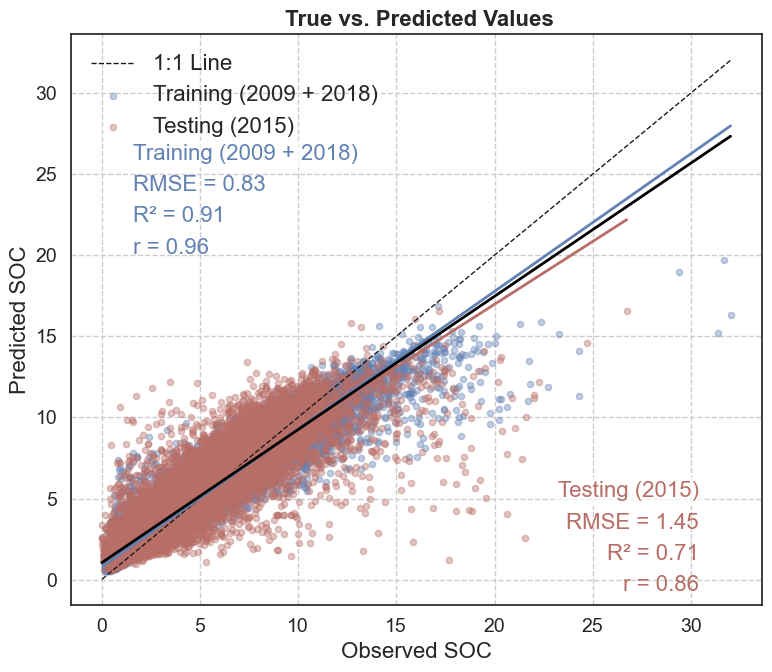

2025-08-06 20:46:39,522 - INFO - ✅ 图 1 完成：所有注释均分行展示，避免重叠，结构清晰美观。


In [24]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress, pearsonr
from sklearn.metrics import mean_squared_error, r2_score

# 设置样式
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 16
plt.rcParams["grid.linestyle"] = "--"

logger.info("\n生成图 1：True vs. Predicted Combined Scatter Plot...")

plt.figure(figsize=(8, 7))
ax = plt.gca()

# 柔和色调
colors = {
    'Training (2009 + 2018)': "#6382B4",  # 柔和蓝
    'Testing (2015)': "#B86E67"           # 柔和红
}

datasets = [
    ('Training (2009 + 2018)', y_train, y_pred_train),
    ('Testing (2015)', y_test, y_pred_test),
]

# 全局 min/max 用于 1:1 线
y_all = np.concatenate([y_train, y_test])
y_pred_all = np.concatenate([y_pred_train, y_pred_test])
all_y = np.concatenate([y_all, y_pred_all])
min_val, max_val = all_y.min(), all_y.max()
ax.plot([min_val, max_val], [min_val, max_val], 'k--', label='1:1 Line', linewidth=1)

# 设置注释位置和行距
padding = (max_val - min_val) * 0.05
line_spacing = padding * 1.2  # 行距大一点，更清晰

text_positions = {
    'Training (2009 + 2018)': {
        'x': min_val + padding,
        'y_base': max_val - padding * 4,  # 向下避开图例
        'ha': 'left'
    },
    'Testing (2015)': {
        'x': max_val - padding,
        'y_base': min_val + padding * 3,
        'ha': 'right'
    }
}

# 绘图主体
for label, y_true, y_pred in datasets:
    color = colors[label]

    # 散点图
    ax.scatter(y_true, y_pred, alpha=0.4, color=color, s=20, label=label)

    # 拟合线（局部）
    x_min, x_max = y_true.min(), y_true.max()
    slope, intercept, _, _, _ = linregress(y_true, y_pred)
    ax.plot([x_min, x_max],
            [slope * x_min + intercept, slope * x_max + intercept],
            color=color, linestyle='-', linewidth=2)

    # 评价指标
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    r2 = r2_score(y_true, y_pred)
    r, _ = pearsonr(y_true, y_pred)

    # 文本注释（统一从 y_base 开始向下排）
    pos = text_positions[label]
    x_pos = pos['x']
    y_base = pos['y_base']
    ha = pos['ha']

    ax.text(x_pos, y_base - 0 * line_spacing,
            f"{label}", fontsize=16, color=color, ha=ha, va='bottom',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=3))
    ax.text(x_pos, y_base - 1 * line_spacing,
            f"RMSE = {rmse:.2f}", fontsize=16, color=color, ha=ha, va='bottom')
    ax.text(x_pos, y_base - 2 * line_spacing,
            f"R² = {r2:.2f}", fontsize=16, color=color, ha=ha, va='bottom')
    ax.text(x_pos, y_base - 3 * line_spacing,
            f"r = {r:.2f}", fontsize=16, color=color, ha=ha, va='bottom')

# 整体拟合线（黑色）
slope_all, intercept_all, _, _, _ = linregress(y_all, y_pred_all)
ax.plot([min_val, max_val],
        [slope_all * min_val + intercept_all, slope_all * max_val + intercept_all],
        color='black', linestyle='-', linewidth=2)

# 图形设置
ax.set_xlabel("Observed SOC", fontsize=16)
ax.set_ylabel("Predicted SOC", fontsize=16)
ax.set_title(" True vs. Predicted Values", fontsize=16, weight='bold')

ax.grid(True)
ax.legend(frameon=False, fontsize=16)

plt.tight_layout()
plt.show()

logger.info("✅ 图 1 完成：所有注释均分行展示，避免重叠，结构清晰美观。")


2025-08-05 11:48:23,575 - INFO - 已保存的模型: [1, 2, 3, 4, 5, 6, 7, 8, 9]
2025-08-05 11:48:23,583 - INFO - 加载绘图数据: E:\Project-yqr\new\model\weight\rf_plotting_data_all_data.joblib
2025-08-05 11:48:23,761 - INFO - ✅ 绘图数据加载完成！
2025-08-05 11:48:23,771 - INFO - 
生成图 1：True vs. Predicted Scatter Plots...
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the 

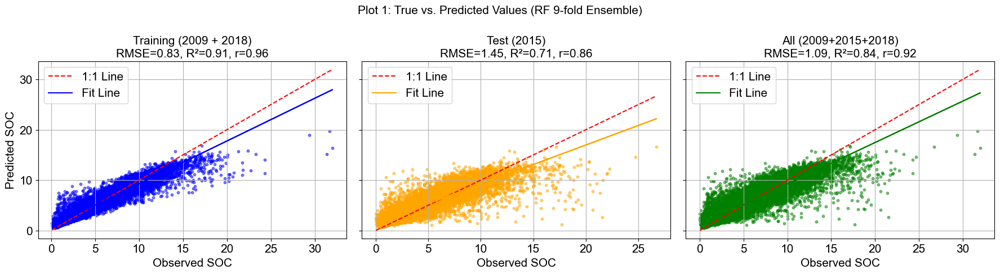

2025-08-05 11:48:26,237 - INFO - ✅ 图 1 完成。该图展示了训练集、测试集和整体预测精度，1:1 线表示理想预测，回归线显示拟合趋势。
2025-08-05 11:48:26,241 - INFO - 
生成图 2：Residuals vs. Predicted (Test)...


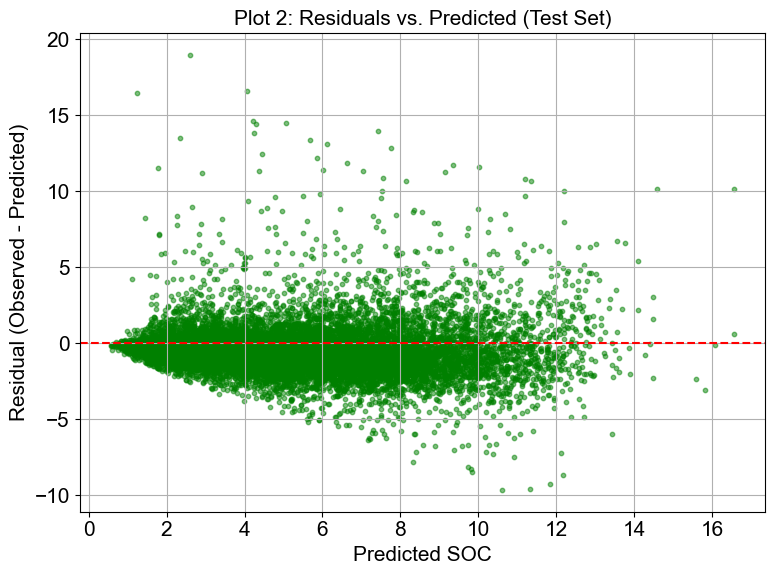

2025-08-05 11:48:26,519 - INFO - ✅ 图 2 完成。用于检测预测误差是否随机分布，理想情况是围绕0均匀散布。
2025-08-05 11:48:26,520 - INFO - 
生成图 3：Residual Histogram (Test)...


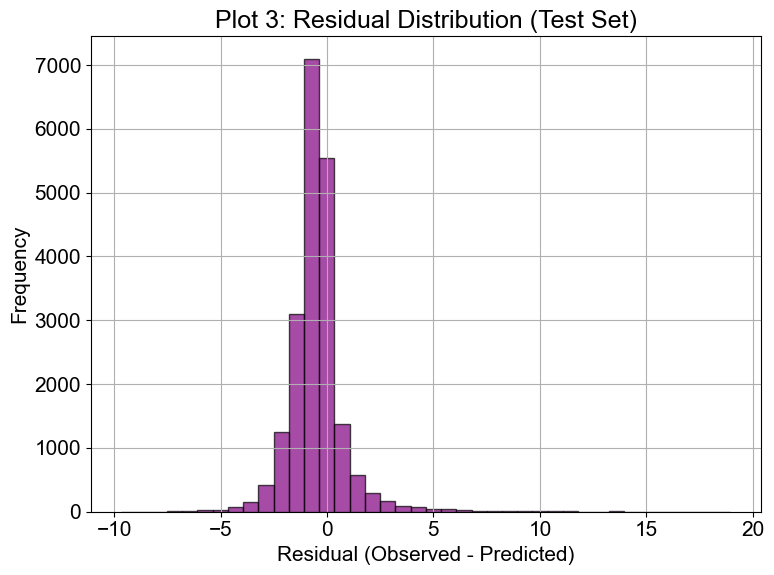

2025-08-05 11:48:26,769 - INFO - ✅ 图 3 完成。该图展示了误差分布是否接近正态。
2025-08-05 11:48:26,769 - INFO - 
生成图 4：Feature Importance...
2025-08-05 11:48:26,773 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_1.joblib
2025-08-05 11:48:33,120 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_2.joblib
2025-08-05 11:48:40,299 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_3.joblib
2025-08-05 11:48:46,199 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_4.joblib
2025-08-05 11:48:51,667 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_5.joblib
2025-08-05 11:48:56,895 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_6.joblib
2025-08-05 11:49:02,273 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_7.joblib
2025-08-05 11:49:08,502 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_8.joblib
2025-08-05 11:49:14,460 - INFO - 加载模型: E:\Project-yqr\new\model\weight\rf_fold_9.joblib


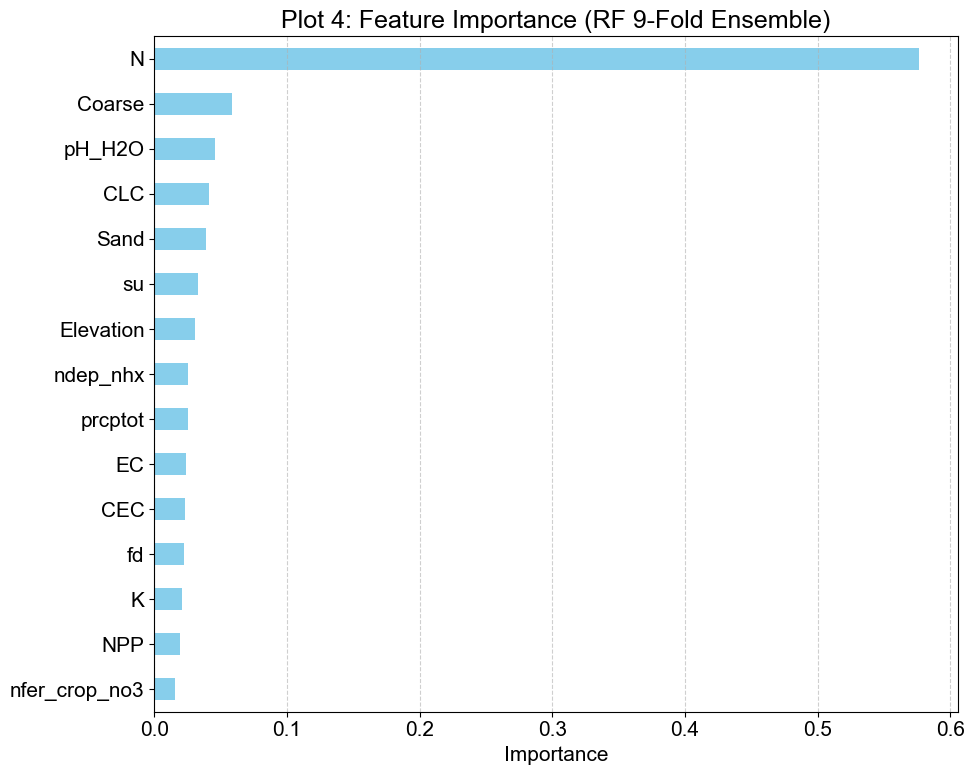

2025-08-05 11:49:24,301 - INFO - ✅ 图 4 完成。展示了各变量对模型的平均贡献度。
2025-08-05 11:49:24,302 - INFO - 
生成图 5：Prediction Uncertainty (Test)...


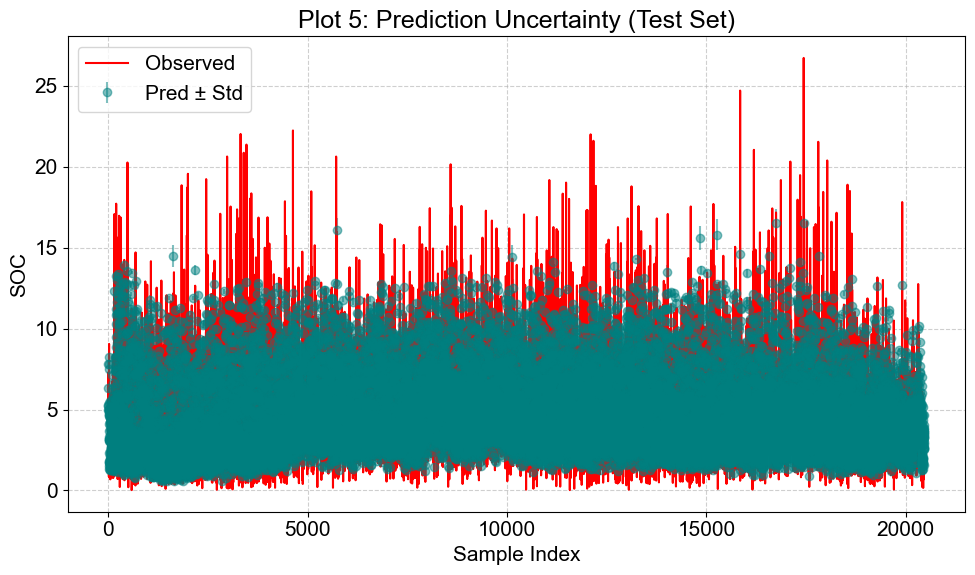

2025-08-05 11:49:25,639 - INFO - ✅ 图 5 完成。展示预测值及其标准差范围与真实值的比较。
2025-08-05 11:49:25,640 - INFO - 
🎉 所有绘图已完成！


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import pearsonr, linregress
from joblib import load
import os
import gc
import logging

# 设置日志
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 路径设置
model_dir = r'E:\Project-yqr\new\model\weight'
plotting_data_path = os.path.join(model_dir, 'rf_plotting_data_all_data.joblib')

# 字体与图像设置
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 15

# 检查已保存的模型
existing_models = [f for f in os.listdir(model_dir) if f.startswith('rf_fold_') and f.endswith('.joblib')]
existing_folds = sorted([int(f.split('_')[2].split('.')[0]) for f in existing_models])
logger.info(f"已保存的模型: {existing_folds}")

# 验证模型数量
if len(existing_folds) != 9 or not all(f in existing_folds for f in range(1, 10)):
    logger.error(f"❌ 预期 9 个模型文件，实际找到 {len(existing_folds)} 个: {existing_folds}")
    exit()

# 加载绘图数据
logger.info(f"加载绘图数据: {plotting_data_path}")
try:
    plotting_data = load(plotting_data_path)
except Exception as e:
    logger.error(f"❌ 绘图数据加载失败: {e}")
    exit()

logger.info("✅ 绘图数据加载完成！")

# 提取数据
y_train = plotting_data['y_train_full']
y_test = plotting_data['y_test']
y_all = plotting_data['y_all']
y_pred_train = plotting_data['y_pred_train']
y_pred_test = plotting_data['y_pred_test']
y_pred_all = plotting_data['y_pred_all']
std_pred_train = plotting_data['std_pred_train']
std_pred_test = plotting_data['std_pred_test']
feature_names = plotting_data['covariate_names']


In [ ]:
# 图1：真值 vs 预测值
logger.info("\n生成图 1：True vs. Predicted Scatter Plots...")
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
datasets = [
    ('Training (2009 + 2018)', y_train, y_pred_train, 'blue'),
    ('Test (2015)', y_test, y_pred_test, 'orange'),
    ('All (2009+2015+2018)', y_all, y_pred_all, 'green')
]

for ax, (title, y_true, y_pred, color) in zip(axs, datasets):
    ax.scatter(y_true, y_pred, alpha=0.5, color=color, s=10)
    min_val, max_val = min(y_true.min(), y_pred.min()), max(y_true.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', label='1:1 Line')
    slope, intercept, _, _, _ = linregress(y_true, y_pred)
    ax.plot(y_true, slope * y_true + intercept, color=color, linestyle='-', label='Fit Line')

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    r2 = r2_score(y_true, y_pred)
    r, _ = pearsonr(y_true, y_pred)

    ax.set_title(f"{title}\nRMSE={rmse:.2f}, R²={r2:.2f}, r={r:.2f}",fontsize=15)
    ax.set_xlabel("Observed SOC")
    ax.grid(True)
    ax.legend()

axs[0].set_ylabel("Predicted SOC")
plt.suptitle("Plot 1: True vs. Predicted Values (RF 9-fold Ensemble)", fontsize=15)
plt.tight_layout()
plt.show()
logger.info("✅ 图 1 完成。该图展示了训练集、测试集和整体预测精度，1:1 线表示理想预测，回归线显示拟合趋势。")


In [ ]:

# 图2：残差 vs 预测值
logger.info("\n生成图 2：Residuals vs. Predicted (Test)...")
residuals = y_test - y_pred_test
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_test, residuals, alpha=0.5, color='green', s=10)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted SOC")
plt.ylabel("Residual (Observed - Predicted)")
plt.title("Plot 2: Residuals vs. Predicted (Test Set)",fontsize=15)
plt.grid(True)
plt.tight_layout()
plt.show()
logger.info("✅ 图 2 完成。用于检测预测误差是否随机分布，理想情况是围绕0均匀散布。")

# 图3：残差分布直方图
logger.info("\n生成图 3：Residual Histogram (Test)...")
plt.figure(figsize=(8, 6))
plt.hist(residuals, bins=40, color='purple', edgecolor='black', alpha=0.7)
plt.title("Plot 3: Residual Distribution (Test Set)")
plt.xlabel("Residual (Observed - Predicted)")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()
logger.info("✅ 图 3 完成。该图展示了误差分布是否接近正态。")

# 图4：特征重要性
logger.info("\n生成图 4：Feature Importance...")
try:
    importances_list = []
    for fold_idx in range(1, 10):
        model_path = os.path.join(model_dir, f'rf_fold_{fold_idx}.joblib')
        logger.info(f"加载模型: {model_path}")
        model = load(model_path)
        importances_list.append(model.feature_importances_)
        del model
        gc.collect()
    importances = np.mean(importances_list, axis=0)
    fi_series = pd.Series(importances, index=feature_names).sort_values()

    plt.figure(figsize=(10, 8))
    fi_series.plot(kind='barh', color='skyblue')
    plt.xlabel("Importance")
    plt.title("Plot 4: Feature Importance (RF 9-Fold Ensemble)")
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
    logger.info("✅ 图 4 完成。展示了各变量对模型的平均贡献度。")
except Exception as e:
    logger.error(f"❌ 图 4 生成失败: {e}")

# 图5：预测不确定性
logger.info("\n生成图 5：Prediction Uncertainty (Test)...")
plt.figure(figsize=(10, 6))
plt.errorbar(range(len(y_pred_test)), y_pred_test, yerr=std_pred_test, fmt='o', color='teal', alpha=0.5, label='Pred ± Std')
plt.plot(range(len(y_test)), y_test.values, 'r-', label='Observed')
plt.xlabel("Sample Index")
plt.ylabel("SOC")
plt.title("Plot 5: Prediction Uncertainty (Test Set)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()
logger.info("✅ 图 5 完成。展示预测值及其标准差范围与真实值的比较。")

logger.info("\n🎉 所有绘图已完成！")

## 3年SOC分布地图

2025-08-04 23:38:51,047 - INFO - ✅ 使用 Arial 字体: C:\Windows\Fonts\arial.ttf
2025-08-04 23:38:54,206 - INFO - ✅ 加载 2009, shape=(8528, 10865), max=18.13
2025-08-04 23:38:57,043 - INFO - ✅ 加载 2015, shape=(8528, 10865), max=18.16
2025-08-04 23:38:59,572 - INFO - ✅ 加载 2018, shape=(8528, 10865), max=18.24
D:\Temp\ipykernel_9484\4014675231.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


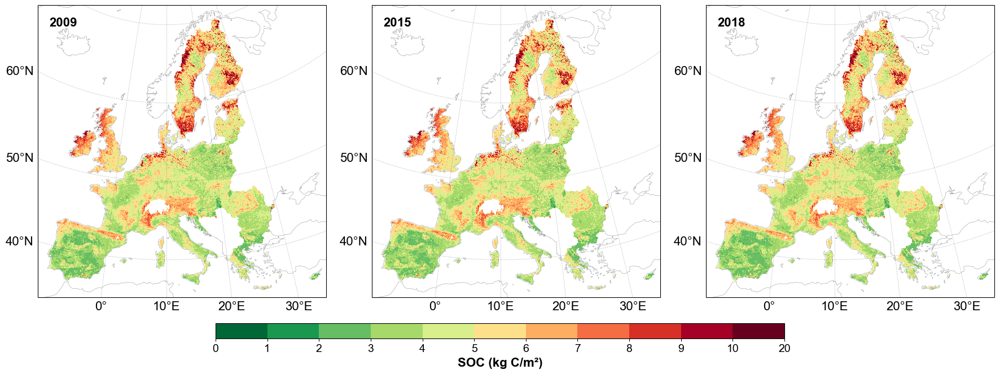

2025-08-04 23:40:40,249 - INFO - ✅ 完整图生成成功（Windows 字体兼容，路径修正）


In [20]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import logging
import gc
import matplotlib.font_manager as fm

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# ✅ 【1】路径兼容（改为 Windows 路径）
input_dir = r'E:\Project-yqr\new\results\weight'  # ← 改成你本地 Windows 的盘符路径
years = [2009, 2015, 2018]
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# ✅ 【2】色带设置（保持不变）
bounds = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20]
colors = [
    "#006837", "#1a9850", "#66bd63", "#a6d96a", "#d9ef8b",
    "#fee08b", "#fdae61", "#f46d43", "#d73027", "#a50026", "#67001f"
]
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=len(colors))

# ✅ 【3】字体兼容：Windows Arial / 自动 fallback
try:
    arial_path = fm.findfont("Arial")
    plt.rcParams["font.family"] = "Arial"
    logger.info(f"✅ 使用 Arial 字体: {arial_path}")
except:
    plt.rcParams["font.family"] = "DejaVu Sans"
    logger.warning("⚠️ Arial 字体未找到，已自动回退为 DejaVu Sans")

plt.rcParams["font.size"] = 16

# 读取数据
datasets = []
for year in years:
    path = os.path.join(input_dir, f'weight_pred_{year}.tif')
    if not os.path.exists(path):
        logger.warning(f"❌ 文件不存在: {path}")
        continue
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        masked = np.ma.masked_invalid(data)
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
        datasets.append((year, masked, extent))
        logger.info(f"✅ 加载 {year}, shape={masked.shape}, max={np.nanmax(masked):.2f}")

# 创建子图
fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})

for ax, (year, data, extent) in zip(axes, datasets):
    ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
    im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                   transform=ccrs.PlateCarree(), origin='upper')

    ax.text(0.04, 0.96, str(year), transform=ax.transAxes,
            fontsize=16, fontweight='bold', va='top', ha='left')

    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
    gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size': 16, 'rotation': 0}
    gl.ylabel_style = {'size': 16, 'rotation': 0}

# colorbar
cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=bounds)
cb.ax.set_xticklabels([str(b) for b in bounds], fontsize=14)
cb.set_label("SOC (kg C/m²)", fontsize=16, weight='bold')
cb.ax.tick_params(labelsize=14)

plt.tight_layout()
plt.show()
gc.collect()
logger.info("✅ 完整图生成成功（Windows 字体兼容，路径修正）")


## 3年SOC差值分布图

2025-08-08 17:55:30,559 - INFO - ✅ 使用 Arial 字体: C:\Windows\Fonts\arial.ttf
2025-08-08 17:55:34,506 - INFO - ✅ 加载 2015-2009, shape=(8528, 10865), max=2.29, min=-3.18
2025-08-08 17:55:37,297 - INFO - ✅ 加载 2018-2015, shape=(8528, 10865), max=3.31, min=-2.18
2025-08-08 17:55:40,800 - INFO - ✅ 加载 2018-2009, shape=(8528, 10865), max=2.37, min=-2.94
D:\Temp\ipykernel_20628\1642622156.py:90: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


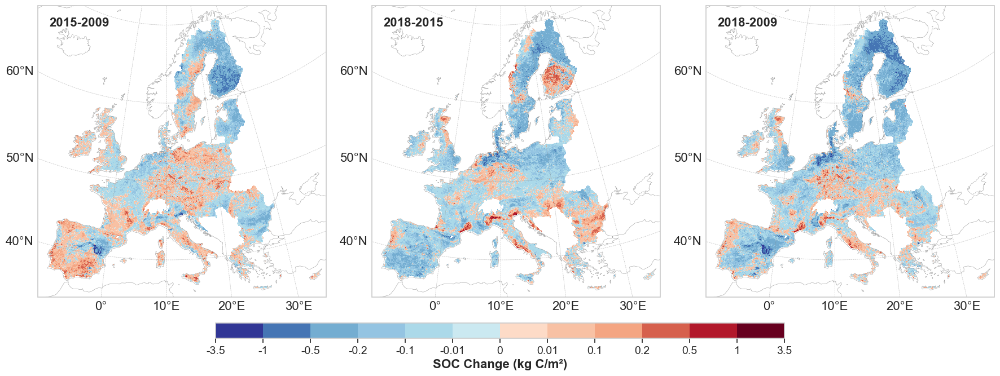

2025-08-08 17:57:30,998 - INFO - ✅ 差值图生成成功（未保存图片）


In [38]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import logging
import gc
import matplotlib.font_manager as fm

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 路径
input_dir = r'E:\Project-yqr\new\results\weight'
diff_pairs = [("2015-2009", "2015-2009"), ("2018-2015", "2018-2015"), ("2018-2009", "2018-2009")]
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 非对称发散色带设置
bounds = [-3.5, -1, -0.5, -0.2, -0.1, -0.01, 0, 0.01, 0.1, 0.2, 0.5, 1, 3.5]
colors = [
    "#313695", "#4575b4", "#74add1", "#94c4e2", "#abd9e9", "#cbe9f1",  # 负值蓝色系
    "#fddbc7", "#f8c1a4", "#f4a582", "#d6604d", "#b2182b", "#67001f"   # 正值红色系
]
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=len(colors))

# 字体兼容
try:
    arial_path = fm.findfont("Arial")
    plt.rcParams["font.family"] = "Arial"
    logger.info(f"✅ 使用 Arial 字体: {arial_path}")
except:
    plt.rcParams["font.family"] = "DejaVu Sans"
    logger.warning("⚠️ Arial 字体未找到，已自动回退为 DejaVu Sans")
plt.rcParams["font.size"] = 16

# 读取差值栅格
datasets = []
for label, title in diff_pairs:
    path = os.path.join(input_dir, f'weight_pred_diff_{label}.tif')
    if not os.path.exists(path):
        logger.warning(f"❌ 文件不存在: {path}")
        continue
    try:
        with rasterio.open(path) as src:
            data = src.read(1).astype(np.float32)
            data[data <= -9999] = np.nan  # 处理无效值
            masked = np.ma.masked_invalid(data)
            extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
            datasets.append((title, masked, extent))
            logger.info(f"✅ 加载 {title}, shape={masked.shape}, max={np.nanmax(masked):.2f}, min={np.nanmin(masked):.2f}")
    except Exception as e:
        logger.error(f"❌ 加载 {title} 失败: {str(e)}")
        continue

# 创建子图
fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})

for ax, (title, data, extent) in zip(axes, datasets):
    ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
    im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                   transform=ccrs.PlateCarree(), origin='upper')

    ax.text(0.04, 0.96, title, transform=ax.transAxes,
            fontsize=16, fontweight='bold', va='top', ha='left')

    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
    gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size': 16, 'rotation': 0}
    gl.ylabel_style = {'size': 16, 'rotation': 0}

# 色带
cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=bounds)
cb.ax.set_xticklabels([str(b) for b in bounds], fontsize=14)
cb.set_label("SOC Change (kg C/m²)", fontsize=16, weight='bold')
cb.ax.tick_params(labelsize=14)

plt.tight_layout()
plt.show()
gc.collect()
logger.info("✅ 差值图生成成功（未保存图片）")

2025-08-08 17:49:58,040 - INFO - ✅ 使用 Arial 字体: C:\Windows\Fonts\arial.ttf
2025-08-08 17:50:02,385 - INFO - ✅ 加载 2015-2009, shape=(8528, 10865), max=2.29, min=-3.18
2025-08-08 17:50:05,692 - INFO - ✅ 加载 2018-2015, shape=(8528, 10865), max=3.31, min=-2.18
2025-08-08 17:50:08,972 - INFO - ✅ 加载 2018-2009, shape=(8528, 10865), max=2.37, min=-2.94
D:\Temp\ipykernel_20628\1445868235.py:90: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


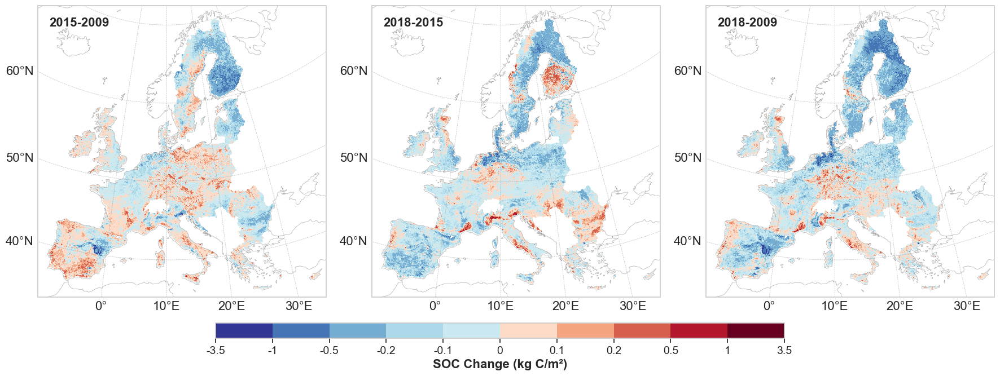

2025-08-08 17:52:06,141 - INFO - ✅ 差值图生成成功（未保存图片）


In [37]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import logging
import gc
import matplotlib.font_manager as fm

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 路径
input_dir = r'E:\Project-yqr\new\results\weight'
diff_pairs = [(2015, 2009, "2015-2009"), (2018, 2015, "2018-2015"), (2018, 2009, "2018-2009")]
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 非对称发散色带设置
bounds = [-3.5, -1, -0.5, -0.2, -0.1, 0, 0.1, 0.2, 0.5, 1, 3.5]
colors = [
    "#313695", "#4575b4", "#74add1", "#abd9e9", "#cbe9f1",  # 负值蓝色系
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"   # 正值红色系
]
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=len(colors))

# 字体兼容
try:
    arial_path = fm.findfont("Arial")
    plt.rcParams["font.family"] = "Arial"
    logger.info(f"✅ 使用 Arial 字体: {arial_path}")
except:
    plt.rcParams["font.family"] = "DejaVu Sans"
    logger.warning("⚠️ Arial 字体未找到，已自动回退为 DejaVu Sans")
plt.rcParams["font.size"] = 16

# 读取差值栅格
datasets = []
for year2, year1, label in diff_pairs:
    path = os.path.join(input_dir, f'weight_pred_diff_{label}.tif')
    if not os.path.exists(path):
        logger.warning(f"❌ 文件不存在: {path}")
        continue
    try:
        with rasterio.open(path) as src:
            data = src.read(1).astype(np.float32)
            data[data <= -9999] = np.nan  # 处理无效值
            masked = np.ma.masked_invalid(data)
            extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
            datasets.append((label, masked, extent))
            logger.info(f"✅ 加载 {label}, shape={masked.shape}, max={np.nanmax(masked):.2f}, min={np.nanmin(masked):.2f}")
    except Exception as e:
        logger.error(f"❌ 加载 {label} 失败: {str(e)}")
        continue

# 创建子图
fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})

for ax, (label, data, extent) in zip(axes, datasets):
    ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
    im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                   transform=ccrs.PlateCarree(), origin='upper')

    ax.text(0.04, 0.96, label, transform=ax.transAxes,
            fontsize=16, fontweight='bold', va='top', ha='left')

    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
    gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = True
    gl.xlabel_style = {'size': 16, 'rotation': 0}
    gl.ylabel_style = {'size': 16, 'rotation': 0}

# 色带
cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=bounds)
cb.ax.set_xticklabels([str(b) for b in bounds], fontsize=14)
cb.set_label("SOC Change (kg C/m²)", fontsize=16, weight='bold')
cb.ax.tick_params(labelsize=14)

plt.tight_layout()
plt.show()
gc.collect()
logger.info("✅ 差值图生成成功（未保存图片）")

## 3年SOC分布箱线图

D:\Temp\ipykernel_18376\1357535407.py:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df_all.groupby('Year').apply(lambda x: x.sample(min(len(x), 1000))).reset_index(drop=True)


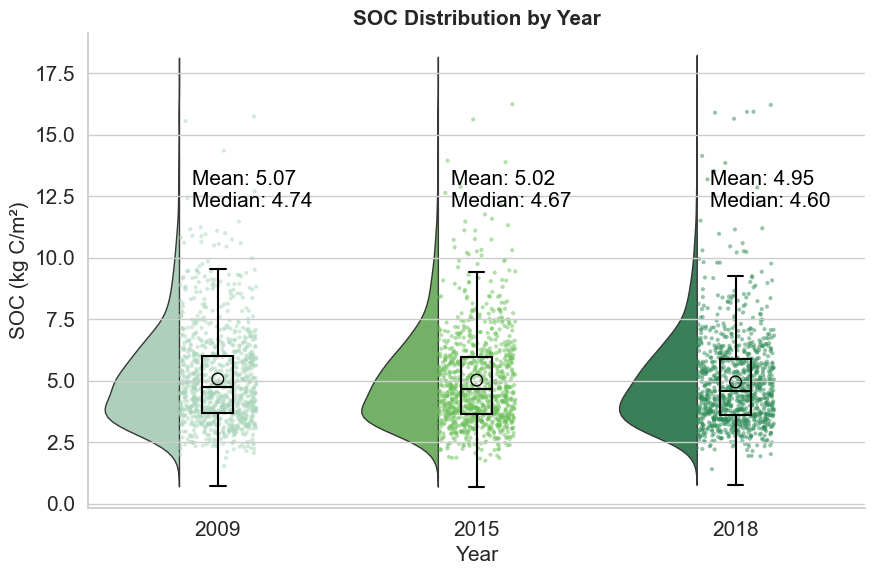

In [6]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ptitprince as pt
import rasterio

# 设置字体
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 15

# 栅格路径
soc_rasters = {
    2009: r'E:\Project-yqr\new/results/weight/weight_pred_2009.tif',
    2015: r'E:\Project-yqr\new/results/weight/weight_pred_2015.tif',
    2018: r'E:\Project-yqr\new/results/weight/weight_pred_2018.tif',
}

# 从栅格中读取 SOC 值并转为 DataFrame（不含 nan）
def read_soc_to_df(path, year):
    with rasterio.open(path) as src:
        soc = src.read(1).astype(np.float32)
        soc[soc <= -9999] = np.nan
        values = soc[~np.isnan(soc)]
        return pd.DataFrame({'SOC': values, 'Year': str(year)})

# 合并所有年份数据
df_all = pd.concat([
    read_soc_to_df(path, year)
    for year, path in soc_rasters.items()
], ignore_index=True)

# ✅ 绿色系调色板
green_palette = ['#A8D5BA', '#6BBF59', '#2E8B57']
year_order = sorted(df_all['Year'].unique())
palette_dict = dict(zip(year_order, green_palette))

# ✅ 可视化：半小提琴 + 箱线 + 散点图
plt.figure(figsize=(9, 6))
ax = plt.gca()

# 半小提琴图
pt.half_violinplot(x='Year', y='SOC', data=df_all,
                   palette=palette_dict, bw=.2, cut=0., scale="area", zorder=-1,
                   width=.6, inner=None, orient="v", linewidth=1)

# 箱线图
sns.boxplot(x='Year', y='SOC', data=df_all,
            width=.12, color="black", zorder=10,
            showcaps=True,
            boxprops={'facecolor': 'none', "zorder": 10, "edgecolor": "black"},
            whiskerprops={"linewidth": 1.5, "zorder": 10},
            medianprops={"color": "black", "linewidth": 1.5},
            showfliers=False)

# 散点图（抽样部分点以避免过密）
np.random.seed(42)
sampled_df = df_all.groupby('Year').apply(lambda x: x.sample(min(len(x), 1000))).reset_index(drop=True)
sns.stripplot(x='Year', y='SOC', data=sampled_df,
              palette=palette_dict, size=3, jitter=0.15, zorder=0, alpha=0.5)

# 标注平均值和中位数
for i, year in enumerate(year_order):
    mean_val = df_all[df_all['Year'] == year]['SOC'].mean()
    median_val = df_all[df_all['Year'] == year]['SOC'].median()
    ax.scatter(i, mean_val, facecolor='none', marker="o", edgecolor="black", s=70, zorder=100)
    ax.text(i - 0.1, df_all['SOC'].max() - 5.5,
            f'Mean: {mean_val:.2f}\nMedian: {median_val:.2f}',
            ha='left', va='center', color='black', fontsize=15)
# 轴标签与样式
plt.ylabel("SOC (kg C/m²)", fontsize=15)
plt.xlabel("Year", fontsize=15)
plt.title("SOC Distribution by Year", fontsize=15, weight='bold')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
sns.despine(trim=False)
plt.tight_layout()
plt.show()


## SOC变化趋势

2025-08-08 16:47:46,055 - INFO - ✅ 读取完成，shape=(8528, 10865), max=0.2640, min=-0.3464
2025-08-08 16:47:46,538 - INFO - 负值像素比例: 72.79%
2025-08-08 16:47:47,037 - INFO - 正值像素比例: 27.21%
D:\Temp\ipykernel_20628\3930200260.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.12, 1, 1])


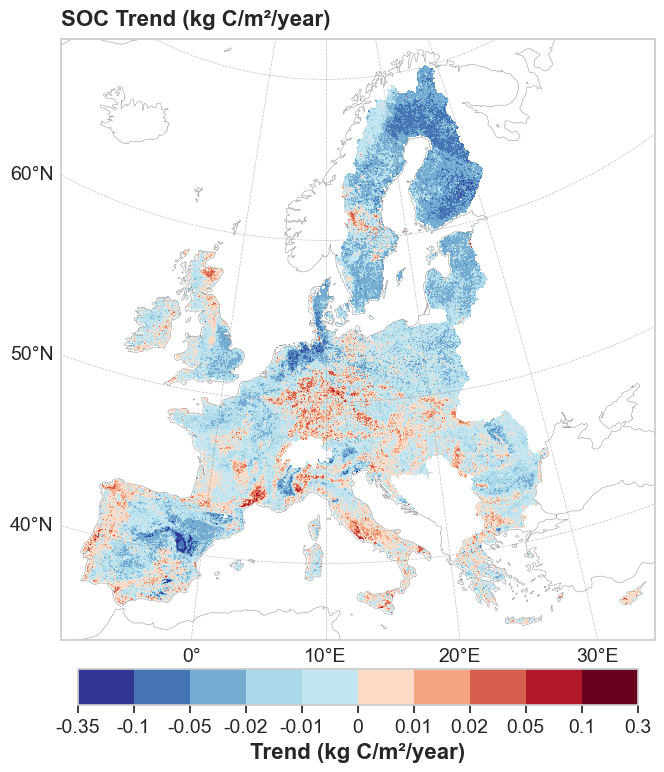

2025-08-08 16:48:19,117 - INFO - ✅ 非对称色带图（0 处蓝红分界）绘制完成


In [32]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import logging
import gc

# 日志设置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 参数路径与投影
input_path = r"E:/Project-yqr/new/results/weight/trend_outputs/soc_trend_slope.tif"
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 设置非对称边界（在 0 附近明确分界）
bounds = [-0.35, -0.1, -0.05, -0.02, -0.01,0, 0.01, 0.02, 0.05, 0.1, 0.3]
colors = [
    "#313695", "#4575b4", "#74add1", "#abd9e9",  "#c3e6f1",
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"  
]
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=len(colors))

# 设置字体
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 16

# 读取数据
with rasterio.open(input_path) as src:
    data = src.read(1).astype(np.float32)
    data[data <= -9999] = np.nan  # 处理无效值
    data[data == 0] = np.nan  # 过滤 0 值
    masked = np.ma.masked_invalid(data)
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    logger.info(f"✅ 读取完成，shape={masked.shape}, max={np.nanmax(masked):.4f}, min={np.nanmin(masked):.4f}")
    logger.info(f"负值像素比例: {np.sum(masked < 0) / np.sum(np.isfinite(masked)) * 100:.2f}%")
    logger.info(f"正值像素比例: {np.sum(masked > 0) / np.sum(np.isfinite(masked)) * 100:.2f}%")

# 创建图
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': map_crs})
ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())

# 显示栅格图
im = ax.imshow(masked, cmap=cmap, norm=norm, extent=extent,
               transform=ccrs.PlateCarree(), origin='upper')

# 加海岸线
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

# 加经纬网
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = True
gl.left_labels = True
gl.xlabel_style = {'size': 14, 'rotation': 0}
gl.ylabel_style = {'size': 14, 'rotation': 0}

# 标题
ax.set_title("SOC Trend (kg C/m²/year)", fontsize=16, weight='bold', loc='left', pad=10)

# 色带（单一水平色带，0 处分界）
cbar_ax = fig.add_axes([0.22, 0.1, 0.56, 0.045])
cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=bounds)
cb.ax.set_xticklabels([str(b) for b in bounds], fontsize=14)
cb.set_label("Trend (kg C/m²/year)", fontsize=16, weight='bold')
cb.ax.tick_params(labelsize=14)

plt.tight_layout(rect=[0, 0.12, 1, 1])
plt.show()
gc.collect()

logger.info("✅ 非对称色带图（0 处蓝红分界）绘制完成")

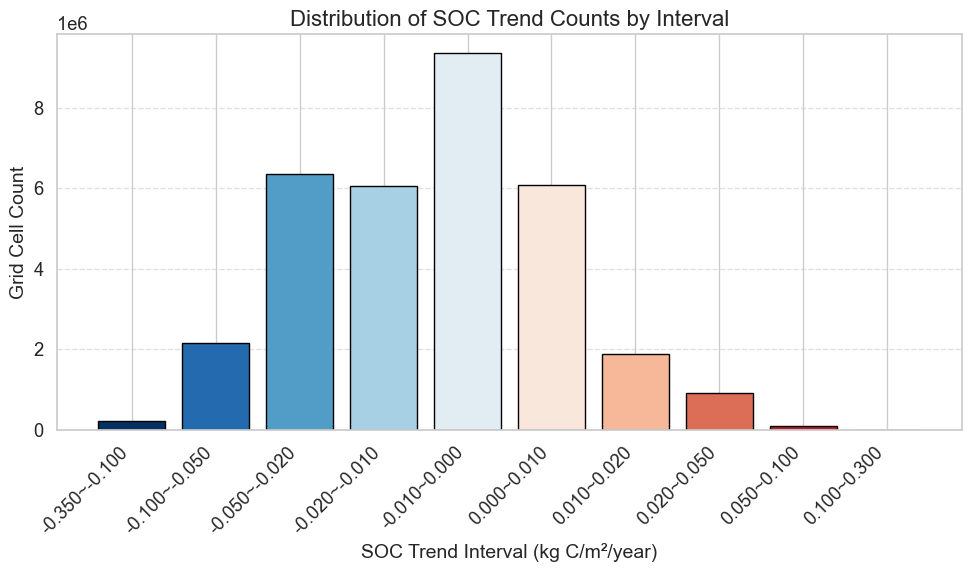

In [31]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# 读取趋势栅格数据
with rasterio.open(r"E:/Project-yqr/new/results/weight/trend_outputs/soc_trend_slope.tif") as src:
    data = src.read(1).astype(np.float32)
    data[data < -999] = np.nan  # nodata处理
    data = data[~np.isnan(data)]  # 去掉nan
    data = data[data != 0]  # 去掉0

# 新的区间边界
bins = [-0.35, -0.1, -0.05, -0.02, -0.01, 0, 0.01, 0.02, 0.05, 0.1, 0.3]

# 计算各区间落点数
counts, _ = np.histogram(data, bins=bins)

# 配色 蓝-红渐变，颜色数 = 区间数 - 1
colors = plt.get_cmap('RdBu_r')(np.linspace(0, 1, len(counts)))

# 画柱状图
plt.figure(figsize=(10,6))
bin_labels = [f'{bins[i]:.3f}~{bins[i+1]:.3f}' for i in range(len(bins)-1)]
bars = plt.bar(bin_labels, counts, color=colors, edgecolor='black')

plt.xlabel('SOC Trend Interval (kg C/m²/year)', fontsize=14)
plt.ylabel('Grid Cell Count', fontsize=14)
plt.title('Distribution of SOC Trend Counts by Interval', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [17]:
import rasterio
import numpy as np

trend_path = r"E:/Project-yqr/new/results/weight/trend_outputs/soc_trend_slope.tif"

with rasterio.open(trend_path) as src:
    data = src.read(1).astype(np.float32)
    data = data[data > -9999]  # 去除无效值
    #data = data[data != 0]  # 去除0值


print("统计信息：")
print(f"最小值: {np.nanmin(data):.4f}")
print(f"最大值: {np.nanmax(data):.4f}")
print(f"均值: {np.nanmean(data):.4f}")
print(f"中位数: {np.nanmedian(data):.4f}")
print(f"25%分位数: {np.nanpercentile(data, 25):.4f}")
print(f"75%分位数: {np.nanpercentile(data, 75):.4f}")
print(f"正值像元占比: {(data > 0).sum() / data.size:.2%}")
print(f"负值像元占比: {(data < 0).sum() / data.size:.2%}")


统计信息：
最小值: -0.3464
最大值: 0.2640
均值: -0.0126
中位数: -0.0079
25%分位数: -0.0210
75%分位数: 0.0008
正值像元占比: 27.21%
负值像元占比: 72.79%


## 固定因子

### CLC

#### 地图

2025-08-07 17:50:07,278 - INFO - ✅ 加载 abs 2015, max=1.936, min=-2.880
2025-08-07 17:50:08,298 - INFO - ✅ 加载 abs 2018, max=2.059, min=-2.574


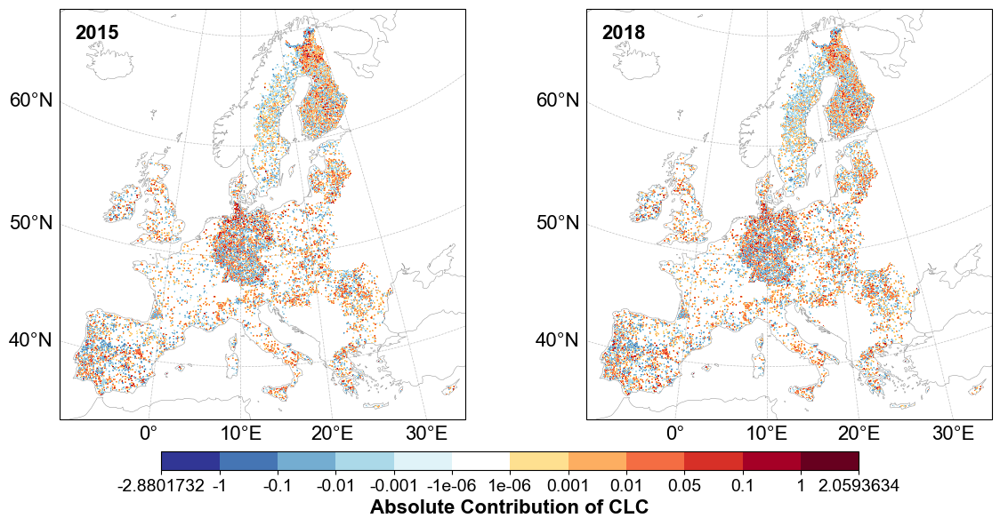

2025-08-07 17:51:06,873 - INFO - ✅ 成功绘制 abs 贡献图
2025-08-07 17:51:08,304 - INFO - ✅ 加载 rel 2015, max=0.366, min=-0.684
2025-08-07 17:51:09,494 - INFO - ✅ 加载 rel 2018, max=0.368, min=-0.647


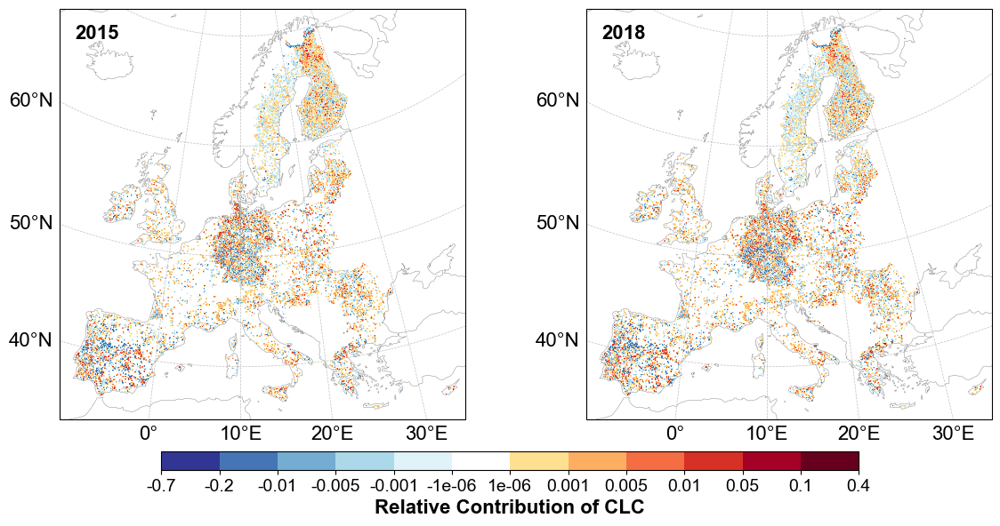

2025-08-07 17:52:07,156 - INFO - ✅ 成功绘制 rel 贡献图


In [5]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import logging
import gc

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 设置冻结变量
freeze_var = 'CLC'
years = [2015, 2018]
output_dir = fr'E:/Project-yqr/new/results/weight/freeze/{freeze_var}/contribution'
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 字体设置
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 16

# 颜色：中间白色，对应 0
color_palette = [
    "#313695", "#4575b4", "#74add1", "#abd9e9", "#e0f3f8",  # 蓝（负）
    "#FFFFFF",  # 中间白色
    "#fee090", "#fdae61", "#f46d43", "#d73027", "#a50026", "#67001f"  # 红（正）
]

def load_dataset(path):
    if not os.path.exists(path):
        logger.warning(f"❌ 文件不存在: {path}")
        return None
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        # 不掩码0，保持数据完整
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
        return data, extent

def get_dynamic_color_bounds(contrib_type, datasets):
    # 原始边界
    base_bounds = {
        'abs': [-2.5, -1, -0.1, -0.01, -0.001, -0.000001, 0.000001, 0.001, 0.01, 0.05, 0.1, 1, 2],
        'rel': [-0.7, -0.2, -0.01, -0.005, -0.001, -0.000001, 0.000001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.4]
    }
    
    # 收集所有数据以计算最大值和最小值
    all_data = []
    for _, data, _ in datasets:
        all_data.append(data)
    all_data = np.concatenate([data.ravel() for data in all_data])
    data_max = np.nanmax(all_data)
    data_min = np.nanmin(all_data)
    
    # 只替换最大值和最小值
    bounds = base_bounds[contrib_type].copy()
    if data_min < bounds[0]:
        bounds[0] = data_min
    if data_max > bounds[-1]:
        bounds[-1] = data_max
    
    return bounds

def plot_contribution(contrib_type, title_label):
    datasets = []
    for year in years:
        tif_path = os.path.join(output_dir, f'{contrib_type}_contrib_{freeze_var}_{year}.tif')
        result = load_dataset(tif_path)
        if result:
            data, extent = result
            datasets.append((year, data, extent))
            logger.info(f"✅ 加载 {contrib_type} {year}, max={np.nanmax(data):.3f}, min={np.nanmin(data):.3f}")

    if not datasets:
        logger.error(f"❌ 无有效数据: {contrib_type}")
        return

    # 动态调整 color_bounds 的最大值和最小值
    bounds = get_dynamic_color_bounds(contrib_type, datasets)
    cmap = mcolors.ListedColormap(color_palette[:len(bounds)-1])
    norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1)

    fig, axes = plt.subplots(1, len(datasets), figsize=(14, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]

    for ax, (year, data, extent) in zip(axes, datasets):
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                       transform=ccrs.PlateCarree(), origin='upper')

        ax.text(0.04, 0.96, str(year), transform=ax.transAxes,
                fontsize=16, fontweight='bold', va='top', ha='left')

        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True
        gl.xlabel_style = {'size': 16, 'rotation': 0}
        gl.ylabel_style = {'size': 16, 'rotation': 0}

    cbar_ax = fig.add_axes([0.22, 0.015, 0.56, 0.035])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=bounds)
    labels = []
    for b in bounds:
        if abs(b) < 1e-8:
            labels.append('0')
        else:
            labels.append(str(b))
    cb.ax.set_xticklabels(labels, fontsize=14)
    cb.set_label(title_label, fontsize=16, weight='bold')
    cb.ax.tick_params(labelsize=14)

    plt.show()
    gc.collect()
    logger.info(f"✅ 成功绘制 {contrib_type} 贡献图")

# 分别绘制
plot_contribution('abs', f"Absolute Contribution of {freeze_var}")
plot_contribution('rel', f"Relative Contribution of {freeze_var}")

2025-08-07 17:39:25,465 - INFO - ✅ 加载 abs 2015, max=1.936, min=-2.880
2025-08-07 17:39:26,734 - INFO - ✅ 加载 abs 2018, max=2.059, min=-2.574


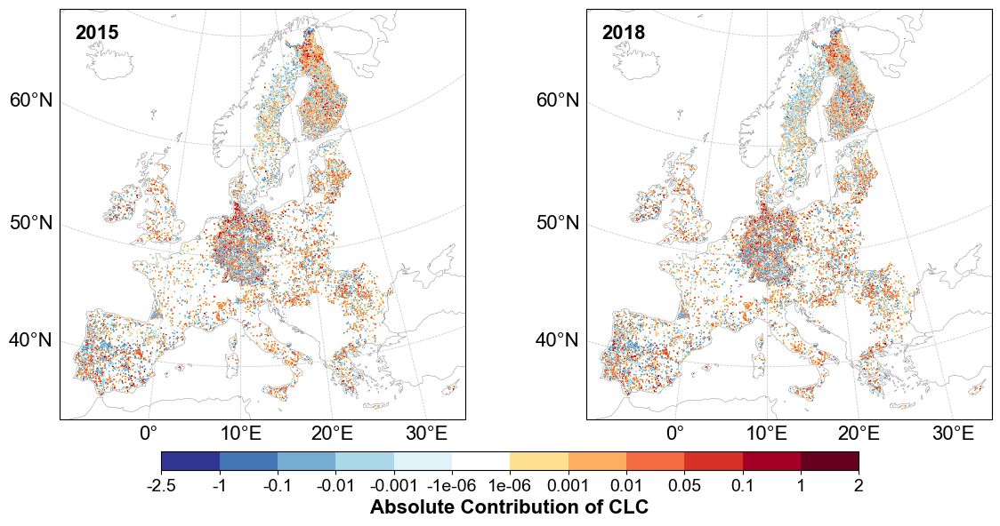

2025-08-07 17:40:21,788 - INFO - ✅ 成功绘制 abs 贡献图
2025-08-07 17:40:23,514 - INFO - ✅ 加载 rel 2015, max=0.366, min=-0.684
2025-08-07 17:40:24,665 - INFO - ✅ 加载 rel 2018, max=0.368, min=-0.647


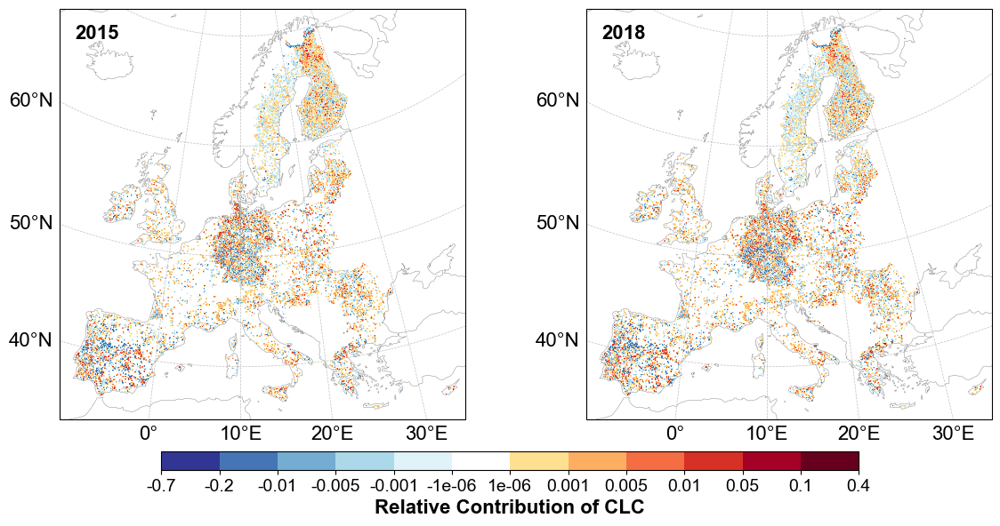

2025-08-07 17:41:19,821 - INFO - ✅ 成功绘制 rel 贡献图


In [2]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import logging
import gc

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 设置冻结变量
freeze_var = 'CLC'
years = [2015, 2018]
output_dir = fr'E:/Project-yqr/new/results/weight/freeze/{freeze_var}/contribution'
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 字体设置
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 16

# 色带边界（更新后），注意：必须包含 0！
color_bounds = {
    'abs': [-2.5, -1, -0.1, -0.01, -0.001, -0.000001,0.000001, 0.001, 0.01, 0.05, 0.1, 1, 2],
    'rel': [-0.7, -0.2, -0.01, -0.005, -0.001,-0.000001,0.000001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.4]
}

# 颜色：中间白色，对应 0
color_palette = [
    "#313695", "#4575b4", "#74add1", "#abd9e9", "#e0f3f8",  # 蓝（负）
    "#FFFFFF",  # 中间白色
    "#fee090", "#fdae61", "#f46d43", "#d73027", "#a50026", "#67001f"  # 红（正）
]

def load_dataset(path):
    if not os.path.exists(path):
        logger.warning(f"❌ 文件不存在: {path}")
        return None
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        # 不掩码0，保持数据完整
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
        return data, extent

def plot_contribution(contrib_type, title_label):
    bounds = color_bounds[contrib_type]
    cmap = mcolors.ListedColormap(color_palette[:len(bounds)-1])
    norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1)

    datasets = []
    for year in years:
        tif_path = os.path.join(output_dir, f'{contrib_type}_contrib_{freeze_var}_{year}.tif')
        result = load_dataset(tif_path)
        if result:
            data, extent = result
            datasets.append((year, data, extent))
            logger.info(f"✅ 加载 {contrib_type} {year}, max={np.nanmax(data):.3f}, min={np.nanmin(data):.3f}")

    if not datasets:
        logger.error(f"❌ 无有效数据: {contrib_type}")
        return

    fig, axes = plt.subplots(1, len(datasets), figsize=(14, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]

    for ax, (year, data, extent) in zip(axes, datasets):
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                       transform=ccrs.PlateCarree(), origin='upper')

        ax.text(0.04, 0.96, str(year), transform=ax.transAxes,
                fontsize=16, fontweight='bold', va='top', ha='left')

        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True
        gl.xlabel_style = {'size': 16, 'rotation': 0}
        gl.ylabel_style = {'size': 16, 'rotation': 0}

    cbar_ax = fig.add_axes([0.22, 0.015, 0.56, 0.035])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=bounds)
    labels = []
    for b in bounds:
        if abs(b) < 1e-8:
            labels.append('0')
        else:
            labels.append(str(b))
    cb.ax.set_xticklabels(labels, fontsize=14)
    cb.set_label(title_label, fontsize=16, weight='bold')
    cb.ax.tick_params(labelsize=14)

    plt.show()
    gc.collect()
    logger.info(f"✅ 成功绘制 {contrib_type} 贡献图")

# 分别绘制
plot_contribution('abs', f"Absolute Contribution of {freeze_var}")
plot_contribution('rel', f"Relative Contribution of {freeze_var}")


#### 柱状图

2025-08-08 17:31:13,327 - INFO - 开始处理冻结变量: su
2025-08-08 17:31:15,042 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33063598
2025-08-08 17:31:15,121 - INFO - 过滤 0 后，2015 数据点数: 28190405
2025-08-08 17:31:16,927 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33063612
2025-08-08 17:31:17,010 - INFO - 过滤 0 后，2018 数据点数: 31753492
2025-08-08 17:31:17,128 - INFO - su 全局统计: 最小值=-0.6, 最大值=0.4
D:\Temp\ipykernel_20628\3713834642.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'], as_index=False)
2025-08-08 17:31:22,375 - INFO - su 分组计数:
2025-08-08 17:31:22,377 - INFO - Year=2015, Bin=-0.6~-0.2, Count=36005
2025-08-08 17:31:22,378 - INFO - Year=2018, Bin=-0.6~-0.2, Count=40399
2025-08-08 17:31:22,378 - INFO - Year=2015, Bin=-0.2~-0.01, Count=4449563
2025-08-08 17:31:22,379 - INFO

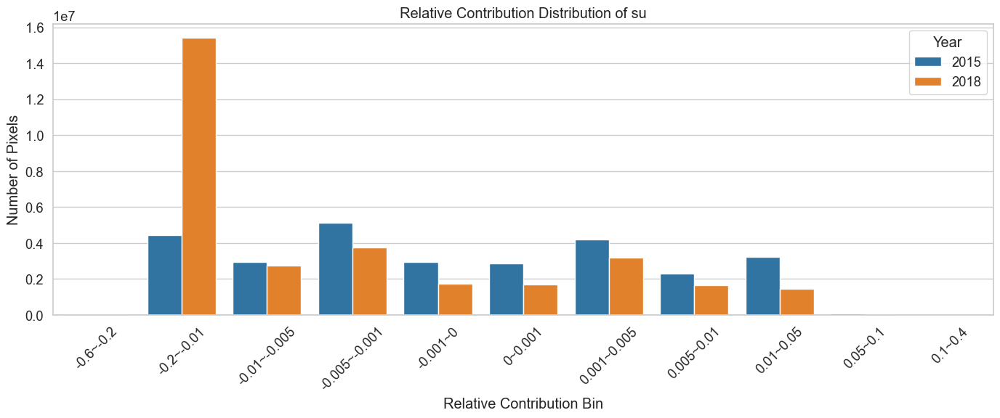

2025-08-08 17:31:23,063 - INFO - ✅ 成功绘制 su 柱状图（未保存）
2025-08-08 17:31:23,280 - INFO - 开始处理冻结变量: CLC
2025-08-08 17:31:24,238 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33152989
2025-08-08 17:31:24,389 - INFO - 过滤 0 后，2015 数据点数: 4204814
2025-08-08 17:31:25,407 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33153002
2025-08-08 17:31:25,522 - INFO - 过滤 0 后，2018 数据点数: 4555740
2025-08-08 17:31:25,570 - INFO - CLC 全局统计: 最小值=-0.7, 最大值=0.4
D:\Temp\ipykernel_20628\3713834642.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'], as_index=False)
2025-08-08 17:31:26,380 - INFO - CLC 分组计数:
2025-08-08 17:31:26,380 - INFO - Year=2015, Bin=-0.7~-0.2, Count=3911
2025-08-08 17:31:26,381 - INFO - Year=2018, Bin=-0.7~-0.2, Count=2951
2025-08-08 17:31:26,382 - INFO - Year=2015, Bin=-0.2~

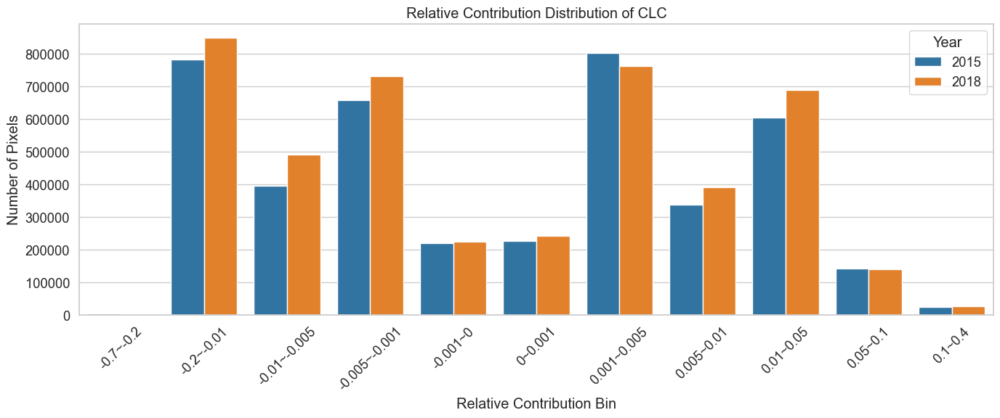

2025-08-08 17:31:26,800 - INFO - ✅ 成功绘制 CLC 柱状图（未保存）
2025-08-08 17:31:26,834 - INFO - 开始处理冻结变量: NPP
2025-08-08 17:31:28,476 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33063579
2025-08-08 17:31:28,558 - INFO - 过滤 0 后，2015 数据点数: 31904674
2025-08-08 17:31:30,131 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33063580
2025-08-08 17:31:30,239 - INFO - 过滤 0 后，2018 数据点数: 32045813
2025-08-08 17:31:30,370 - INFO - NPP 全局统计: 最小值=-0.6, 最大值=0.4
D:\Temp\ipykernel_20628\3713834642.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'], as_index=False)
2025-08-08 17:31:35,915 - INFO - NPP 分组计数:
2025-08-08 17:31:35,917 - INFO - Year=2015, Bin=-0.6~-0.2, Count=637
2025-08-08 17:31:35,918 - INFO - Year=2018, Bin=-0.6~-0.2, Count=1633
2025-08-08 17:31:35,919 - INFO - Year=2015, Bin=-0.

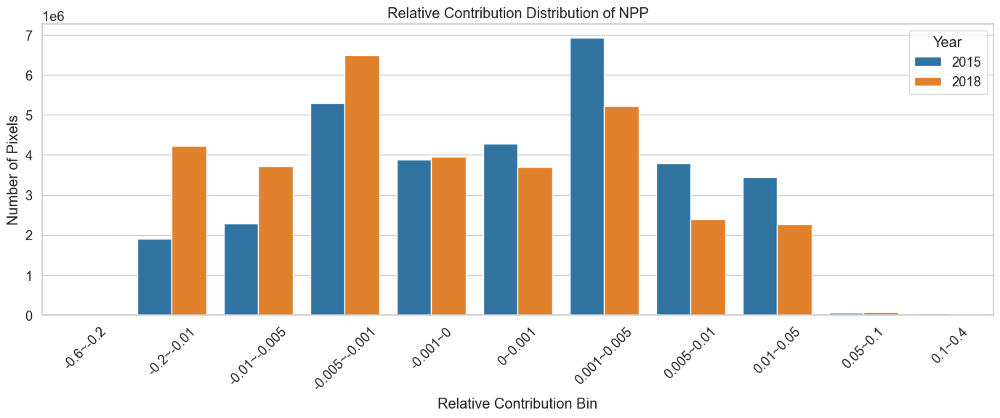

2025-08-08 17:31:36,304 - INFO - ✅ 成功绘制 NPP 柱状图（未保存）
2025-08-08 17:31:36,461 - INFO - 开始处理冻结变量: nfer_crop_no3
2025-08-08 17:31:39,513 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33063598
2025-08-08 17:31:39,594 - INFO - 过滤 0 后，2015 数据点数: 25721982
2025-08-08 17:31:41,007 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33063612
2025-08-08 17:31:41,070 - INFO - 过滤 0 后，2018 数据点数: 25775305
2025-08-08 17:31:41,166 - INFO - nfer_crop_no3 全局统计: 最小值=-0.2, 最大值=0.4
D:\Temp\ipykernel_20628\3713834642.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'], as_index=False)
2025-08-08 17:31:46,197 - INFO - nfer_crop_no3 分组计数:
2025-08-08 17:31:46,198 - INFO - Year=2015, Bin=-0.2~-0.2, Count=0
2025-08-08 17:31:46,198 - INFO - Year=2018, Bin=-0.2~-0.2, Count=0
2025-08-08 17:31:46,199 - 

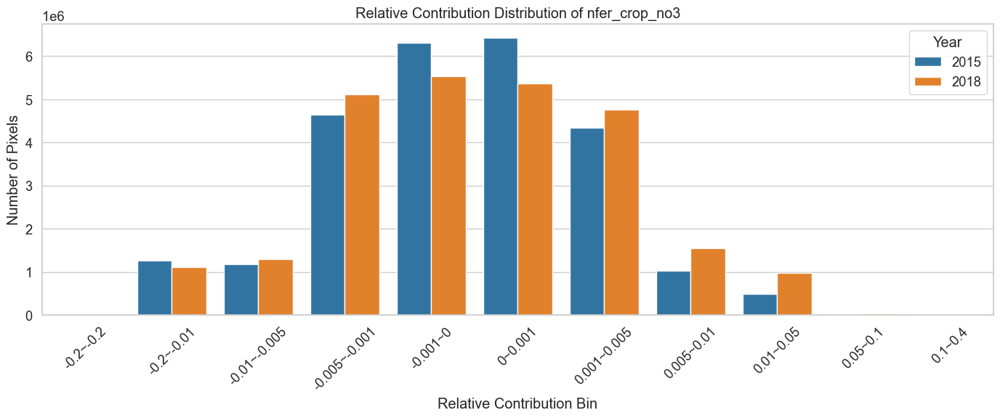

2025-08-08 17:31:46,587 - INFO - ✅ 成功绘制 nfer_crop_no3 柱状图（未保存）
2025-08-08 17:31:46,714 - INFO - 开始处理冻结变量: ndep_nhx
2025-08-08 17:31:48,130 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33152989
2025-08-08 17:31:48,203 - INFO - 过滤 0 后，2015 数据点数: 32952707
2025-08-08 17:31:49,749 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33153002
2025-08-08 17:31:49,834 - INFO - 过滤 0 后，2018 数据点数: 32958836
2025-08-08 17:31:50,025 - INFO - ndep_nhx 全局统计: 最小值=-0.2, 最大值=0.3
D:\Temp\ipykernel_20628\3713834642.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'], as_index=False)
2025-08-08 17:31:55,722 - INFO - ndep_nhx 分组计数:
2025-08-08 17:31:55,723 - INFO - Year=2015, Bin=-0.2~-0.2, Count=0
2025-08-08 17:31:55,724 - INFO - Year=2018, Bin=-0.2~-0.2, Count=0
2025-08-08 17:31:55,725 - INFO 

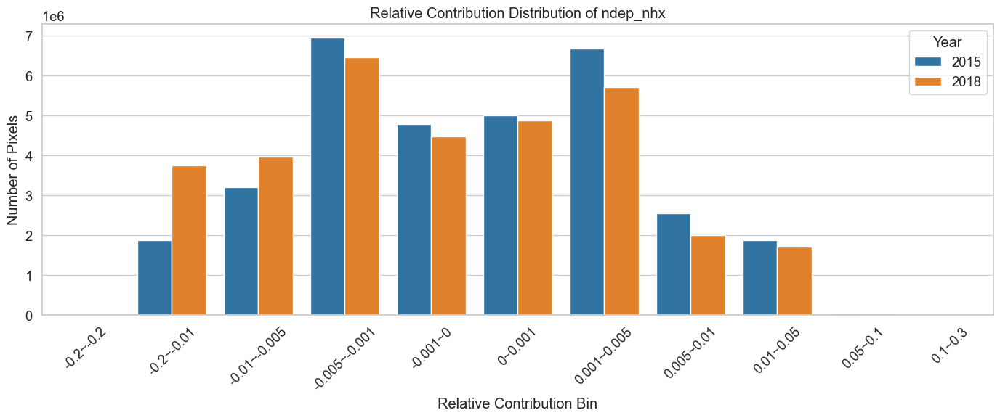

2025-08-08 17:31:56,153 - INFO - ✅ 成功绘制 ndep_nhx 柱状图（未保存）
2025-08-08 17:31:56,335 - INFO - 开始处理冻结变量: fd
2025-08-08 17:31:57,853 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33063598
2025-08-08 17:31:57,920 - INFO - 过滤 0 后，2015 数据点数: 31940430
2025-08-08 17:31:59,556 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33063612
2025-08-08 17:31:59,629 - INFO - 过滤 0 后，2018 数据点数: 31830652
2025-08-08 17:31:59,761 - INFO - fd 全局统计: 最小值=-0.2, 最大值=0.4
D:\Temp\ipykernel_20628\3713834642.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'], as_index=False)
2025-08-08 17:32:05,436 - INFO - fd 分组计数:
2025-08-08 17:32:05,437 - INFO - Year=2015, Bin=-0.2~-0.2, Count=0
2025-08-08 17:32:05,438 - INFO - Year=2018, Bin=-0.2~-0.2, Count=0
2025-08-08 17:32:05,439 - INFO - Year=2015, Bin=-0.2~-

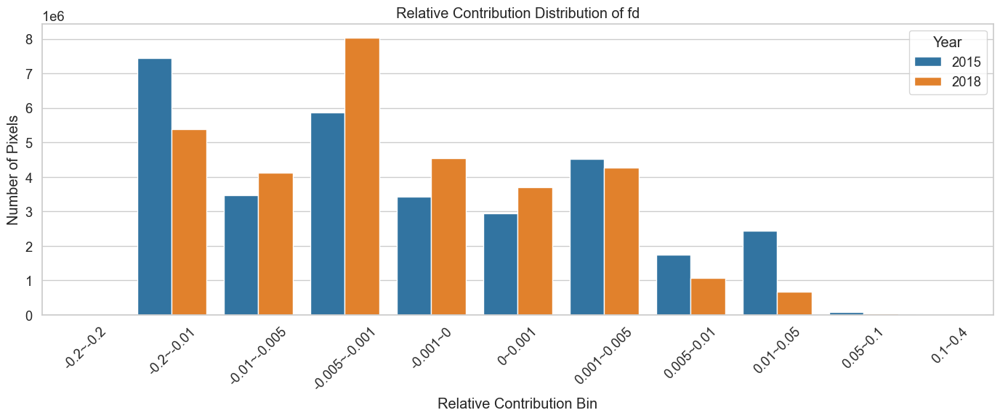

2025-08-08 17:32:05,801 - INFO - ✅ 成功绘制 fd 柱状图（未保存）
2025-08-08 17:32:05,981 - INFO - 开始处理冻结变量: prcptot
2025-08-08 17:32:07,484 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33063598
2025-08-08 17:32:07,551 - INFO - 过滤 0 后，2015 数据点数: 32944236
2025-08-08 17:32:08,986 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33063612
2025-08-08 17:32:09,053 - INFO - 过滤 0 后，2018 数据点数: 32978665
2025-08-08 17:32:09,157 - INFO - prcptot 全局统计: 最小值=-1.1, 最大值=0.4
D:\Temp\ipykernel_20628\3713834642.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'], as_index=False)
2025-08-08 17:32:14,498 - INFO - prcptot 分组计数:
2025-08-08 17:32:14,499 - INFO - Year=2015, Bin=-1.1~-0.2, Count=19639
2025-08-08 17:32:14,500 - INFO - Year=2018, Bin=-1.1~-0.2, Count=6081
2025-08-08 17:32:14,500 - INFO - Year=

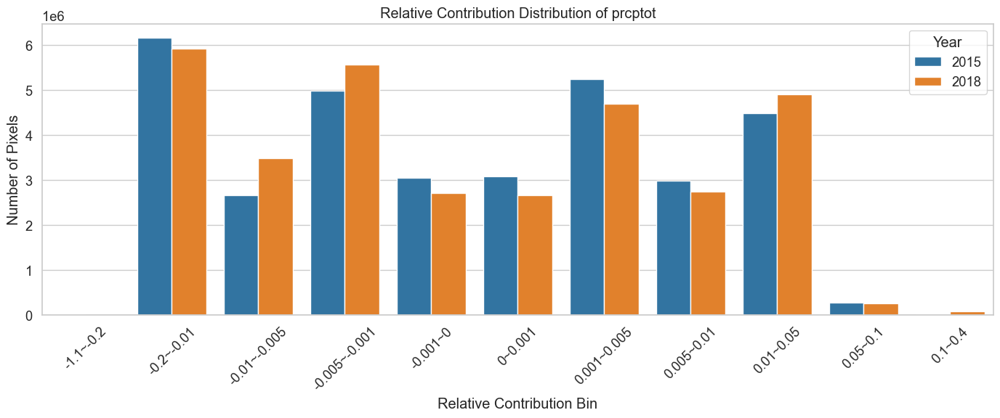

2025-08-08 17:32:14,874 - INFO - ✅ 成功绘制 prcptot 柱状图（未保存）
2025-08-08 17:32:15,083 - INFO - 所有变量的柱状图绘制完成！


In [36]:
import os
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
import logging

# 设置日志
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 参数
variables = ['su', 'CLC', 'NPP', 'nfer_crop_no3', 'ndep_nhx', 'fd', 'prcptot']
years = [2015, 2018]
base_bins = [-0.2, -0.01, -0.005, -0.001, 0, 0.001, 0.005, 0.01, 0.05, 0.1]  # 包含 0 作为边界
year_colors = {2015: '#1f77b4', 2018: '#ff7f0e'}  # 蓝色 for 2015，橙色 for 2018

def process_variable(freeze_var):
    output_dir = f'E:/Project-yqr/new/results/weight/freeze/{freeze_var}/contribution'
    logger.info(f"开始处理冻结变量: {freeze_var}")

    # 初始化
    data_all = []
    all_contributions = []

    # 读取数据
    for year in years:
        with rasterio.open(os.path.join(output_dir, f'rel_contrib_{freeze_var}_{year}.tif')) as src:
            data = src.read(1).astype(np.float32)
            total_pixels = np.prod(data.shape)  # 总像元数
            data = data[np.isfinite(data)]  # 移除 NaN 和无穷值
            logger.info(f"加载 {year} 数据，原始数据点数: {total_pixels}, 有效数据点数: {len(data)}")
            data = data[data != 0]  # 过滤掉值为 0 的数据
            logger.info(f"过滤 0 后，{year} 数据点数: {len(data)}")
            all_contributions.append(data)
            data_all.append((year, data))

    # 检查数据是否为空
    if not all_contributions:
        logger.error(f"{freeze_var}: 所有数据均为 0 或 NaN，无法处理")
        raise ValueError(f"{freeze_var}: 所有数据均为 0 或 NaN，无法处理")

    # 计算全局最大值和最小值
    all_contributions = np.concatenate(all_contributions)
    data_max = round(np.nanmax(all_contributions), 1)
    data_min = round(np.nanmin(all_contributions), 1)
    logger.info(f"{freeze_var} 全局统计: 最小值={data_min:.1f}, 最大值={data_max:.1f}")

    # 动态调整 bins，确保单调递增
    abs_bins = [data_min] + base_bins + [data_max]
    abs_bins = sorted(set(abs_bins))  # 确保唯一且递增
    if not all(abs_bins[i] < abs_bins[i+1] for i in range(len(abs_bins)-1)):
        logger.error(f"{freeze_var}: bins 未单调递增: {abs_bins}")
        raise ValueError(f"{freeze_var}: bins must increase monotonically.")

    # 格式化 bin_labels
    bin_labels = []
    for i in range(len(abs_bins)-1):
        start = f"{abs_bins[i]:.1f}" if i == 0 else f"{abs_bins[i]}"  # 最小值保留一位
        end = f"{abs_bins[i+1]:.1f}" if i == len(abs_bins)-2 else f"{abs_bins[i+1]}"  # 最大值保留一位
        bin_labels.append(f"{start}~{end}")

    # 创建 DataFrame
    data_all_df = []
    for year, data in data_all:
        data = data[(data >= abs_bins[0]) & (data <= abs_bins[-1])]  # 截断极值
        df = pd.DataFrame({
            'Contribution': data,
            'Year': year,
            'Bin': pd.cut(data, bins=abs_bins, labels=bin_labels, include_lowest=True)
        })
        data_all_df.append(df)

    df_all = pd.concat(data_all_df, ignore_index=True)

    # 分组计数
    count_data = (
        df_all.groupby(['Year', 'Bin'], as_index=False)
        .size()
        .rename(columns={'size': 'Count'})
    )

    # 保证 Bin 顺序
    count_data['Bin'] = pd.Categorical(count_data['Bin'], categories=bin_labels, ordered=True)
    count_data = count_data.sort_values(by=['Bin', 'Year'])

    # 打印分组计数
    logger.info(f"{freeze_var} 分组计数:")
    for _, row in count_data.iterrows():
        logger.info(f"Year={row['Year']}, Bin={row['Bin']}, Count={row['Count']}")

    # 绘图设置
    sns.set(style="whitegrid", font="Arial", font_scale=1.2)
    fig, ax = plt.subplots(figsize=(14, 6))

    # 绘制柱状图
    sns.barplot(
        data=count_data,
        x='Bin',
        y='Count',
        hue='Year',
        palette=year_colors,
        ax=ax
    )

    # 设置标题和标签
    ax.set_title(f"Relative Contribution Distribution of {freeze_var}")
    ax.set_xlabel("Relative Contribution Bin")
    ax.set_ylabel("Number of Pixels")
    ax.tick_params(axis='x', rotation=45)
    ax.legend(title='Year')

    plt.tight_layout()
    plt.show()

    logger.info(f"✅ 成功绘制 {freeze_var} 柱状图（未保存）")

# 遍历所有变量
for freeze_var in variables:
    try:
        process_variable(freeze_var)
    except Exception as e:
        logger.error(f"处理 {freeze_var} 时发生错误: {str(e)}")
        continue

logger.info("所有变量的柱状图绘制完成！")

D:\Temp\ipykernel_20628\2984857400.py:59: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_all.groupby(['Year', 'Bin'])
C:\Users\lenovo\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:253: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\lenovo\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:253: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warn

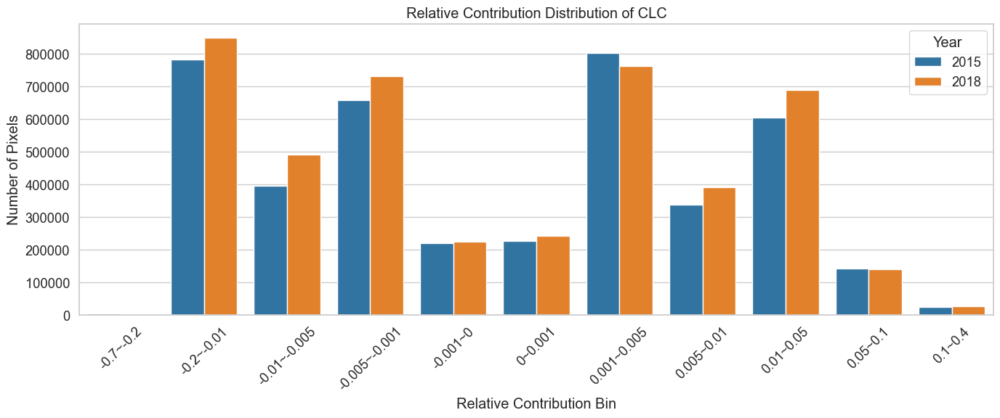

In [14]:
import os
import numpy as np
import rasterio
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 参数
freeze_var = 'CLC'
output_dir = f'E:/Project-yqr/new/results/weight/freeze/{freeze_var}/contribution'
years = [2015, 2018]
base_bins = [-0.2, -0.01, -0.005, -0.001, 0, 0.001, 0.005, 0.01, 0.05, 0.1]  # 包含 0 作为边界

# 自定义年份颜色（2015 和 2018 各一种颜色）
year_colors = {2015: '#1f77b4', 2018: '#ff7f0e'}  # 蓝色 for 2015，橙色 for 2018

# 初始化
data_all = []
all_contributions = []

for year in years:
    with rasterio.open(os.path.join(output_dir, f'rel_contrib_{freeze_var}_{year}.tif')) as src:
        data = src.read(1).astype(np.float32)
        data = data[np.isfinite(data)]  # 移除 NaN 和无穷值
        # 过滤掉值为 0 的数据
        data = data[data != 0]
        all_contributions.append(data)
        data_all.append((year, data))

# 计算全局最大值和最小值
all_contributions = np.concatenate([data for _, data in data_all])
data_max = round(np.nanmax(all_contributions), 1)
data_min = round(np.nanmin(all_contributions), 1)

# 动态调整 bins
abs_bins = [data_min] + base_bins + [data_max]
# 格式化 bin_labels，确保最大值和最小值保留小数点后一位
bin_labels = []
for i in range(len(abs_bins)-1):
    start = f"{abs_bins[i]:.1f}" if i == 0 else f"{abs_bins[i]}"  # 最小值保留一位
    end = f"{abs_bins[i+1]:.1f}" if i == len(abs_bins)-2 else f"{abs_bins[i+1]}"  # 最大值保留一位
    bin_labels.append(f"{start}~{end}")

# 创建 DataFrame
data_all_df = []
for year, data in data_all:
    data = data[(data >= abs_bins[0]) & (data <= abs_bins[-1])]  # 截断极值
    df = pd.DataFrame({
        'Contribution': data,
        'Year': year,
        'Bin': pd.cut(data, bins=abs_bins, labels=bin_labels, include_lowest=True)
    })
    data_all_df.append(df)

df_all = pd.concat(data_all_df, ignore_index=True)

# ===== 🎯 1. 分组计数 =====
count_data = (
    df_all.groupby(['Year', 'Bin'])
    .size()
    .reset_index(name='Count')
)

# 保证 Bin 顺序
count_data['Bin'] = pd.Categorical(count_data['Bin'], categories=bin_labels, ordered=True)
count_data = count_data.sort_values(by=['Bin', 'Year'])

# ===== 🎨 绘图 =====
sns.set(style="whitegrid", font="Arial", font_scale=1.2)
fig, ax = plt.subplots(figsize=(14, 6))

# 为每个年份绘制柱状图，使用单一颜色区分年份
sns.barplot(
    data=count_data,
    x='Bin',
    y='Count',
    hue='Year',
    palette=year_colors,  # 使用单一颜色区分年份
    ax=ax
)

ax.set_title(f"Relative Contribution Distribution of {freeze_var}")
ax.set_xlabel("Relative Contribution Bin")
ax.set_ylabel("Number of Pixels")
ax.tick_params(axis='x', rotation=45)
ax.legend(title='Year')

plt.tight_layout()
plt.show()

In [34]:
import os
import numpy as np
import pandas as pd
import rasterio
import logging

# 设置日志
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 参数
variables = ['su', 'CLC', 'NPP', 'nfer_crop_no3', 'ndep_nhx', 'fd', 'prcptot']
years = [2015, 2018]

def process_variable(freeze_var):
    output_dir = f'E:/Project-yqr/new/results/weight/freeze/{freeze_var}/contribution'
    logger.info(f"开始处理冻结变量: {freeze_var}")

    # 栅格路径
    rel_contrib_rasters = {
        2015: os.path.join(output_dir, f'rel_contrib_{freeze_var}_2015.tif'),
        2018: os.path.join(output_dir, f'rel_contrib_{freeze_var}_2018.tif'),
    }

    # 从栅格中读取相对贡献值并转为 DataFrame（不含 nan）
    def read_rel_contrib_to_df(path, year):
        with rasterio.open(path) as src:
            data = src.read(1).astype(np.float32)
            data[data <= -9999] = np.nan  # 处理无效值
            total_pixels = np.prod(data.shape)  # 总像元数
            data = data[np.isfinite(data)]  # 移除 NaN 和无穷值
            valid_pixels = len(data)  # 有效像元数
            logger.info(f"加载 {year} 数据，原始数据点数: {total_pixels}, 有效数据点数: {valid_pixels}")
            return pd.DataFrame({'Relative Contribution': data, 'Year': str(year)}), valid_pixels

    # 合并所有年份数据
    df_all = []
    valid_pixels_dict = {}
    for year, path in rel_contrib_rasters.items():
        df_year, valid_pixels = read_rel_contrib_to_df(path, year)
        df_all.append(df_year)
        valid_pixels_dict[year] = valid_pixels

    df_all = pd.concat(df_all, ignore_index=True)

    # 检查数据是否为空
    if len(df_all) == 0:
        logger.error(f"{freeze_var}: 所有数据均为 NaN，无法计算统计信息")
        raise ValueError(f"{freeze_var}: 所有数据均为 NaN，无法计算统计信息")

    # 计算并记录统计信息
    for year in years:
        contrib = df_all[df_all['Year'] == str(year)]['Relative Contribution']
        if len(contrib) > 0:
            min_val = contrib.min()
            max_val = contrib.max()
            mean_val = contrib.mean()
            median_val = contrib.median()
            pos_ratio = np.sum(contrib > 0) / len(contrib) * 100  # 正像元占比
            neg_ratio = np.sum(contrib < 0) / len(contrib) * 100  # 负像元占比
            logger.info(f"{freeze_var} {year} 统计: 最小值={min_val:.3f}, 最大值={max_val:.3f}, 平均值={mean_val:.3f}, 中位数={median_val:.3f}, 正像元占比={pos_ratio:.2f}%, 负像元占比={neg_ratio:.2f}%")
        else:
            logger.warning(f"{freeze_var} {year}: 无有效数据")

    logger.info(f"✅ 成功处理 {freeze_var} 统计信息")

# 遍历所有变量
for freeze_var in variables:
    try:
        process_variable(freeze_var)
    except Exception as e:
        logger.error(f"处理 {freeze_var} 时发生错误: {str(e)}")
        continue

logger.info("所有变量的统计信息处理完成！")

2025-08-08 17:19:53,711 - INFO - 开始处理冻结变量: su
2025-08-08 17:19:55,144 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33063598
2025-08-08 17:19:57,026 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33063612
2025-08-08 17:20:02,519 - INFO - su 2015 统计: 最小值=-0.589, 最大值=0.353, 平均值=-0.001, 中位数=0.000, 正像元占比=38.36%, 负像元占比=46.90%
2025-08-08 17:20:07,376 - INFO - su 2018 统计: 最小值=-0.643, 最大值=0.359, 平均值=-0.017, 中位数=-0.008, 正像元占比=24.46%, 负像元占比=71.58%
2025-08-08 17:20:07,377 - INFO - ✅ 成功处理 su 统计信息
2025-08-08 17:20:07,725 - INFO - 开始处理冻结变量: CLC
2025-08-08 17:20:08,663 - INFO - 加载 2015 数据，原始数据点数: 92656720, 有效数据点数: 33152989
2025-08-08 17:20:10,127 - INFO - 加载 2018 数据，原始数据点数: 92656720, 有效数据点数: 33153002
2025-08-08 17:20:15,621 - INFO - CLC 2015 统计: 最小值=-0.684, 最大值=0.366, 平均值=-0.000, 中位数=0.000, 正像元占比=6.46%, 负像元占比=6.22%
2025-08-08 17:20:20,313 - INFO - CLC 2018 统计: 最小值=-0.647, 最大值=0.368, 平均值=-0.000, 中位数=0.000, 正像元占比=6.79%, 负像元占比=6.95%
2025-08-08 17:20:20,314 - INFO - ✅ 成功处理 CLC 统计信息
2025-08-08 17:20:20,660

## su

### 地图

2025-08-07 18:07:45,742 - INFO - ✅ 加载 abs 2015, max=1.749, min=-2.170
2025-08-07 18:07:47,424 - INFO - ✅ 加载 abs 2018, max=1.841, min=-2.194
2025-08-07 18:07:47,672 - INFO - 计算 abs 数据范围: max=1.841, min=-2.194
2025-08-07 18:07:47,673 - INFO - 原始 abs 边界: [-2.5, -1, -0.1, -0.01, -0.001, -1e-06, 1e-06, 0.001, 0.01, 0.05, 0.1, 1, 2]
2025-08-07 18:07:47,674 - INFO - 调整后 abs 边界: [-2.2, -1, -0.1, -0.01, -0.001, -1e-06, 1e-06, 0.001, 0.01, 0.05, 0.1, 1, 1.8]


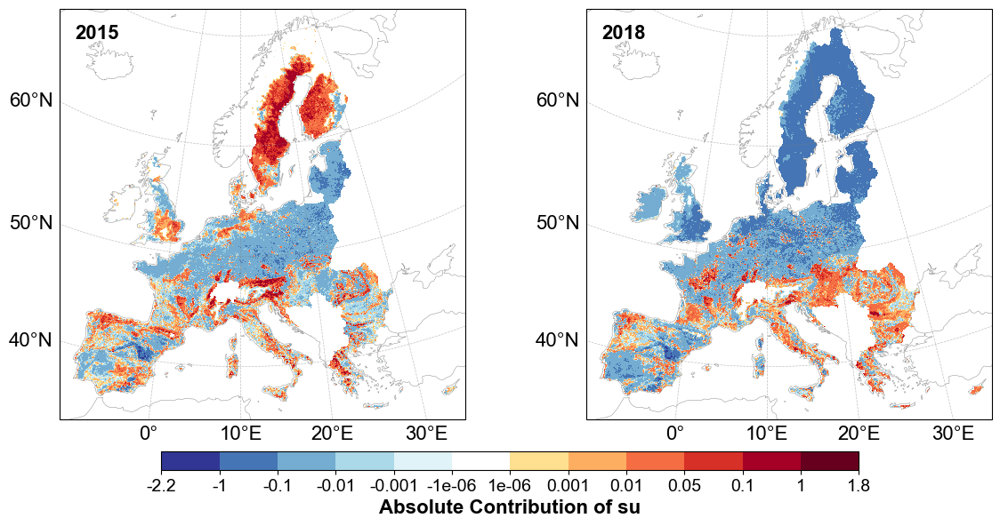

2025-08-07 18:08:43,172 - INFO - ✅ 成功绘制 abs 贡献图
2025-08-07 18:08:44,981 - INFO - ✅ 加载 rel 2015, max=0.353, min=-0.589
2025-08-07 18:08:46,588 - INFO - ✅ 加载 rel 2018, max=0.359, min=-0.643
2025-08-07 18:08:46,825 - INFO - 计算 rel 数据范围: max=0.359, min=-0.643
2025-08-07 18:08:46,826 - INFO - 原始 rel 边界: [-0.7, -0.2, -0.01, -0.005, -0.001, -1e-06, 1e-06, 0.001, 0.005, 0.01, 0.05, 0.1, 0.4]
2025-08-07 18:08:46,826 - INFO - 调整后 rel 边界: [-0.6, -0.2, -0.01, -0.005, -0.001, -1e-06, 1e-06, 0.001, 0.005, 0.01, 0.05, 0.1, 0.4]


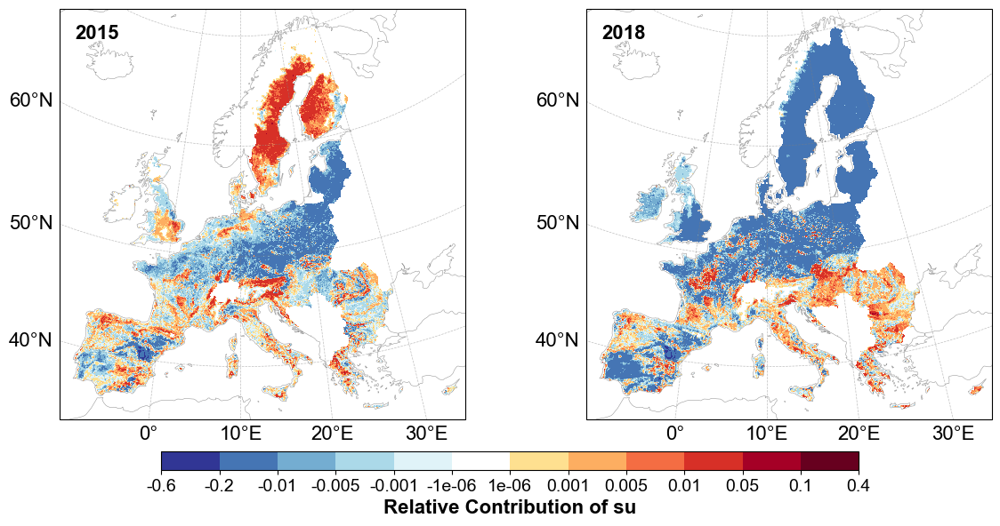

2025-08-07 18:09:41,148 - INFO - ✅ 成功绘制 rel 贡献图


In [8]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import logging
import gc

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 设置冻结变量
freeze_var = 'su'
years = [2015, 2018]
output_dir = fr'E:/Project-yqr/new/results/weight/freeze/{freeze_var}/contribution'
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 字体设置
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 16

# 颜色：中间白色，对应 0
color_palette = [
    "#313695", "#4575b4", "#74add1", "#abd9e9", "#e0f3f8",  # 蓝（负）
    "#FFFFFF",  # 中间白色
    "#fee090", "#fdae61", "#f46d43", "#d73027", "#a50026", "#67001f"  # 红（正）
]

def load_dataset(path):
    if not os.path.exists(path):
        logger.warning(f"❌ 文件不存在: {path}")
        return None
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        # 不掩码0，保持数据完整
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
        return data, extent

def get_dynamic_color_bounds(contrib_type, datasets):
    # 原始边界
    base_bounds = {
        'abs': [-2.5, -1, -0.1, -0.01, -0.001, -0.000001, 0.000001, 0.001, 0.01, 0.05, 0.1, 1, 2],
        'rel': [-0.7, -0.2, -0.01, -0.005, -0.001, -0.000001, 0.000001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.4]
    }
    
    # 收集所有数据以计算最大值和最小值
    all_data = []
    for _, data, _ in datasets:
        all_data.append(data)
    all_data = np.concatenate([data.ravel() for data in all_data])
    data_max = np.nanmax(all_data)
    data_min = np.nanmin(all_data)
    
    # 调试日志
    logger.info(f"计算 {contrib_type} 数据范围: max={data_max:.3f}, min={data_min:.3f}")
    
    # 只替换最大值和最小值，并保留小数点后一位
    bounds = base_bounds[contrib_type].copy()
    logger.info(f"原始 {contrib_type} 边界: {bounds}")
    
    # 直接使用数据的最小值和最大值，四舍五入到小数点后一位
    bounds[0] = round(data_min, 1)
    bounds[-1] = round(data_max, 1)
    
    logger.info(f"调整后 {contrib_type} 边界: {bounds}")
    return bounds

def plot_contribution(contrib_type, title_label):
    datasets = []
    for year in years:
        tif_path = os.path.join(output_dir, f'{contrib_type}_contrib_{freeze_var}_{year}.tif')
        result = load_dataset(tif_path)
        if result:
            data, extent = result
            datasets.append((year, data, extent))
            logger.info(f"✅ 加载 {contrib_type} {year}, max={np.nanmax(data):.3f}, min={np.nanmin(data):.3f}")

    if not datasets:
        logger.error(f"❌ 无有效数据: {contrib_type}")
        return

    # 动态调整 color_bounds 的最大值和最小值
    bounds = get_dynamic_color_bounds(contrib_type, datasets)
    cmap = mcolors.ListedColormap(color_palette[:len(bounds)-1])
    norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1)

    fig, axes = plt.subplots(1, len(datasets), figsize=(14, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]

    for ax, (year, data, extent) in zip(axes, datasets):
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                       transform=ccrs.PlateCarree(), origin='upper')

        ax.text(0.04, 0.96, str(year), transform=ax.transAxes,
                fontsize=16, fontweight='bold', va='top', ha='left')

        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True
        gl.xlabel_style = {'size': 16, 'rotation': 0}
        gl.ylabel_style = {'size': 16, 'rotation': 0}

    cbar_ax = fig.add_axes([0.22, 0.015, 0.56, 0.035])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=bounds)
    labels = []
    for b in bounds:
        if abs(b) < 1e-8:
            labels.append('0')
        else:
            labels.append(str(b))
    cb.ax.set_xticklabels(labels, fontsize=14)
    cb.set_label(title_label, fontsize=16, weight='bold')
    cb.ax.tick_params(labelsize=14)

    plt.show()
    gc.collect()
    logger.info(f"✅ 成功绘制 {contrib_type} 贡献图")

# 分别绘制
plot_contribution('abs', f"Absolute Contribution of {freeze_var}")
plot_contribution('rel', f"Relative Contribution of {freeze_var}")

## 相对贡献

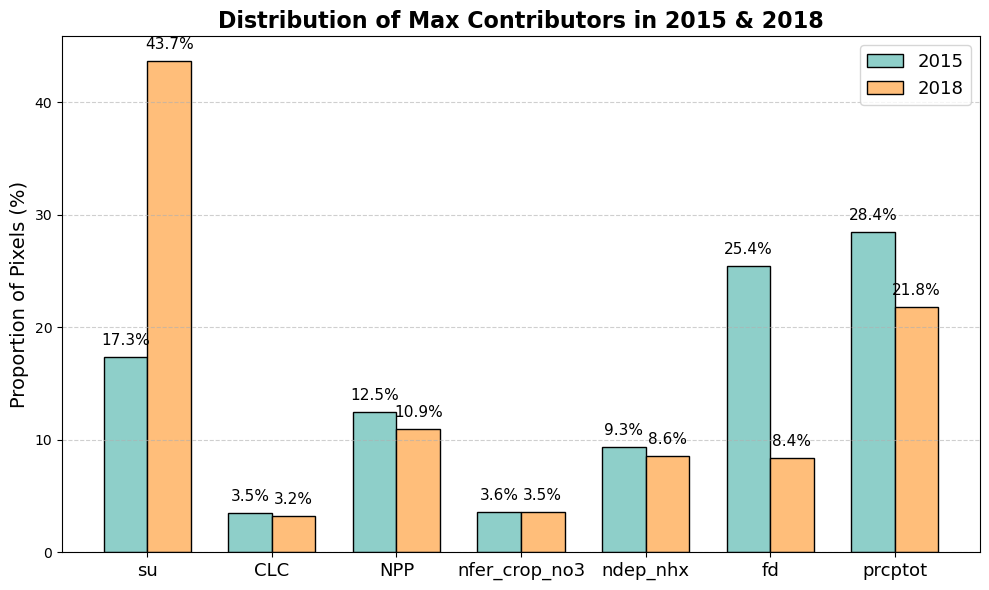

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio

# === 配置 ===
years = [2015, 2018]
variables = ['su', 'CLC', 'NPP', 'nfer_crop_no3', 'ndep_nhx', 'fd', 'prcptot']
colors = ['#8ecfc9', '#ffbe7a']  # 蓝橙小清新
tif_dir = r"E:/Project-yqr/new/results/weight/freeze"

# === 读取 & 统计 ===
results = {}

for year in years:
    tif_path = os.path.join(tif_dir, f"max_contributor_{year}.tif")
    with rasterio.open(tif_path) as src:
        data = src.read(1)
        valid_mask = data != -1
        total = np.sum(valid_mask)
        counts = [(data[valid_mask] == i).sum() for i in range(len(variables))]
        percents = [c / total * 100 for c in counts]
        results[year] = percents

# === 绘图 ===
x = np.arange(len(variables))  # x 位置
bar_width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))

bars_2015 = ax.bar(x - bar_width/2, results[2015], width=bar_width, label='2015', color=colors[0], edgecolor='black')
bars_2018 = ax.bar(x + bar_width/2, results[2018], width=bar_width, label='2018', color=colors[1], edgecolor='black')

# 数值标签
for bars in [bars_2015, bars_2018]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 0.8, f'{height:.1f}%', ha='center', va='bottom', fontsize=11)

# 样式
ax.set_xticks(x)
ax.set_xticklabels(variables, fontsize=13)
ax.set_ylabel("Proportion of Pixels (%)", fontsize=14)
ax.set_title("Distribution of Max Contributors in 2015 & 2018", fontsize=16, weight='bold')
ax.legend(fontsize=13)
ax.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


✅ 使用 Arial 字体: C:\Windows\Fonts\arial.ttf


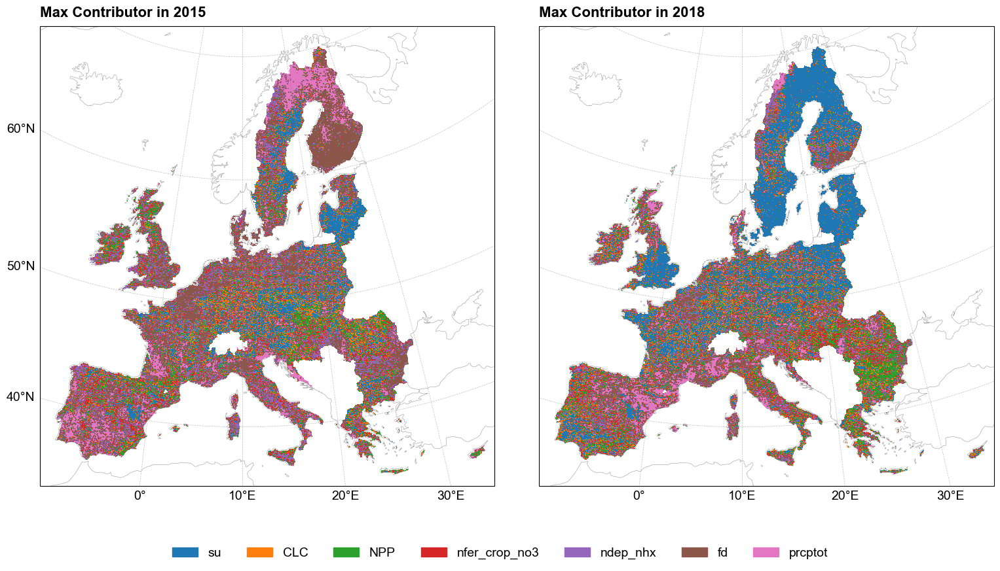

In [5]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import rasterio
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import matplotlib.font_manager as fm

# === 字体设置 ===
try:
    arial_path = fm.findfont("Arial")
    plt.rcParams["font.family"] = "Arial"
    print(f"✅ 使用 Arial 字体: {arial_path}")
except:
    plt.rcParams["font.family"] = "DejaVu Sans"
    print("⚠️ Arial 字体未找到，已使用默认字体")
plt.rcParams["font.size"] = 16

# === 配置 ===
years = [2015, 2018]
tif_paths = {
    year: fr"E:/Project-yqr/new/results/weight/freeze/max_contributor_{year}.tif"
    for year in years
}
variables = ['su', 'CLC', 'NPP', 'nfer_crop_no3', 'ndep_nhx', 'fd', 'prcptot']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

# colormap & norm
cmap = mcolors.ListedColormap(colors)
bounds = list(range(len(variables) + 1))
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# === 创建地图 ===
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)
fig, axes = plt.subplots(1, 2, figsize=(16, 8), subplot_kw={'projection': map_crs})

for i, year in enumerate(years):
    ax = axes[i]
    with rasterio.open(tif_paths[year]) as src:
        data = src.read(1)
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
        data = np.ma.masked_where(data == -1, data)

    ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())

    im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                   transform=ccrs.PlateCarree(), origin='upper')

    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

    gl = ax.gridlines(draw_labels=(i == 0), linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
    gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = i == 0
    gl.xlabel_style = {'size': 14, 'rotation': 0}
    gl.ylabel_style = {'size': 14, 'rotation': 0}

    ax.set_title(f"Max Contributor in {year}", fontsize=16, weight='bold', loc='left', pad=10)

# === 图例：一行、底部更低 ===
handles = [mpatches.Patch(color=colors[i], label=variables[i]) for i in range(len(variables))]
fig.legend(handles=handles,
           loc='lower center',
           bbox_to_anchor=(0.5, -0.08),  # 控制往下移动
           ncol=len(variables),
           fontsize=14,
           frameon=False)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()


## 土地利用分布

### 热力图

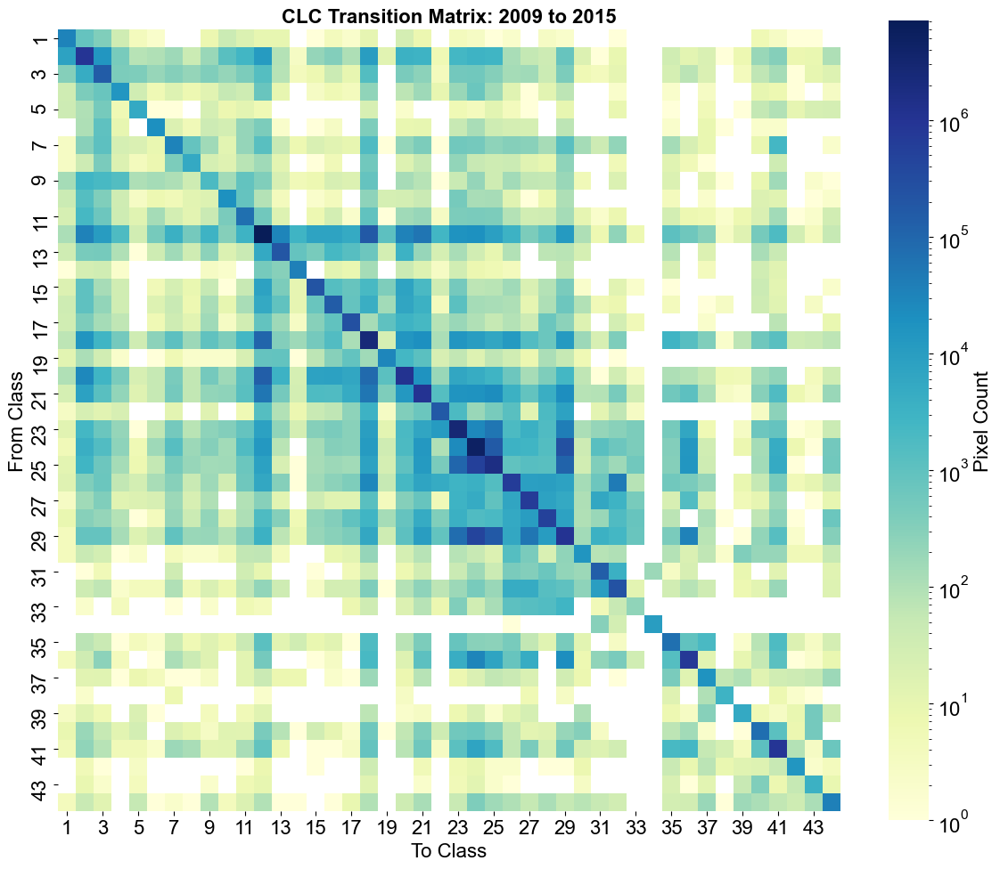

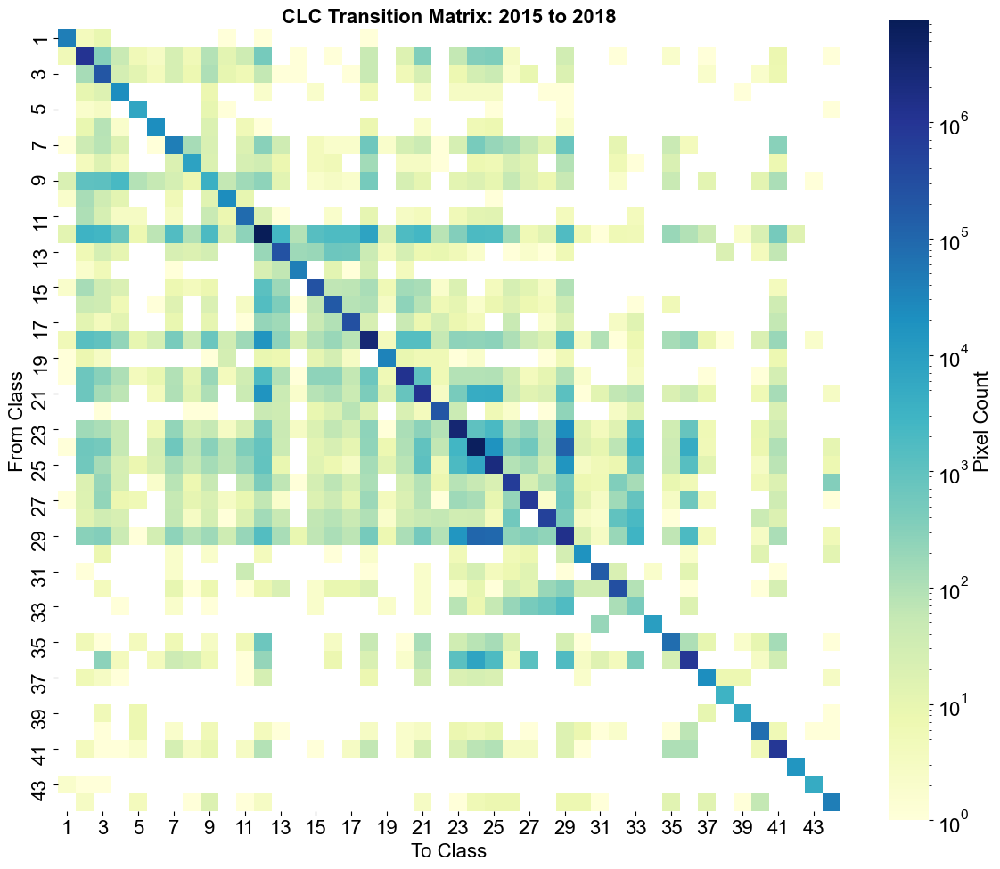

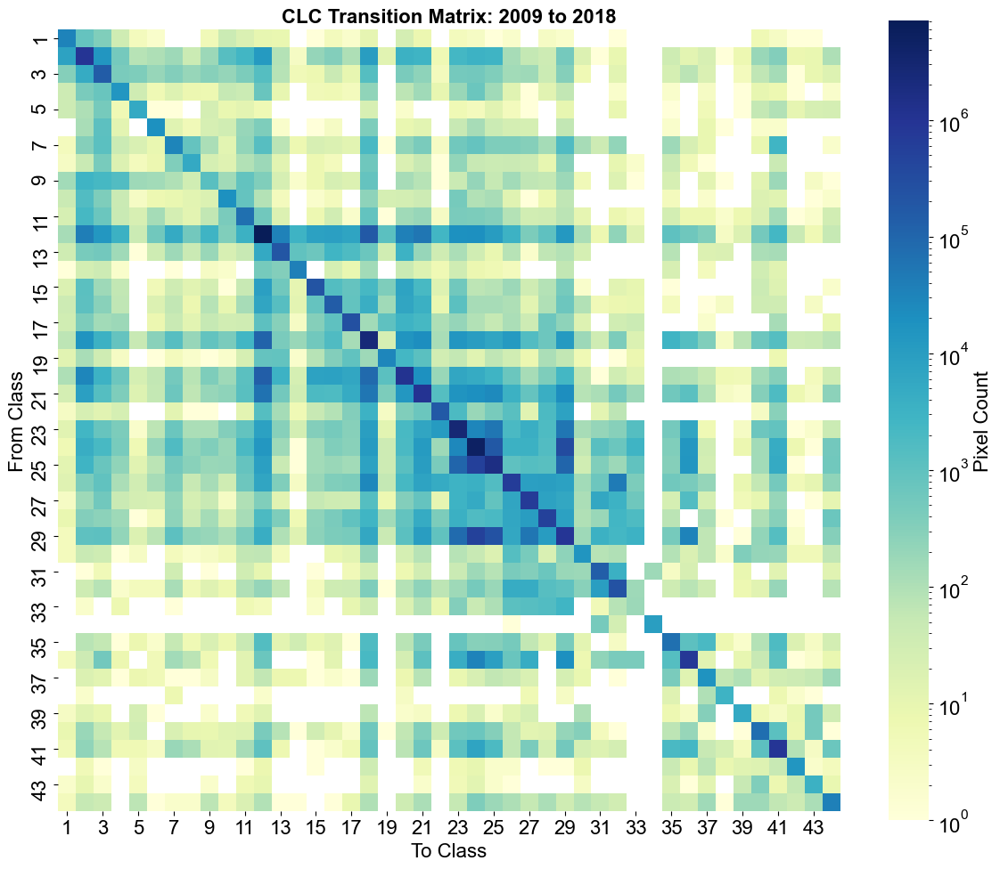

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix
from matplotlib.colors import LogNorm

input_dir = r"E:\Project-yqr\EU_TIFF_500m"
years = [2009, 2015, 2018]

# 文件名
def get_path(year):
    return os.path.join(input_dir, f"EU_CLC_{year}.tif")

def read_tiff(path):
    with rasterio.open(path) as src:
        return src.read(1)

def plot_land_use_transition(from_data, to_data, from_year, to_year, max_class=44):
    # 有效像元掩码（忽略 0 或 nodata）
    valid_mask = (from_data > 0) & (to_data > 0)
    from_valid = from_data[valid_mask]
    to_valid = to_data[valid_mask]

    # 计算变化矩阵
    matrix = confusion_matrix(from_valid, to_valid, labels=range(1, max_class+1))

    # 转换为 DataFrame（可视化友好）
    df = pd.DataFrame(matrix, index=range(1, max_class+1), columns=range(1, max_class+1))

    # 可视化
    plt.figure(figsize=(12, 10))
    sns.heatmap(df, cmap='YlGnBu', norm=LogNorm(), square=True, cbar_kws={'label': 'Pixel Count'})

    plt.title(f"CLC Transition Matrix: {from_year} to {to_year}", fontsize=16, weight='bold')
    plt.xlabel("To Class")
    plt.ylabel("From Class")
    plt.tight_layout()
    plt.show()

    return df

# 读取所有年份数据
data = {year: read_tiff(get_path(year)) for year in years}

# 绘图：三个时间段
df_09_15 = plot_land_use_transition(data[2009], data[2015], 2009, 2015)
df_15_18 = plot_land_use_transition(data[2015], data[2018], 2015, 2018)
df_09_18 = plot_land_use_transition(data[2009], data[2018], 2009, 2018)



### 桑吉图

In [6]:
import os
import numpy as np
import rasterio
import pandas as pd
from sklearn.metrics import confusion_matrix
import plotly.graph_objects as go
import logging

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径和年份
input_dir = r"E:\Project-yqr\EU_TIFF_500m"
years = [2009, 2015, 2018]

# 大类定义
clc_classes = {
    'Artificial surfaces': [
        (1, 'Continuous urban fabric'), (2, 'Discontinuous urban fabric'),
        (3, 'Industrial or commercial units'), (4, 'Road and rail networks'),
        (5, 'Port areas'), (6, 'Airports'), (7, 'Mineral extraction sites'),
        (8, 'Dump sites'), (9, 'Construction sites'), (10, 'Green urban areas'),
        (11, 'Sport and leisure facilities')
    ],
    'Agricultural areas': [
        (12, 'Non-irrigated arable land'), (13, 'Permanently irrigated land'),
        (14, 'Rice fields'), (15, 'Vineyards'), (16, 'Fruit trees and berry plantations'),
        (17, 'Olive groves'), (18, 'Pastures'), (19, 'Annual crops with permanent crops'),
        (20, 'Complex cultivation patterns'), (21, 'Agriculture with natural vegetation'),
        (22, 'Agro-forestry areas')
    ],
    'Forest and semi-natural areas': [
        (23, 'Broad-leaved forest'), (24, 'Coniferous forest'),
        (25, 'Mixed forest'), (26, 'Natural grasslands'),
        (27, 'Moors and heathland'), (28, 'Sclerophyllous vegetation'),
        (29, 'Transitional woodland-shrub'), (30, 'Beaches, dunes, sands'),
        (31, 'Bare rocks'), (32, 'Sparsely vegetated areas'),
        (33, 'Burnt areas'), (34, 'Glaciers and perpetual snow')
    ],
    'Wetlands': [
        (35, 'Inland marshes'), (36, 'Peat bogs'), (37, 'Salt marshes'),
        (38, 'Salines'), (39, 'Intertidal flats')
    ],
    'Water bodies': [
        (40, 'Water courses'), (41, 'Water bodies'), (42, 'Coastal lagoons'),
        (43, 'Estuaries'), (44, 'Sea and ocean')
    ]
}

# 创建从具体类到大类的映射
class_to_category = {}
category_to_index = {cat: i for i, cat in enumerate(clc_classes.keys())}
valid_classes = set()
for category, classes in clc_classes.items():
    for class_id, _ in classes:
        class_to_category[class_id] = category
        valid_classes.add(class_id)

# 文件路径
def get_path(year):
    return os.path.join(input_dir, f"EU_CLC_{year}.tif")

# 读取栅格数据
def read_tiff(path):
    try:
        with rasterio.open(path) as src:
            data = src.read(1)  # Read as float first
            nodata = src.nodatavals[0] if src.nodatavals else None  # Get nodata value from metadata
            # Explicitly treat 48 as nodata, regardless of metadata
            data = np.where(data == 48, np.nan, data)
            if nodata is not None and nodata != 48:
                data = np.where(data == nodata, np.nan, data)  # Also handle metadata-defined nodata
            else:
                data = np.where(data <= 0, np.nan, data)  # Fallback: treat <= 0 as invalid
            data = data.astype(np.float32)  # Keep as float to handle NaN
            
            # Log unique values
            unique_vals = np.unique(data[~np.isnan(data)]).astype(int)
            logger.info(f"Unique values in {path}: {unique_vals}")
            invalid_vals = [v for v in unique_vals if v not in valid_classes]
            if invalid_vals:
                logger.warning(f"Invalid class values found in {path}: {invalid_vals}")
            
            return data
    except Exception as e:
        logger.error(f"❌ 加载 {path} 失败: {str(e)}")
        return None

# 计算大类转移矩阵
def compute_category_transition_matrix(from_data, to_data, from_year, to_year):
    valid_mask = (~np.isnan(from_data)) & (~np.isnan(to_data)) & (from_data > 0) & (to_data > 0)
    from_valid = from_data[valid_mask]
    to_valid = to_data[valid_mask]

    # 过滤有效类别的值
    valid_pairs = [(int(x), int(y)) for x, y in zip(from_valid, to_valid) 
                   if int(x) in class_to_category and int(y) in class_to_category]
    if not valid_pairs:
        logger.error("No valid class pairs found for transition matrix")
        return None

    from_valid, to_valid = zip(*valid_pairs)  # 解包有效对
    from_valid = np.array(from_valid)
    to_valid = np.array(to_valid)

    # 转换为大类
    from_categories = np.array([category_to_index[class_to_category[x]] for x in from_valid])
    to_categories = np.array([category_to_index[class_to_category[x]] for x in to_valid])

    # 计算转移矩阵
    matrix = confusion_matrix(from_categories, to_categories, labels=range(len(clc_classes)))
    df = pd.DataFrame(matrix, index=clc_classes.keys(), columns=clc_classes.keys())
    return df

# 绘制桑基图
def plot_sankey(df, from_year, to_year):
    if df is None:
        logger.error(f"Cannot plot Sankey diagram for {from_year} to {to_year}: No valid data")
        return
    
    labels = list(clc_classes.keys())
    source = []
    target = []
    value = []
    colors = ['#a50026', '#feb24c', '#238b45', '#6a51a3', '#08306b']  # 对应大类的颜色

    # 为桑基图准备数据
    for i, from_cat in enumerate(labels):
        for j, to_cat in enumerate(labels):
            val = df.loc[from_cat, to_cat]
            if val > 0:  # 只绘制非零转移
                source.append(i)
                target.append(j + len(labels))  # 目标节点偏移
                value.append(val)

    # 节点标签（包含年份）
    node_labels = [f"{cat} ({from_year})" for cat in labels] + [f"{cat} ({to_year})" for cat in labels]
    node_colors = colors + colors  # 两组节点使用相同颜色

    # 创建桑基图
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=node_labels,
            color=node_colors
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
            color=[colors[s % len(colors)] for s in source]  # 连线颜色基于源节点
        )
    )])

    fig.update_layout(
        title_text=f"Land Use Transition: {from_year} to {to_year}",
        font=dict(size=14),
        width=800,
        height=600
    )
    fig.show()

# 主程序
def main():
    # 读取数据
    data = {year: read_tiff(get_path(year)) for year in years}
    if any(d is None for d in data.values()):
        logger.error("❌ 数据加载失败，退出")
        return

    # 计算并绘制三个时间段的转移
    periods = [(2009, 2015), (2015, 2018), (2009, 2018)]
    for from_year, to_year in periods:
        logger.info(f"处理 {from_year} 到 {to_year} 的转移矩阵")
        df = compute_category_transition_matrix(data[from_year], data[to_year], from_year, to_year)
        logger.info(f"转移矩阵:\n{df}")
        plot_sankey(df, from_year, to_year)

if __name__ == "__main__":
    main()

2025-08-08 22:03:01,470 - INFO - Unique values in E:\Project-yqr\EU_TIFF_500m\EU_CLC_2009.tif: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-08 22:03:04,614 - INFO - Unique values in E:\Project-yqr\EU_TIFF_500m\EU_CLC_2015.tif: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-08 22:03:07,755 - INFO - Unique values in E:\Project-yqr\EU_TIFF_500m\EU_CLC_2018.tif: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-08 22:03:07,781 - INFO - 处理 2009 到 2015 的转移矩阵
2025-08-08 22:03:47,694 - INFO - 转移矩阵:
                               Artificial surfaces  Agricultural areas  \
Artificial surfaces                        1383614               43491   
Agricultural areas                          134292            1377863

2025-08-08 22:03:48,261 - INFO - 处理 2015 到 2018 的转移矩阵
2025-08-08 22:04:26,049 - INFO - 转移矩阵:
                               Artificial surfaces  Agricultural areas  \
Artificial surfaces                        1542693                3185   
Agricultural areas                           17727            13990892   
Forest and semi-natural areas                 7238               11038   
Wetlands                                       400                1215   
Water bodies                                    94                 206   

                               Forest and semi-natural areas  Wetlands  \
Artificial surfaces                                     2942       137   
Agricultural areas                                     20827       765   
Forest and semi-natural areas                       15375087      9584   
Wetlands                                               13671    975296   
Water bodies                                             303       312   

                 

2025-08-08 22:04:26,056 - INFO - 处理 2009 到 2018 的转移矩阵
2025-08-08 22:05:05,062 - INFO - 转移矩阵:
                               Artificial surfaces  Agricultural areas  \
Artificial surfaces                        1381803               44079   
Agricultural areas                          149283            13750841   
Forest and semi-natural areas                34356              198594   
Wetlands                                      1251                8304   
Water bodies                                  1459                4718   

                               Forest and semi-natural areas  Wetlands  \
Artificial surfaces                                    21631       559   
Agricultural areas                                    254553      9162   
Forest and semi-natural areas                       15047576     72448   
Wetlands                                               74514    898396   
Water bodies                                           14555      5529   

                 

In [3]:
import os
import numpy as np
import rasterio
import logging

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径和年份
input_dir = r"E:\Project-yqr\EU_TIFF_500m"
output_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
years = [2009, 2015, 2018]

# 创建输出目录
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# 大类定义
clc_classes = {
    'Artificial surfaces': [
        (1, 'Continuous urban fabric'), (2, 'Discontinuous urban fabric'),
        (3, 'Industrial or commercial units'), (4, 'Road and rail networks'),
        (5, 'Port areas'), (6, 'Airports'), (7, 'Mineral extraction sites'),
        (8, 'Dump sites'), (9, 'Construction sites'), (10, 'Green urban areas'),
        (11, 'Sport and leisure facilities')
    ],
    'Agricultural areas': [
        (12, 'Non-irrigated arable land'), (13, 'Permanently irrigated land'),
        (14, 'Rice fields'), (15, 'Vineyards'), (16, 'Fruit trees and berry plantations'),
        (17, 'Olive groves'), (18, 'Pastures'), (19, 'Annual crops with permanent crops'),
        (20, 'Complex cultivation patterns'), (21, 'Agriculture with natural vegetation'),
        (22, 'Agro-forestry areas')
    ],
    'Forest and semi-natural areas': [
        (23, 'Broad-leaved forest'), (24, 'Coniferous forest'),
        (25, 'Mixed forest'), (26, 'Natural grasslands'),
        (27, 'Moors and heathland'), (28, 'Sclerophyllous vegetation'),
        (29, 'Transitional woodland-shrub'), (30, 'Beaches, dunes, sands'),
        (31, 'Bare rocks'), (32, 'Sparsely vegetated areas'),
        (33, 'Burnt areas'), (34, 'Glaciers and perpetual snow')
    ],
    'Wetlands': [
        (35, 'Inland marshes'), (36, 'Peat bogs'), (37, 'Salt marshes'),
        (38, 'Salines'), (39, 'Intertidal flats')
    ],
    'Water bodies': [
        (40, 'Water courses'), (41, 'Water bodies'), (42, 'Coastal lagoons'),
        (43, 'Estuaries'), (44, 'Sea and ocean')
    ]
}

# 创建大类映射
class_to_category = {}
category_to_index = {cat: i for i, cat in enumerate(clc_classes.keys())}
valid_classes = set()
for category, classes in clc_classes.items():
    for class_id, _ in classes:
        class_to_category[class_id] = category
        valid_classes.add(class_id)

# 大类转换类型映射
major_transition_types = {}
major_transition_id = 1
for from_idx, from_cat in enumerate(clc_classes.keys()):
    for to_idx, to_cat in enumerate(clc_classes.keys()):
        if from_cat != to_cat:
            major_transition_types[(from_idx, to_idx)] = (major_transition_id, f"{from_cat} → {to_cat}")
            major_transition_id += 1

# 小类转换类型映射
minor_transition_types = {}
minor_transition_id = 1
for from_class_id in valid_classes:
    for to_class_id in valid_classes:
        if from_class_id != to_class_id:
            from_name = next(name for cid, name in clc_classes[class_to_category[from_class_id]] if cid == from_class_id)
            to_name = next(name for cid, name in clc_classes[class_to_category[to_class_id]] if cid == to_class_id)
            minor_transition_types[(from_class_id, to_class_id)] = (minor_transition_id, f"{from_name} → {to_name}")
            minor_transition_id += 1

# 保存转换类型映射
def save_transition_types():
    # 大类
    major_output_path = os.path.join(output_dir, "major_transition_types.txt")
    with open(major_output_path, 'w', encoding='utf-8') as f:
        for (from_idx, to_idx), (tid, name) in sorted(major_transition_types.items(), key=lambda x: x[1][0]):
            f.write(f"ID {tid}: {name}\n")
    logger.info(f"📝 已保存大类转换类型到: {major_output_path}")
    
    # 小类
    minor_output_path = os.path.join(output_dir, "minor_transition_types.txt")
    with open(minor_output_path, 'w', encoding='utf-8') as f:
        for (from_idx, to_idx), (tid, name) in sorted(minor_transition_types.items(), key=lambda x: x[1][0]):
            f.write(f"ID {tid}: {name}\n")
    logger.info(f"📝 已保存小类转换类型到: {minor_output_path}")

# 文件路径
def get_path(year):
    return os.path.join(input_dir, f"EU_CLC_{year}.tif")

# 读取栅格数据
def read_tiff(path, window=None):
    try:
        with rasterio.open(path) as src:
            if window:
                data = src.read(1, window=window)
                profile = src.profile
                profile.update(
                    width=window.width,
                    height=window.height,
                    transform=rasterio.windows.transform(window, src.transform)
                )
            else:
                data = src.read(1)
                profile = src.profile
            nodata = src.nodatavals[0] if src.nodatavals else None
            data = np.where(data == 48, np.nan, data)
            if nodata is not None and nodata != 48:
                data = np.where(data == nodata, np.nan, data)
            else:
                data = np.where(data <= 0, np.nan, data)
            data = data.astype(np.float32)
            
            unique_vals = np.unique(data[~np.isnan(data)]).astype(int)
            logger.info(f"Unique values in {path}: {unique_vals}")
            invalid_vals = [v for v in unique_vals if v not in valid_classes]
            if invalid_vals:
                logger.warning(f"Invalid class values found in {path}: {invalid_vals}")
            
            return data, profile
    except Exception as e:
        logger.error(f"❌ 加载 {path} 失败: {str(e)}")
        return None, None

# 计算并保存大类转换栅格
def compute_and_save_major_transition(from_data, to_data, from_year, to_year, profile):
    valid_mask = (~np.isnan(from_data)) & (~np.isnan(to_data)) & (from_data > 0) & (to_data > 0)
    transition = np.full_like(from_data, 0, dtype=np.int8)  # nodata=0
    
    for (from_idx, to_idx), (tid, _) in major_transition_types.items():
        from_mask = np.isin(from_data, [k for k, v in class_to_category.items() if category_to_index[v] == from_idx])
        to_mask = np.isin(to_data, [k for k, v in class_to_category.items() if category_to_index[v] == to_idx])
        transition[np.logical_and(from_mask, to_mask) & valid_mask] = tid
    
    output_path = os.path.join(output_dir, f"major_transition_{from_year}_to_{to_year}.tif")
    profile.update(dtype=rasterio.int8, nodata=0)
    with rasterio.open(output_path, 'w', **profile) as dst:
        dst.write(transition, 1)
    logger.info(f"💾 已保存大类转换栅格到: {output_path}")

# 计算并保存小类转换栅格
def compute_and_save_minor_transition(from_data, to_data, from_year, to_year, profile):
    valid_mask = (~np.isnan(from_data)) & (~np.isnan(to_data)) & (from_data > 0) & (to_data > 0)
    transition = np.full_like(from_data, 0, dtype=np.int16)  # nodata=0, int16 for more transitions
    
    for (from_id, to_id), (tid, _) in minor_transition_types.items():
        transition[np.logical_and(from_data == from_id, to_data == to_id) & valid_mask] = tid
    
    output_path = os.path.join(output_dir, f"minor_transition_{from_year}_to_{to_year}.tif")
    profile.update(dtype=rasterio.int16, nodata=0)
    with rasterio.open(output_path, 'w', **profile) as dst:
        dst.write(transition, 1)
    logger.info(f"💾 已保存小类转换栅格到: {output_path}")

# 主程序
def main():
    data = {}
    profile = None
    # 可选：裁剪窗口
    # window = rasterio.windows.Window(row_off=1000, col_off=1000, height=2000, width=2000)
    window = None
    for year in years:
        data[year], profile_year = read_tiff(get_path(year), window=window)
        if data[year] is None:
            logger.error(f"❌ 数据加载失败，退出")
            return
        if profile is None:
            profile = profile_year
    
    save_transition_types()
    
    periods = [(2009, 2015), (2015, 2018), (2009, 2018)]
    for from_year, to_year in periods:
        logger.info(f"处理 {from_year} 到 {to_year} 的土地利用转换")
        compute_and_save_major_transition(data[from_year], data[to_year], from_year, to_year, profile)
        compute_and_save_minor_transition(data[from_year], data[to_year], from_year, to_year, profile)
        logger.info(f"✅ 完成 {from_year} 到 {to_year} 的转换栅格保存")

if __name__ == "__main__":
    main()

2025-08-08 22:38:58,728 - INFO - Unique values in E:\Project-yqr\EU_TIFF_500m\EU_CLC_2009.tif: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-08 22:39:03,681 - INFO - Unique values in E:\Project-yqr\EU_TIFF_500m\EU_CLC_2015.tif: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-08 22:39:08,043 - INFO - Unique values in E:\Project-yqr\EU_TIFF_500m\EU_CLC_2018.tif: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-08 22:39:08,079 - INFO - 📝 已保存大类转换类型到: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_types.txt
2025-08-08 22:39:08,091 - INFO - 📝 已保存小类转换类型到: E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_types.txt
2025-08-08 22:39:08,092 - INFO - 处理 2009 到 2015 的土地利用转换
2025-08-08 22:39:59,627 - 

### 分类型算SOC

2025-08-11 13:53:45,411 - INFO - 加载SOC栅格: E:\Project-yqr\new\results\weight\weight_pred_2009.tif, nodata值: nan, 唯一值: [ 0.70926458  0.74781454  0.7592054  ... 18.1001358  18.12057495
 18.12626076]
2025-08-11 13:53:45,411 - INFO - 加载并对齐CLC栅格: E:\Project-yqr\EU_TIFF_500m\EU_CLC_2009.tif, 原形状: (9644, 22804), 对齐后形状: (8528, 10865), 唯一值: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-11 13:53:56,414 - INFO - 加载SOC栅格: E:\Project-yqr\new\results\weight\weight_pred_2015.tif, nodata值: nan, 唯一值: [ 0.69440252  0.7280581   0.74462771 ... 18.09090424 18.11365318
 18.16356277]
2025-08-11 13:53:56,416 - INFO - 加载并对齐CLC栅格: E:\Project-yqr\EU_TIFF_500m\EU_CLC_2015.tif, 原形状: (9644, 22804), 对齐后形状: (8528, 10865), 唯一值: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-11 13:54:05,049 - INFO - 加载SOC栅格: E:\Project-yqr\new\res

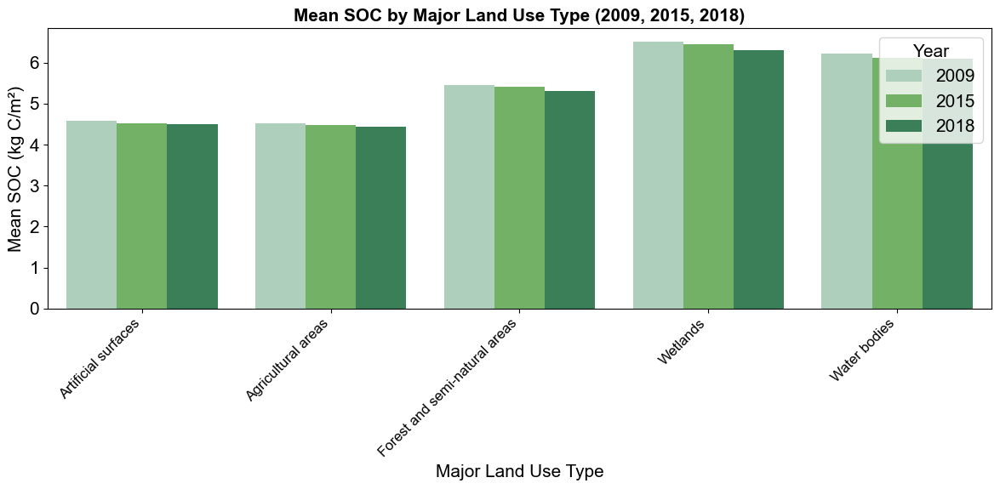

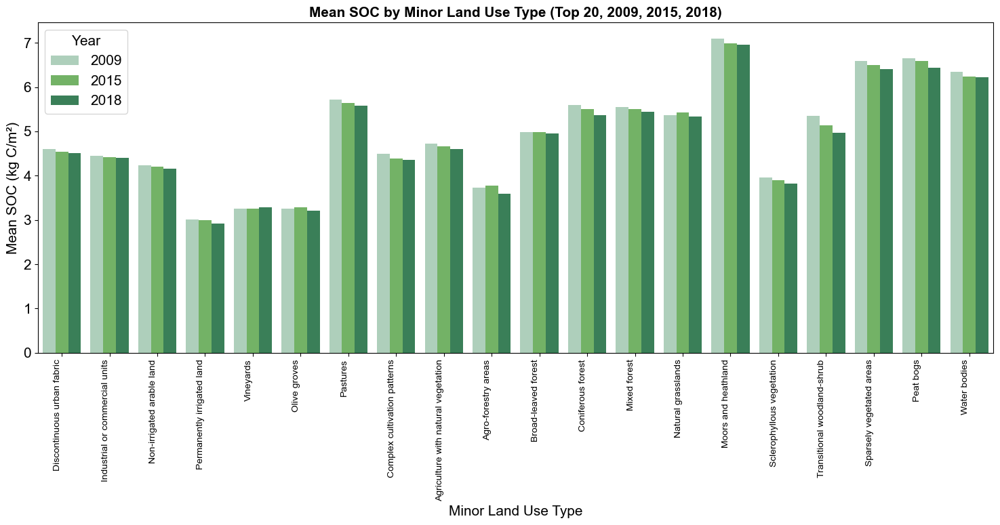

D:\Temp\ipykernel_34016\2158601270.py:241: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df_raw.groupby(['Year', 'MajorClass']).apply(lambda x: x.sample(min(len(x), 1000))).reset_index(drop=True)


KeyboardInterrupt: 

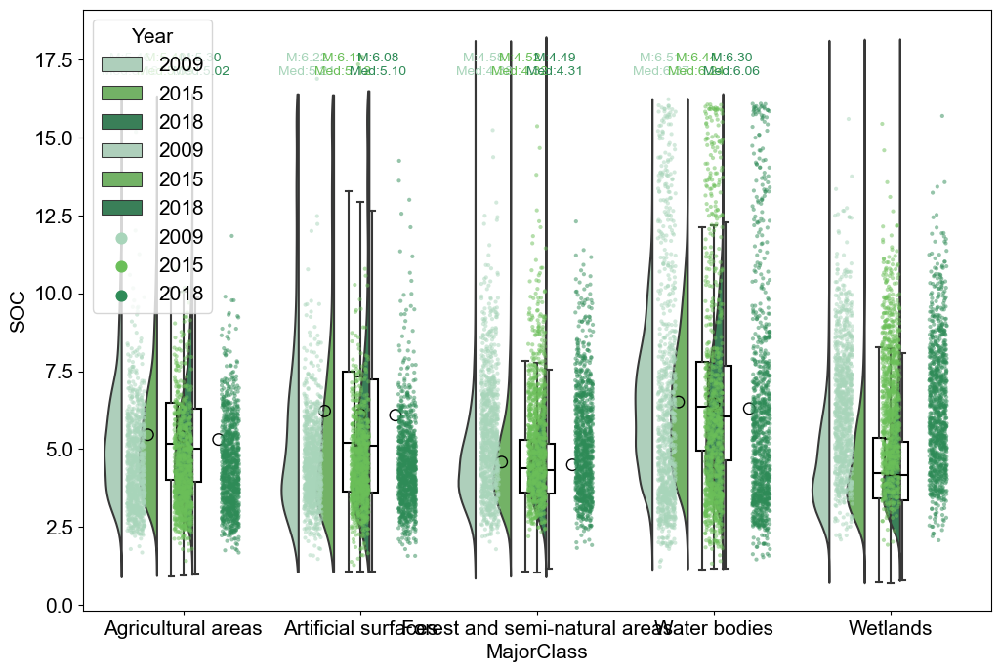

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ptitprince as pt
import rasterio
from rasterio.warp import reproject, Resampling
import logging
from matplotlib.colors import ListedColormap

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 设置字体
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 15

# 数据路径和年份
years = [2009, 2015, 2018]
soc_rasters = {
    2009: r'E:\Project-yqr\new\results\weight\weight_pred_2009.tif',
    2015: r'E:\Project-yqr\new\results\weight\weight_pred_2015.tif',
    2018: r'E:\Project-yqr\new\results\weight\weight_pred_2018.tif',
}
clc_rasters = {
    2009: r'E:\Project-yqr\EU_TIFF_500m\EU_CLC_2009.tif',
    2015: r'E:\Project-yqr\EU_TIFF_500m\EU_CLC_2015.tif',
    2018: r'E:\Project-yqr\EU_TIFF_500m\EU_CLC_2018.tif',
}

# 大类和小类定义
clc_classes = {
    'Artificial surfaces': list(range(1, 12)),
    'Agricultural areas': list(range(12, 23)),
    'Forest and semi-natural areas': list(range(23, 35)),
    'Wetlands': list(range(35, 40)),
    'Water bodies': list(range(40, 45))
}
clc_class_names = {
    1: 'Continuous urban fabric', 2: 'Discontinuous urban fabric',
    3: 'Industrial or commercial units', 4: 'Road and rail networks',
    5: 'Port areas', 6: 'Airports', 7: 'Mineral extraction sites',
    8: 'Dump sites', 9: 'Construction sites', 10: 'Green urban areas',
    11: 'Sport and leisure facilities', 12: 'Non-irrigated arable land',
    13: 'Permanently irrigated land', 14: 'Rice fields', 15: 'Vineyards',
    16: 'Fruit trees and berry plantations', 17: 'Olive groves', 18: 'Pastures',
    19: 'Annual crops with permanent crops', 20: 'Complex cultivation patterns',
    21: 'Agriculture with natural vegetation', 22: 'Agro-forestry areas',
    23: 'Broad-leaved forest', 24: 'Coniferous forest', 25: 'Mixed forest',
    26: 'Natural grasslands', 27: 'Moors and heathland', 28: 'Sclerophyllous vegetation',
    29: 'Transitional woodland-shrub', 30: 'Beaches, dunes, sands',
    31: 'Bare rocks', 32: 'Sparsely vegetated areas', 33: 'Burnt areas',
    34: 'Glaciers and perpetual snow', 35: 'Inland marshes', 36: 'Peat bogs',
    37: 'Salt marshes', 38: 'Salines', 39: 'Intertidal flats',
    40: 'Water courses', 41: 'Water bodies', 42: 'Coastal lagoons',
    43: 'Estuaries', 44: 'Sea and ocean'
}

# 创建CLC值到大类的映射
class_to_major = {cid: cat for cat, cids in clc_classes.items() for cid in cids}

# 读取并对齐栅格数据
def read_and_align_rasters(soc_path, clc_path):
    try:
        # 读取SOC栅格
        with rasterio.open(soc_path) as src_soc:
            soc_data = src_soc.read(1).astype(np.float32)
            nodata_soc = src_soc.nodatavals[0] if src_soc.nodatavals else None
            if nodata_soc is not None:
                soc_data[soc_data <= -9999] = np.nan
            soc_profile = src_soc.profile
            soc_transform = src_soc.transform
            soc_shape = soc_data.shape

        # 读取CLC栅格并对齐到SOC栅格
        with rasterio.open(clc_path) as src_clc:
            clc_data = src_clc.read(1).astype(np.float32)
            clc_data[clc_data == 48] = np.nan  # 处理CLC nodata值

            # 创建与SOC栅格相同形状的空数组
            clc_aligned = np.empty(soc_shape, dtype=np.float32)
            # 对齐CLC栅格到SOC栅格
            reproject(
                source=clc_data,
                destination=clc_aligned,
                src_transform=src_clc.transform,
                src_crs=src_clc.crs,
                dst_transform=soc_transform,
                dst_crs=soc_profile['crs'],
                resampling=Resampling.nearest
            )

            # 确保CLC值是整数
            clc_aligned = np.round(clc_aligned).astype(np.float32)
            clc_aligned[clc_aligned < 1] = np.nan  # 排除无效值
            clc_aligned[clc_aligned > 44] = np.nan

            # 记录唯一值
            unique_soc = np.unique(soc_data[~np.isnan(soc_data)]).astype(float)
            unique_clc = np.unique(clc_aligned[~np.isnan(clc_aligned)]).astype(int)
            logger.info(f"加载SOC栅格: {soc_path}, nodata值: {nodata_soc}, 唯一值: {unique_soc}")
            logger.info(f"加载并对齐CLC栅格: {clc_path}, 原形状: {clc_data.shape}, 对齐后形状: {clc_aligned.shape}, 唯一值: {unique_clc}")

            return soc_data, clc_aligned

    except Exception as e:
        logger.error(f"❌ 加载或对齐栅格失败: {str(e)}")
        return None, None

# 计算SOC统计值（按大类和小类）
def calculate_soc_stats(soc_data, clc_data, year):
    valid_mask = (~np.isnan(soc_data)) & (~np.isnan(clc_data))
    soc_valid = soc_data[valid_mask]
    clc_valid = clc_data[valid_mask].astype(int)

    # 过滤无效CLC值
    valid_clc_mask = np.isin(clc_valid, list(range(1, 45)))
    if not valid_clc_mask.all():
        invalid_clc = np.unique(clc_valid[~valid_clc_mask])
        logger.warning(f"⚠️ 发现无效CLC值: {invalid_clc}, 已排除")
    soc_valid = soc_valid[valid_clc_mask]
    clc_valid = clc_valid[valid_clc_mask]

    # 大类统计
    major_stats = []
    for major_class, class_ids in clc_classes.items():
        mask = np.isin(clc_valid, class_ids)
        soc_values = soc_valid[mask]
        if len(soc_values) > 0:
            major_stats.append({
                'Year': str(year),
                'Class': major_class,
                'Max': np.max(soc_values),
                'Min': np.min(soc_values),
                'Mean': np.mean(soc_values),
                'Median': np.median(soc_values),
                'Count': len(soc_values)
            })

    # 小类统计
    minor_stats = []
    for class_id in range(1, 45):
        mask = (clc_valid == class_id)
        soc_values = soc_valid[mask]
        if len(soc_values) > 0:
            minor_stats.append({
                'Year': str(year),
                'Class': clc_class_names[class_id],
                'Max': np.max(soc_values),
                'Min': np.min(soc_values),
                'Mean': np.mean(soc_values),
                'Median': np.median(soc_values),
                'Count': len(soc_values)
            })

    # 原始SOC值（用于箱线图）
    df_raw = pd.DataFrame({
        'SOC': soc_valid,
        'CLC': clc_valid,
        'Year': str(year),
        'MajorClass': [class_to_major.get(c, 'Unknown') for c in clc_valid]
    })

    # 检查是否有未知大类
    unknown_count = (df_raw['MajorClass'] == 'Unknown').sum()
    if unknown_count > 0:
        logger.warning(f"⚠️ {year} 数据中发现 {unknown_count} 个未映射到大类的CLC值")

    return pd.DataFrame(major_stats), pd.DataFrame(minor_stats), df_raw

# 主程序
def main():
    # 读取并对齐所有年份数据
    soc_data = {}
    clc_data = {}
    for year in years:
        soc_data[year], clc_data[year] = read_and_align_rasters(soc_rasters[year], clc_rasters[year])
        if soc_data[year] is None or clc_data[year] is None:
            logger.error(f"❌ 无法加载或对齐 {year} 数据，退出")
            return

    # 计算统计值
    major_stats_all = []
    minor_stats_all = []
    raw_data_all = []
    for year in years:
        major_stats, minor_stats, df_raw = calculate_soc_stats(soc_data[year], clc_data[year], year)
        major_stats_all.append(major_stats)
        minor_stats_all.append(minor_stats)
        raw_data_all.append(df_raw)
    
    df_major_stats = pd.concat(major_stats_all, ignore_index=True)
    df_minor_stats = pd.concat(minor_stats_all, ignore_index=True)
    df_raw = pd.concat(raw_data_all, ignore_index=True)

    # 输出统计结果
    logger.info("\n大类SOC统计 (kg C/m²):")
    logger.info(df_major_stats)
    logger.info("\n小类SOC统计 (kg C/m²):")
    logger.info(df_minor_stats)

    # 绿色系调色板
    green_palette = ['#A8D5BA', '#6BBF59', '#2E8B57']
    year_order = sorted(df_raw['Year'].unique())
    palette_dict = dict(zip(year_order, green_palette))

    # 条形图：大类SOC平均值
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Class', y='Mean', hue='Year', data=df_major_stats, palette=palette_dict)
    plt.title('Mean SOC by Major Land Use Type (2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Major Land Use Type', fontsize=15)
    plt.ylabel('Mean SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.legend(title='Year')
    plt.tight_layout()
    plt.show()

    # 条形图：小类SOC平均值（仅显示前20个高面积类型，避免拥挤）
    top_minor_classes = df_minor_stats.groupby('Class')['Count'].sum().nlargest(20).index
    df_minor_top = df_minor_stats[df_minor_stats['Class'].isin(top_minor_classes)]
    plt.figure(figsize=(15, 8))
    sns.barplot(x='Class', y='Mean', hue='Year', data=df_minor_top, palette=palette_dict)
    plt.title('Mean SOC by Minor Land Use Type (Top 20, 2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Minor Land Use Type', fontsize=15)
    plt.ylabel('Mean SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=90, ha='right', fontsize=10)
    plt.legend(title='Year')
    plt.tight_layout()
    plt.show()

    # 箱线图：大类SOC分布
    plt.figure(figsize=(12, 8))
    pt.half_violinplot(x='MajorClass', y='SOC', hue='Year', data=df_raw, 
                       palette=palette_dict, bw=0.2, cut=0, scale='area', width=0.6, inner=None)
    sns.boxplot(x='MajorClass', y='SOC', hue='Year', data=df_raw, palette=palette_dict, 
                width=0.2, dodge=True, showcaps=True, boxprops={'facecolor': 'none', 'edgecolor': 'black'},
                whiskerprops={'linewidth': 1.5}, medianprops={'color': 'black', 'linewidth': 1.5}, showfliers=False)
    np.random.seed(42)
    sampled_df = df_raw.groupby(['Year', 'MajorClass']).apply(lambda x: x.sample(min(len(x), 1000))).reset_index(drop=True)
    sns.stripplot(x='MajorClass', y='SOC', hue='Year', data=sampled_df, palette=palette_dict, 
                  size=3, jitter=0.15, alpha=0.5, dodge=True)
    
    # 标注平均值和中位数
    for i, major_class in enumerate(df_raw['MajorClass'].unique()):
        for j, year in enumerate(year_order):
            mean_val = df_raw[(df_raw['MajorClass'] == major_class) & (df_raw['Year'] == year)]['SOC'].mean()
            median_val = df_raw[(df_raw['MajorClass'] == major_class) & (df_raw['Year'] == year)]['SOC'].median()
            x_pos = i + (j - 1) * 0.2
            plt.scatter(x_pos, mean_val, facecolor='none', marker='o', edgecolor='black', s=70)
            plt.text(x_pos - 0.1, df_raw['SOC'].max() - 0.5, 
                     f'M:{mean_val:.2f}\nMed:{median_val:.2f}', 
                     ha='center', va='top', fontsize=10, color=green_palette[j])
    
    plt.title('SOC Distribution by Major Land Use Type (2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Major Land Use Type', fontsize=15)
    plt.ylabel('SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.legend(title='Year')
    sns.despine()
    plt.tight_layout()
    plt.show()

    # 箱线图：小类SOC分布（仅前10个类型，避免拥挤）
    top_minor_classes = df_minor_stats.groupby('Class')['Count'].sum().nlargest(10).index
    df_raw_top = df_raw[df_raw['CLC'].isin([k for k, v in clc_class_names.items() if v in top_minor_classes])]
    df_raw_top['ClassName'] = df_raw_top['CLC'].map(clc_class_names)
    
    plt.figure(figsize=(15, 8))
    pt.half_violinplot(x='ClassName', y='SOC', hue='Year', data=df_raw_top, 
                       palette=palette_dict, bw=0.2, cut=0, scale='area', width=0.6, inner=None)
    sns.boxplot(x='ClassName', y='SOC', hue='Year', data=df_raw_top, palette=palette_dict, 
                width=0.2, dodge=True, showcaps=True, boxprops={'facecolor': 'none', 'edgecolor': 'black'},
                whiskerprops={'linewidth': 1.5}, medianprops={'color': 'black', 'linewidth': 1.5}, showfliers=False)
    sampled_df = df_raw_top.groupby(['Year', 'ClassName']).apply(lambda x: x.sample(min(len(x), 1000))).reset_index(drop=True)
    sns.stripplot(x='ClassName', y='SOC', hue='Year', data=sampled_df, palette=palette_dict, 
                  size=3, jitter=0.15, alpha=0.5, dodge=True)
    
    # 标注平均值和中位数
    for i, class_name in enumerate(df_raw_top['ClassName'].unique()):
        for j, year in enumerate(year_order):
            mean_val = df_raw_top[(df_raw_top['ClassName'] == class_name) & (df_raw_top['Year'] == year)]['SOC'].mean()
            median_val = df_raw_top[(df_raw_top['ClassName'] == class_name) & (df_raw_top['Year'] == year)]['SOC'].median()
            x_pos = i + (j - 1) * 0.2
            plt.scatter(x_pos, mean_val, facecolor='none', marker='o', edgecolor='black', s=70)
            plt.text(x_pos - 0.1, df_raw_top['SOC'].max() - 0.5, 
                     f'M:{mean_val:.2f}\nMed:{median_val:.2f}', 
                     ha='center', va='top', fontsize=10, color=green_palette[j])
    
    plt.title('SOC Distribution by Minor Land Use Type (Top 10, 2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Minor Land Use Type', fontsize=15)
    plt.ylabel('SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=90, ha='right', fontsize=10)
    plt.legend(title='Year')
    sns.despine()
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

### 分类型算差值

2025-08-11 14:06:39,688 - INFO - 加载并对齐栅格: E:\Project-yqr\new\results\weight\weight_pred_diff_2015-2009.tif, 形状: (8528, 10865)
2025-08-11 14:06:39,689 - INFO - 加载栅格: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2009_to_2015.tif, 原形状: (9644, 22804), 对齐后形状: (8528, 10865)
2025-08-11 14:06:43,666 - INFO - SOC Diff 唯一值: [-3.178989  -3.1442456 -3.1417778 ...  2.183745   2.226007   2.291811 ]
2025-08-11 14:06:43,670 - INFO - Trans 唯一值: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25.]
2025-08-11 14:06:48,444 - INFO - 加载并对齐栅格: E:\Project-yqr\new\results\weight\weight_pred_diff_2015-2009.tif, 形状: (8528, 10865)
2025-08-11 14:06:48,444 - INFO - 加载栅格: E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_2009_to_2015.tif, 原形状: (9644, 22804), 对齐后形状: (8528, 10865)
2025-08-11 14:06:52,564 - INFO - SOC Diff 唯一值: [-3.178989  -3.1442456 -3.1417778 ...  2.183745   2.226007   2.291811 ]
2025-08-11 14:06:52,565 - INFO - Trans 唯一值: [1.000e+0

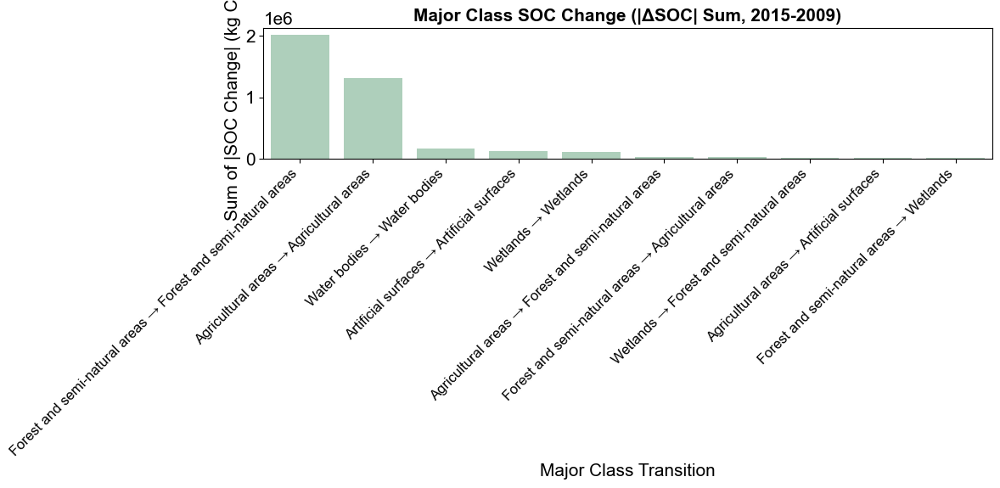

2025-08-11 14:09:48,365 - INFO - 
2015-2009 大类SOC变化绝对值总和 (前10):
2025-08-11 14:09:48,374 - INFO -                                            Transition        AbsSum     Count
12  Forest and semi-natural areas → Forest and sem...  2.019768e+06  14877567
6             Agricultural areas → Agricultural areas  1.317566e+06  13629056
24                        Water bodies → Water bodies  1.733074e+05    987505
0           Artificial surfaces → Artificial surfaces  1.305068e+05   1333865
18                                Wetlands → Wetlands  1.144272e+05    881614
7   Agricultural areas → Forest and semi-natural a...  3.342636e+04    239049
11  Forest and semi-natural areas → Agricultural a...  2.728267e+04    193787
17           Wetlands → Forest and semi-natural areas  1.404705e+04     71821
5            Agricultural areas → Artificial surfaces  1.259053e+04    132060
13           Forest and semi-natural areas → Wetlands  1.248695e+04     73901


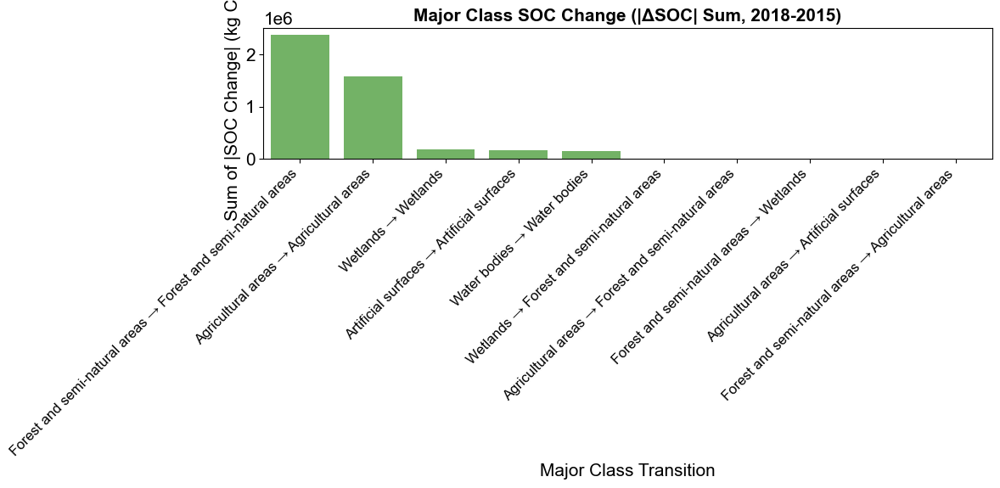

2025-08-11 14:09:48,610 - INFO - 
2018-2015 大类SOC变化绝对值总和 (前10):
2025-08-11 14:09:48,611 - INFO -                                            Transition        AbsSum     Count
12  Forest and semi-natural areas → Forest and sem...  2.384560e+06  15194069
6             Agricultural areas → Agricultural areas  1.577846e+06  13837802
18                                Wetlands → Wetlands  1.887530e+05    954175
0           Artificial surfaces → Artificial surfaces  1.646152e+05   1489381
24                        Water bodies → Water bodies  1.588318e+05   1017429
17           Wetlands → Forest and semi-natural areas  3.764101e+03     13607
7   Agricultural areas → Forest and semi-natural a...  3.299965e+03     20340
13           Forest and semi-natural areas → Wetlands  2.611677e+03      9542
5            Agricultural areas → Artificial surfaces  1.988777e+03     17536
11  Forest and semi-natural areas → Agricultural a...  1.534516e+03     10878


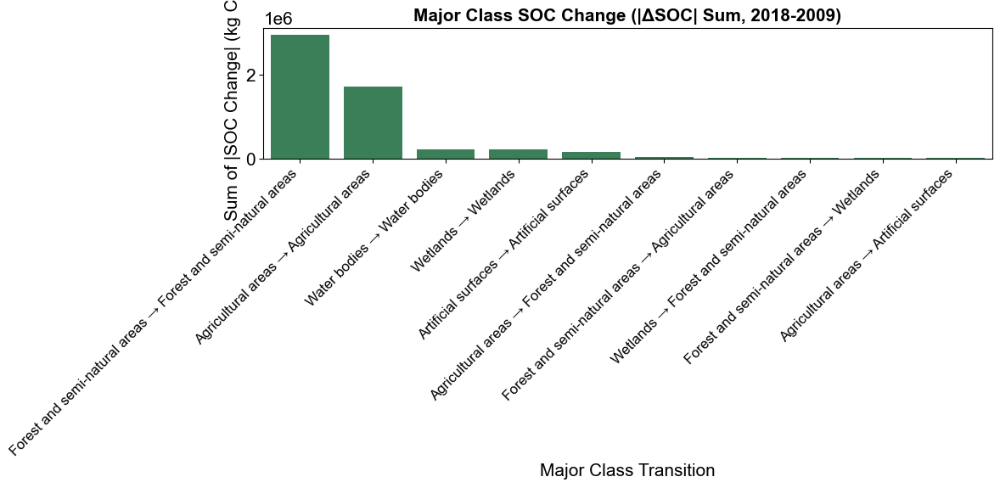

2025-08-11 14:09:48,892 - INFO - 
2018-2009 大类SOC变化绝对值总和 (前10):
2025-08-11 14:09:48,893 - INFO -                                            Transition        AbsSum     Count
12  Forest and semi-natural areas → Forest and sem...  2.955157e+06  14872527
6             Agricultural areas → Agricultural areas  1.716657e+06  13601705
24                        Water bodies → Water bodies  2.237721e+05    987142
18                                Wetlands → Wetlands  2.216841e+05    878751
0           Artificial surfaces → Artificial surfaces  1.697323e+05   1332052
7   Agricultural areas → Forest and semi-natural a...  4.252198e+04    250077
11  Forest and semi-natural areas → Agricultural a...  3.308278e+04    195554
17           Wetlands → Forest and semi-natural areas  2.800148e+04     73692
13           Forest and semi-natural areas → Wetlands  2.742964e+04     71822
5            Agricultural areas → Artificial surfaces  1.988434e+04    146895


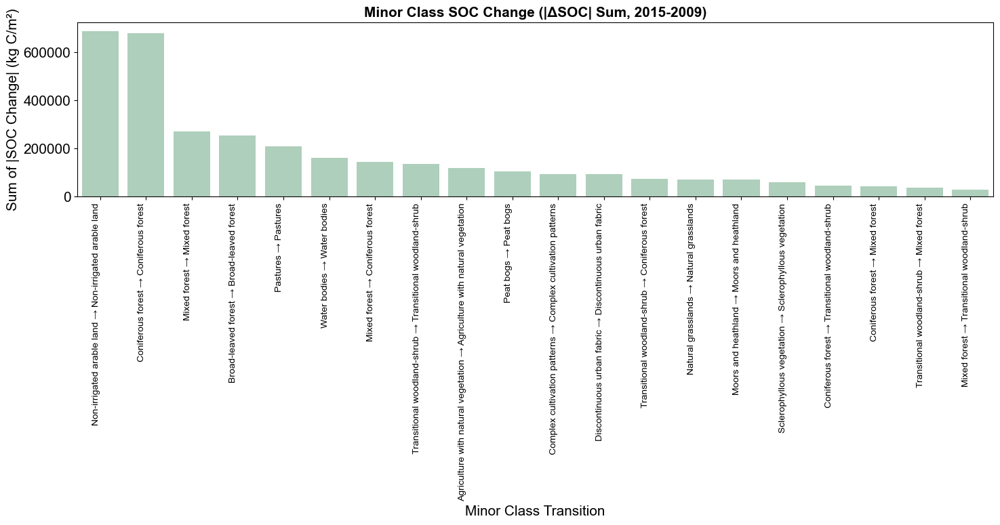

2025-08-11 14:09:49,253 - INFO - 
2015-2009 小类SOC变化绝对值总和 (前20):
2025-08-11 14:09:49,254 - INFO -                                              Transition         AbsSum  \
380   Non-irrigated arable land → Non-irrigated arab...  688817.062500   
820               Coniferous forest → Coniferous forest  678843.000000   
863                         Mixed forest → Mixed forest  270080.781250   
778           Broad-leaved forest → Broad-leaved forest  254729.484375   
589                                 Pastures → Pastures  208566.031250   
1374                        Water bodies → Water bodies  161414.671875   
862                    Mixed forest → Coniferous forest  143938.062500   
1027  Transitional woodland-shrub → Transitional woo...  136281.421875   
704   Agriculture with natural vegetation → Agricult...  118152.789062   
1226                              Peat bogs → Peat bogs  104974.070312   
662   Complex cultivation patterns → Complex cultiva...   92997.210938   
29    Discontin

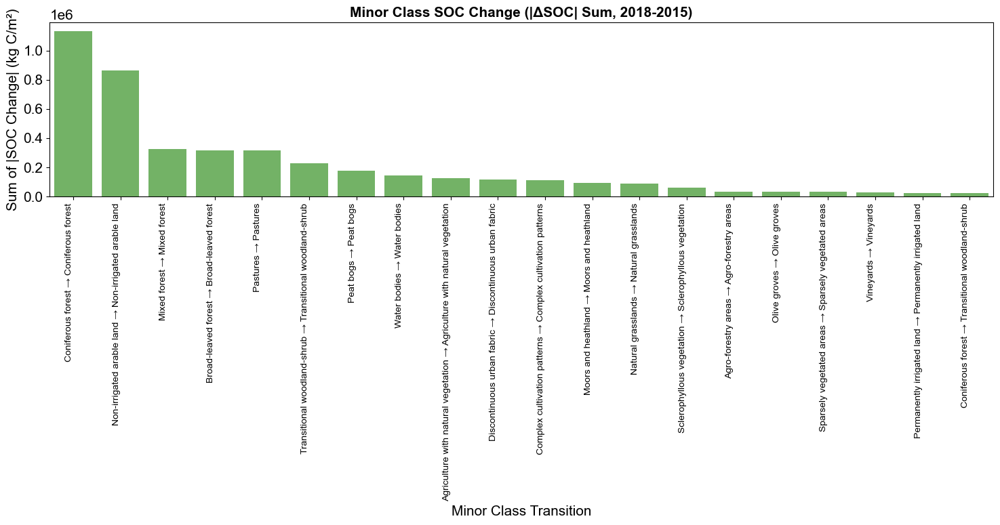

2025-08-11 14:09:49,636 - INFO - 
2018-2015 小类SOC变化绝对值总和 (前20):
2025-08-11 14:09:49,637 - INFO -                                             Transition        AbsSum    Count
558              Coniferous forest → Coniferous forest  1.135302e+06  5874403
212  Non-irrigated arable land → Non-irrigated arab...  8.634194e+05  7458915
596                        Mixed forest → Mixed forest  3.256641e+05  2044726
521          Broad-leaved forest → Broad-leaved forest  3.159678e+05  3076872
368                                Pastures → Pastures  3.147683e+05  2834513
737  Transitional woodland-shrub → Transitional woo...  2.272615e+05  1318530
868                              Peat bogs → Peat bogs  1.762494e+05   858558
934                        Water bodies → Water bodies  1.445773e+05   906990
462  Agriculture with natural vegetation → Agricult...  1.279770e+05  1144593
7    Discontinuous urban fabric → Discontinuous urb...  1.152877e+05  1055729
430  Complex cultivation patterns → Complex c

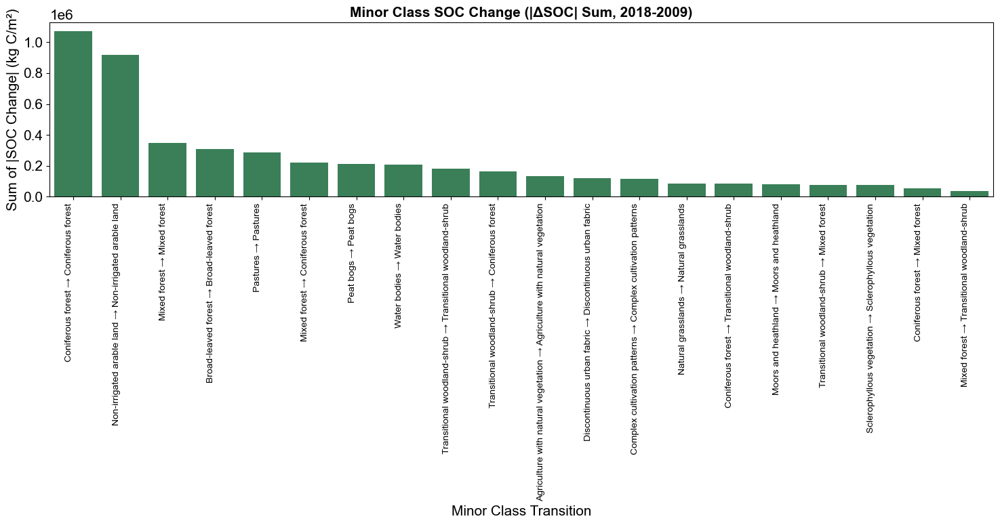

2025-08-11 14:09:49,994 - INFO - 
2018-2009 小类SOC变化绝对值总和 (前20):
2025-08-11 14:09:49,995 - INFO -                                              Transition        AbsSum    Count
828               Coniferous forest → Coniferous forest  1.074227e+06  4773428
381   Non-irrigated arable land → Non-irrigated arab...  9.185758e+05  7105659
871                         Mixed forest → Mixed forest  3.487096e+05  1642416
785           Broad-leaved forest → Broad-leaved forest  3.062011e+05  2809348
594                                 Pastures → Pastures  2.856905e+05  2430651
870                    Mixed forest → Coniferous forest  2.178861e+05   557856
1238                              Peat bogs → Peat bogs  2.108515e+05   792558
1388                        Water bodies → Water bodies  2.088398e+05   881436
1036  Transitional woodland-shrub → Transitional woo...  1.824991e+05   887476
1031    Transitional woodland-shrub → Coniferous forest  1.643691e+05   527052
712   Agriculture with natural veg

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio
from rasterio.warp import reproject, Resampling
import logging

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 设置字体
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 15

# 数据路径
input_dir_soc = r'E:\Project-yqr\new\results\weight'
input_dir_trans = r'E:\Project-yqr\EU_TIFF_500m\transitions'
diff_pairs = [
    ("2015-2009", 2009, 2015),
    ("2018-2015", 2015, 2018),
    ("2018-2009", 2009, 2018)
]

# 大类和小类定义
clc_classes = {
    'Artificial surfaces': list(range(1, 12)),
    'Agricultural areas': list(range(12, 23)),
    'Forest and semi-natural areas': list(range(23, 35)),
    'Wetlands': list(range(35, 40)),
    'Water bodies': list(range(40, 45))
}
clc_class_names = {
    1: 'Continuous urban fabric', 2: 'Discontinuous urban fabric',
    3: 'Industrial or commercial units', 4: 'Road and rail networks',
    5: 'Port areas', 6: 'Airports', 7: 'Mineral extraction sites',
    8: 'Dump sites', 9: 'Construction sites', 10: 'Green urban areas',
    11: 'Sport and leisure facilities', 12: 'Non-irrigated arable land',
    13: 'Permanently irrigated land', 14: 'Rice fields', 15: 'Vineyards',
    16: 'Fruit trees and berry plantations', 17: 'Olive groves', 18: 'Pastures',
    19: 'Annual crops with permanent crops', 20: 'Complex cultivation patterns',
    21: 'Agriculture with natural vegetation', 22: 'Agro-forestry areas',
    23: 'Broad-leaved forest', 24: 'Coniferous forest', 25: 'Mixed forest',
    26: 'Natural grasslands', 27: 'Moors and heathland', 28: 'Sclerophyllous vegetation',
    29: 'Transitional woodland-shrub', 30: 'Beaches, dunes, sands',
    31: 'Bare rocks', 32: 'Sparsely vegetated areas', 33: 'Burnt areas',
    34: 'Glaciers and perpetual snow', 35: 'Inland marshes', 36: 'Peat bogs',
    37: 'Salt marshes', 38: 'Salines', 39: 'Intertidal flats',
    40: 'Water courses', 41: 'Water bodies', 42: 'Coastal lagoons',
    43: 'Estuaries', 44: 'Sea and ocean'
}

# 创建转换类型映射
class_to_category = {cid: cat for cat, cids in clc_classes.items() for cid in cids}
category_to_index = {cat: i for i, cat in enumerate(clc_classes.keys())}

# 大类转换类型映射
major_transition_types = {}
major_transition_id = 1
for from_idx, from_cat in enumerate(clc_classes.keys()):
    for to_idx, to_cat in enumerate(clc_classes.keys()):
        major_transition_types[major_transition_id] = f"{from_cat} → {to_cat}"
        major_transition_id += 1

# 小类转换类型映射
minor_transition_types = {}
minor_transition_id = 1
for from_class_id in range(1, 45):
    for to_class_id in range(1, 45):
        minor_transition_types[minor_transition_id] = f"{clc_class_names[from_class_id]} → {clc_class_names[to_class_id]}"
        minor_transition_id += 1

# 读取栅格并对齐
def read_and_align_rasters(soc_diff_path, trans_path):
    try:
        with rasterio.open(soc_diff_path) as src_soc:
            soc_diff = src_soc.read(1).astype(np.float32)
            soc_diff[soc_diff <= -9999] = np.nan
            soc_profile = src_soc.profile
            soc_transform = src_soc.transform
            soc_shape = soc_diff.shape

        with rasterio.open(trans_path) as src_trans:
            trans_data = src_trans.read(1).astype(np.float32)
            trans_data[trans_data == 0] = np.nan  # Transition nodata = 0

            # Create an empty array with the same shape as SOC diff raster
            trans_aligned = np.empty(soc_shape, dtype=np.float32)
            # Reproject transition raster to match SOC diff raster
            reproject(
                source=trans_data,
                destination=trans_aligned,
                src_transform=src_trans.transform,
                src_crs=src_trans.crs,
                dst_transform=soc_transform,
                dst_crs=soc_profile['crs'],
                resampling=Resampling.nearest
            )

            logger.info(f"加载并对齐栅格: {soc_diff_path}, 形状: {soc_shape}")
            logger.info(f"加载栅格: {trans_path}, 原形状: {trans_data.shape}, 对齐后形状: {trans_aligned.shape}")
            unique_soc = np.unique(soc_diff[~np.isnan(soc_diff)])
            unique_trans = np.unique(trans_aligned[~np.isnan(trans_aligned)])
            logger.info(f"SOC Diff 唯一值: {unique_soc}")
            logger.info(f"Trans 唯一值: {unique_trans}")

            return soc_diff, trans_aligned

    except Exception as e:
        logger.error(f"❌ 加载或对齐栅格失败: {str(e)}")
        return None, None

# 计算SOC差值统计
def calculate_soc_diff_stats(diff_data, trans_data, transition_types):
    valid_mask = (~np.isnan(diff_data)) & (~np.isnan(trans_data))
    diff_valid = diff_data[valid_mask]
    trans_valid = trans_data[valid_mask].astype(int)

    stats = []
    for trans_id, trans_name in transition_types.items():
        mask = (trans_valid == trans_id)
        soc_values = diff_valid[mask]
        if len(soc_values) > 0:
            stats.append({
                'Transition': trans_name,
                'AbsSum': np.sum(np.abs(soc_values)),
                'Count': len(soc_values)
            })

    return pd.DataFrame(stats)

# 绘制条形图
def plot_transition_stats(major_stats_list, minor_stats_list):
    green_palette = ['#A8D5BA', '#6BBF59', '#2E8B57']
    palette_dict = dict(zip([p[0] for p in diff_pairs], green_palette))

    # 大类条形图
    for period, df in major_stats_list:
        df = df.sort_values('AbsSum', ascending=False).head(10)
        plt.figure(figsize=(12, 6))
        sns.barplot(x='Transition', y='AbsSum', data=df, color=palette_dict[period])
        plt.title(f'Major Class SOC Change (|ΔSOC| Sum, {period})', fontsize=15, weight='bold')
        plt.xlabel('Major Class Transition', fontsize=15)
        plt.ylabel('Sum of |SOC Change| (kg C/m²)', fontsize=15)
        plt.xticks(rotation=45, ha='right', fontsize=12)
        plt.tight_layout()
        plt.show()
        logger.info(f"\n{period} 大类SOC变化绝对值总和 (前10):")
        logger.info(df[['Transition', 'AbsSum', 'Count']])

    # 小类条形图
    for period, df in minor_stats_list:
        df = df.sort_values('AbsSum', ascending=False).head(20)
        plt.figure(figsize=(15, 8))
        sns.barplot(x='Transition', y='AbsSum', data=df, color=palette_dict[period])
        plt.title(f'Minor Class SOC Change (|ΔSOC| Sum, {period})', fontsize=15, weight='bold')
        plt.xlabel('Minor Class Transition', fontsize=15)
        plt.ylabel('Sum of |SOC Change| (kg C/m²)', fontsize=15)
        plt.xticks(rotation=90, ha='right', fontsize=10)
        plt.tight_layout()
        plt.show()
        logger.info(f"\n{period} 小类SOC变化绝对值总和 (前20):")
        logger.info(df[['Transition', 'AbsSum', 'Count']])

# 主程序
def main():
    major_stats_list = []
    minor_stats_list = []

    for period, from_year, to_year in diff_pairs:
        soc_diff_path = os.path.join(input_dir_soc, f'weight_pred_diff_{period}.tif')
        major_trans_path = os.path.join(input_dir_trans, f'major_transition_{from_year}_to_{to_year}.tif')
        minor_trans_path = os.path.join(input_dir_trans, f'minor_transition_{from_year}_to_{to_year}.tif')

        # 读取并对齐大类转换栅格
        diff_data, major_trans_data = read_and_align_rasters(soc_diff_path, major_trans_path)
        if diff_data is None or major_trans_data is None:
            logger.error(f"❌ 无法加载 {period} 大类数据，跳过")
            continue

        # 读取并对齐小类转换栅格
        _, minor_trans_data = read_and_align_rasters(soc_diff_path, minor_trans_path)
        if minor_trans_data is None:
            logger.error(f"❌ 无法加载 {period} 小类数据，跳过")
            continue

        # 计算大类和小类SOC差值绝对值总和
        major_stats = calculate_soc_diff_stats(diff_data, major_trans_data, major_transition_types)
        minor_stats = calculate_soc_diff_stats(diff_data, minor_trans_data, minor_transition_types)

        major_stats_list.append((period, major_stats))
        minor_stats_list.append((period, minor_stats))

    # 绘制条形图
    plot_transition_stats(major_stats_list, minor_stats_list)

if __name__ == "__main__":
    main()

2025-08-14 23:00:04,368 - INFO - NumExpr defaulting to 8 threads.
2025-08-14 23:00:10,635 - INFO - 加载并对齐栅格: E:\Project-yqr\new\results\weight\weight_pred_diff_2015-2009.tif / E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2009_to_2015.tif, 形状: (8528, 10865)
2025-08-14 23:00:15,474 - INFO - 加载并对齐栅格: E:\Project-yqr\new\results\weight\weight_pred_diff_2015-2009.tif / E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_2009_to_2015.tif, 形状: (8528, 10865)
2025-08-14 23:01:00,047 - INFO - 加载并对齐栅格: E:\Project-yqr\new\results\weight\weight_pred_diff_2018-2015.tif / E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2015_to_2018.tif, 形状: (8528, 10865)
2025-08-14 23:01:04,028 - INFO - 加载并对齐栅格: E:\Project-yqr\new\results\weight\weight_pred_diff_2018-2015.tif / E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_2015_to_2018.tif, 形状: (8528, 10865)
2025-08-14 23:01:47,315 - INFO - 加载并对齐栅格: E:\Project-yqr\new\results\weight\weight_pred_diff_2018-2009.tif / E:\Project-yqr\EU

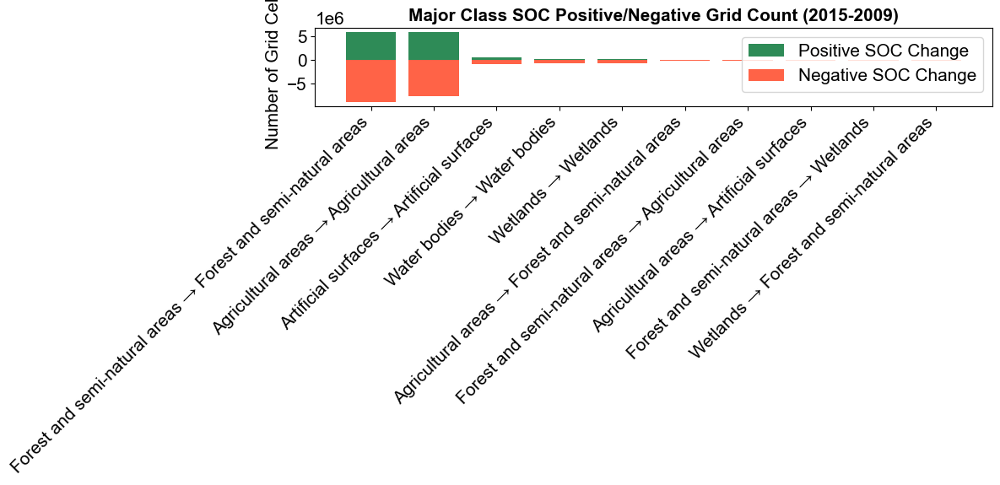

2025-08-14 23:02:33,102 - INFO - 
2015-2009 大类格点数量统计 (前10):
2025-08-14 23:02:33,103 - INFO -                                            Transition  PosCount  NegCount  \
12  Forest and semi-natural areas → Forest and sem...   5974241   8903295   
6             Agricultural areas → Agricultural areas   6022250   7606788   
0           Artificial surfaces → Artificial surfaces    513024    820840   
24                        Water bodies → Water bodies    284175    703326   
18                                Wetlands → Wetlands    295015    586595   
7   Agricultural areas → Forest and semi-natural a...    103303    135746   
11  Forest and semi-natural areas → Agricultural a...     91898    101888   
5            Agricultural areas → Artificial surfaces     59839     72221   
13           Forest and semi-natural areas → Wetlands     12056     61844   
17           Wetlands → Forest and semi-natural areas      9194     62627   

    TotalCount  
12    14877567  
6     13629056  
0      1

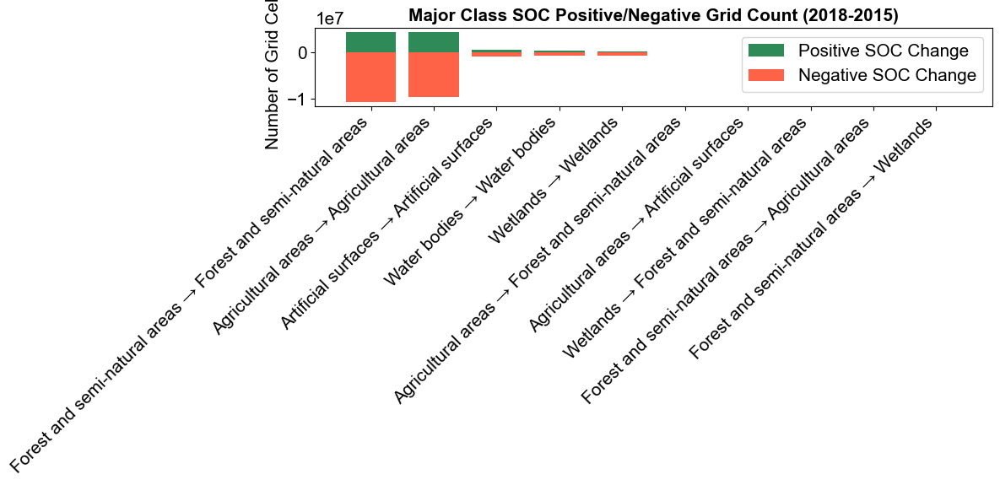

2025-08-14 23:02:33,356 - INFO - 
2018-2015 大类格点数量统计 (前10):
2025-08-14 23:02:33,357 - INFO -                                            Transition  PosCount  NegCount  \
12  Forest and semi-natural areas → Forest and sem...   4482071  10711894   
6             Agricultural areas → Agricultural areas   4368451   9469330   
0           Artificial surfaces → Artificial surfaces    546596    942785   
24                        Water bodies → Water bodies    406362    611062   
18                                Wetlands → Wetlands    205936    748235   
7   Agricultural areas → Forest and semi-natural a...      9773     10567   
5            Agricultural areas → Artificial surfaces      5585     11951   
17           Wetlands → Forest and semi-natural areas      1395     12212   
11  Forest and semi-natural areas → Agricultural a...      4355      6523   
13           Forest and semi-natural areas → Wetlands      1441      8101   

    TotalCount  
12    15194069  
6     13837802  
0      1

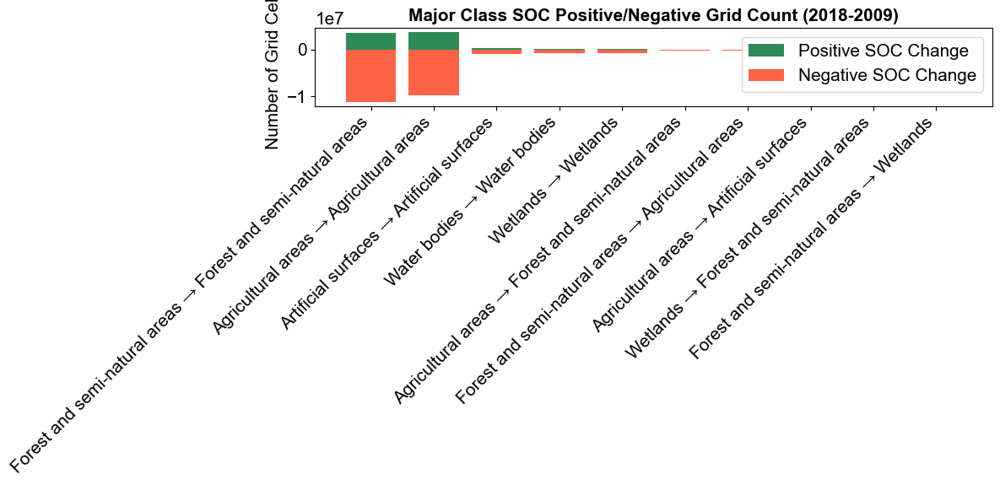

2025-08-14 23:02:33,609 - INFO - 
2018-2009 大类格点数量统计 (前10):
2025-08-14 23:02:33,610 - INFO -                                            Transition  PosCount  NegCount  \
12  Forest and semi-natural areas → Forest and sem...   3575791  11296720   
6             Agricultural areas → Agricultural areas   3865941   9735752   
0           Artificial surfaces → Artificial surfaces    383956    948094   
24                        Water bodies → Water bodies    209437    777705   
18                                Wetlands → Wetlands    158517    720232   
7   Agricultural areas → Forest and semi-natural a...     73026    177050   
11  Forest and semi-natural areas → Agricultural a...     51704    143850   
5            Agricultural areas → Artificial surfaces     48501     98394   
17           Wetlands → Forest and semi-natural areas      4938     68754   
13           Forest and semi-natural areas → Wetlands      5385     66437   

    TotalCount  
12    14872527  
6     13601705  
0      1

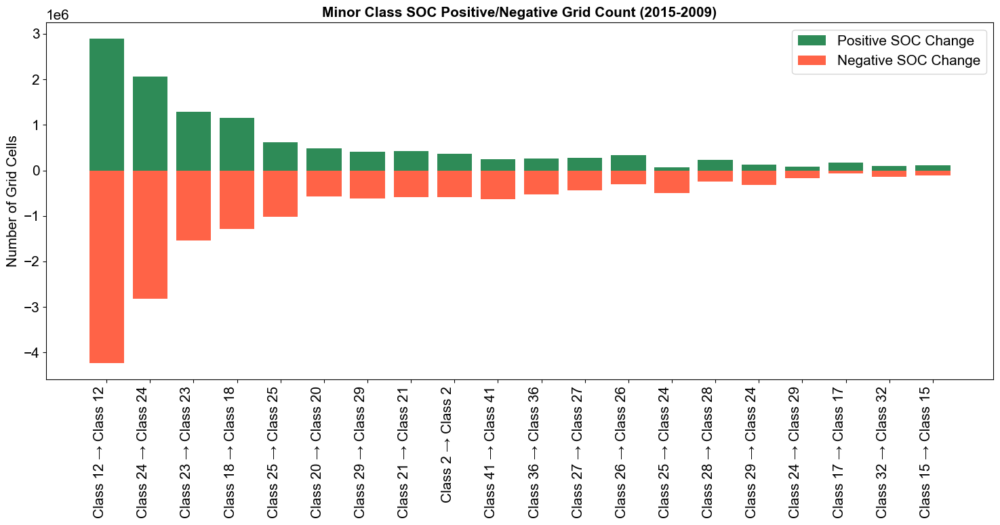

2025-08-14 23:02:33,938 - INFO - 
2015-2009 小类格点数量统计 (前20):
2025-08-14 23:02:33,939 - INFO -                Transition  PosCount  NegCount  TotalCount
495   Class 12 → Class 12   2891133   4235316     7126454
1035  Class 24 → Class 24   2061396   2823238     4884643
990   Class 23 → Class 23   1292243   1535024     2827275
765   Class 18 → Class 18   1160264   1286721     2446994
1080  Class 25 → Class 25    614597   1024358     1638957
855   Class 20 → Class 20    491974    570143     1062119
1260  Class 29 → Class 29    411942    617293     1029235
900   Class 21 → Class 21    431038    582505     1013543
45      Class 2 → Class 2    363966    583067      947034
1800  Class 41 → Class 41    244099    637550      881653
1575  Class 36 → Class 36    261824    533014      794842
1170  Class 27 → Class 27    269435    431592      701032
1125  Class 26 → Class 26    333128    305766      638897
1079  Class 25 → Class 24     64478    494781      559259
1215  Class 28 → Class 28    232062  

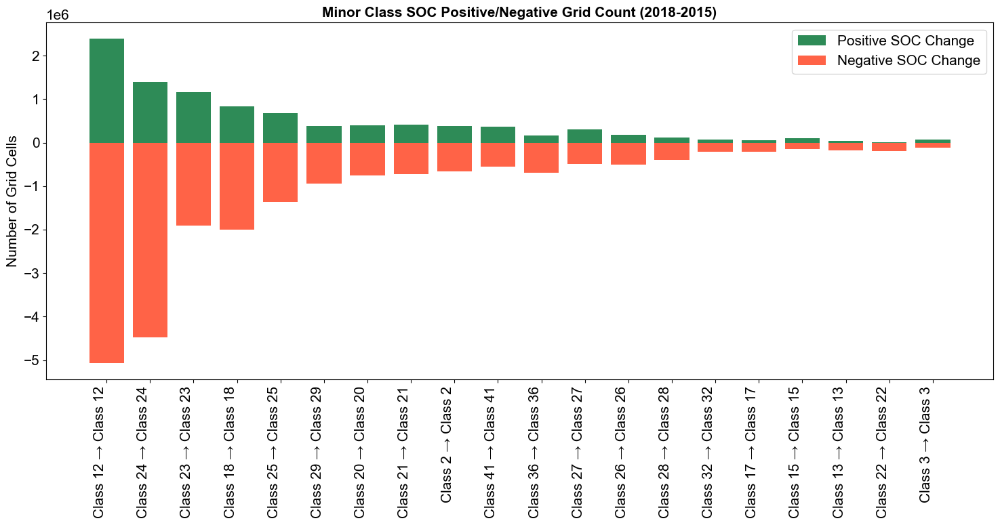

2025-08-14 23:02:34,265 - INFO - 
2018-2015 小类格点数量统计 (前20):
2025-08-14 23:02:34,266 - INFO -                Transition  PosCount  NegCount  TotalCount
495   Class 12 → Class 12   2387451   5071452     7458915
1035  Class 24 → Class 24   1402411   4471986     5874403
990   Class 23 → Class 23   1164983   1911873     3076872
765   Class 18 → Class 18    837851   1996658     2834513
1080  Class 25 → Class 25    677631   1367093     2044726
1260  Class 29 → Class 29    382764    935764     1318530
855   Class 20 → Class 20    394448    759093     1153543
900   Class 21 → Class 21    418579    726012     1144593
45      Class 2 → Class 2    388044    667685     1055729
1800  Class 41 → Class 41    362051    544934      906990
1575  Class 36 → Class 36    167273    691281      858558
1170  Class 27 → Class 27    306153    484120      790301
1125  Class 26 → Class 26    182268    506372      688645
1215  Class 28 → Class 28    117925    397273      515198
1395  Class 32 → Class 32     74217  

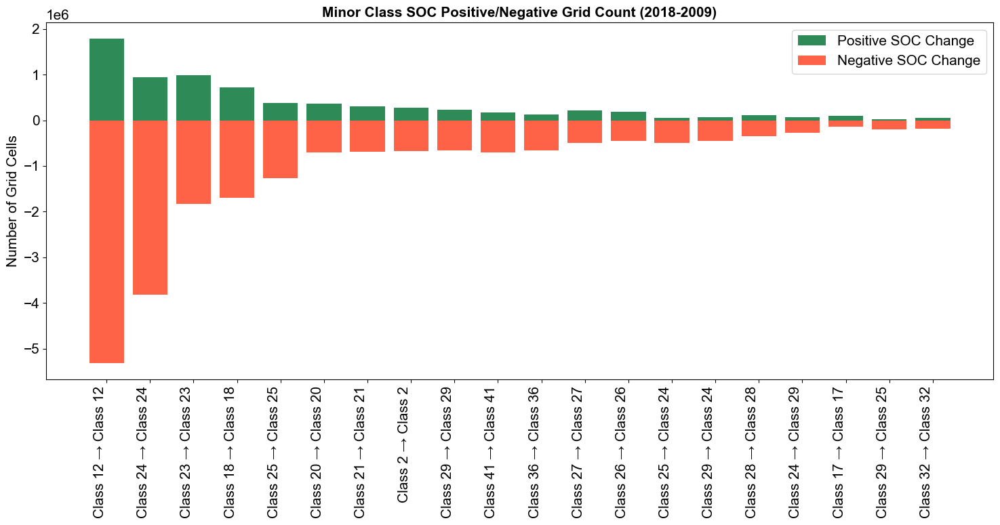

2025-08-14 23:02:34,760 - INFO - 
2018-2009 小类格点数量统计 (前20):
2025-08-14 23:02:34,761 - INFO -                Transition  PosCount  NegCount  TotalCount
495   Class 12 → Class 12   1784233   5321420     7105659
1035  Class 24 → Class 24    946252   3827173     4773428
990   Class 23 → Class 23    980709   1828636     2809348
765   Class 18 → Class 18    725769   1704879     2430651
1080  Class 25 → Class 25    378898   1263517     1642416
855   Class 20 → Class 20    359489    698170     1057659
900   Class 21 → Class 21    306350    689766      996117
45      Class 2 → Class 2    271182    675416      946599
1260  Class 29 → Class 29    224954    662519      887476
1800  Class 41 → Class 41    178288    703148      881436
1575  Class 36 → Class 36    131121    661435      792558
1170  Class 27 → Class 27    208975    490553      699529
1125  Class 26 → Class 26    183382    453625      637009
1079  Class 25 → Class 24     55719    502137      557856
1255  Class 29 → Class 24     69154  

In [23]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio
from rasterio.warp import reproject, Resampling
import logging

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 设置字体
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 15

# 数据路径
input_dir_soc = r'E:\Project-yqr\new\results\weight'
input_dir_trans = r'E:\Project-yqr\EU_TIFF_500m\transitions'
diff_pairs = [
    ("2015-2009", 2009, 2015),
    ("2018-2015", 2015, 2018),
    ("2018-2009", 2009, 2018)
]

# 大类和小类定义
clc_classes = {
    'Artificial surfaces': list(range(1, 12)),
    'Agricultural areas': list(range(12, 23)),
    'Forest and semi-natural areas': list(range(23, 35)),
    'Wetlands': list(range(35, 40)),
    'Water bodies': list(range(40, 45))
}
clc_class_names = {i: f"Class {i}" for i in range(1, 45)}  # 可替换成你原来的名称

# 大类转换类型映射
major_transition_types = {}
major_transition_id = 1
for from_idx, from_cat in enumerate(clc_classes.keys()):
    for to_idx, to_cat in enumerate(clc_classes.keys()):
        major_transition_types[major_transition_id] = f"{from_cat} → {to_cat}"
        major_transition_id += 1

# 小类转换类型映射
minor_transition_types = {}
minor_transition_id = 1
for from_class_id in range(1, 45):
    for to_class_id in range(1, 45):
        minor_transition_types[minor_transition_id] = f"{clc_class_names[from_class_id]} → {clc_class_names[to_class_id]}"
        minor_transition_id += 1

# 读取栅格并对齐
def read_and_align_rasters(soc_diff_path, trans_path):
    try:
        with rasterio.open(soc_diff_path) as src_soc:
            soc_diff = src_soc.read(1).astype(np.float32)
            soc_diff[soc_diff <= -9999] = np.nan
            soc_profile = src_soc.profile
            soc_transform = src_soc.transform
            soc_shape = soc_diff.shape

        with rasterio.open(trans_path) as src_trans:
            trans_data = src_trans.read(1).astype(np.float32)
            trans_data[trans_data == 0] = np.nan  # Transition nodata = 0
            trans_aligned = np.empty(soc_shape, dtype=np.float32)
            reproject(
                source=trans_data,
                destination=trans_aligned,
                src_transform=src_trans.transform,
                src_crs=src_trans.crs,
                dst_transform=soc_transform,
                dst_crs=soc_profile['crs'],
                resampling=Resampling.nearest
            )
            logger.info(f"加载并对齐栅格: {soc_diff_path} / {trans_path}, 形状: {soc_shape}")
            return soc_diff, trans_aligned
    except Exception as e:
        logger.error(f"❌ 加载或对齐栅格失败: {str(e)}")
        return None, None

# 计算SOC正负格点数量
def calculate_soc_pos_neg_counts(diff_data, trans_data, transition_types):
    valid_mask = (~np.isnan(diff_data)) & (~np.isnan(trans_data))
    diff_valid = diff_data[valid_mask]
    trans_valid = trans_data[valid_mask].astype(int)

    stats = []
    for trans_id, trans_name in transition_types.items():
        mask = (trans_valid == trans_id)
        soc_values = diff_valid[mask]
        pos_count = np.sum(soc_values > 0)
        neg_count = np.sum(soc_values < 0)
        stats.append({
            'Transition': trans_name,
            'PosCount': pos_count,
            'NegCount': neg_count,
            'TotalCount': len(soc_values)
        })
    return pd.DataFrame(stats)

# 绘制正负格点柱状图
def plot_transition_counts(stats_list, top_n_major=10, top_n_minor=20):
    palette_dict = ['#2E8B57', '#FF6347']  # 绿色正值，红色负值

    # 大类绘图
    for period, df in stats_list['major']:
        df_sorted = df.sort_values('TotalCount', ascending=False).head(top_n_major)
        plt.figure(figsize=(12, 6))
        plt.bar(df_sorted['Transition'], df_sorted['PosCount'], label='Positive SOC Change', color=palette_dict[0])
        plt.bar(df_sorted['Transition'], -df_sorted['NegCount'], label='Negative SOC Change', color=palette_dict[1])
        plt.xticks(rotation=45, ha='right')
        plt.ylabel('Number of Grid Cells')
        plt.title(f'Major Class SOC Positive/Negative Grid Count ({period})', fontsize=15, weight='bold')
        plt.legend()
        plt.tight_layout()
        plt.show()
        logger.info(f"\n{period} 大类格点数量统计 (前{top_n_major}):")
        logger.info(df_sorted[['Transition', 'PosCount', 'NegCount', 'TotalCount']])

    # 小类绘图
    for period, df in stats_list['minor']:
        df_sorted = df.sort_values('TotalCount', ascending=False).head(top_n_minor)
        plt.figure(figsize=(15, 8))
        plt.bar(df_sorted['Transition'], df_sorted['PosCount'], label='Positive SOC Change', color=palette_dict[0])
        plt.bar(df_sorted['Transition'], -df_sorted['NegCount'], label='Negative SOC Change', color=palette_dict[1])
        plt.xticks(rotation=90, ha='right')
        plt.ylabel('Number of Grid Cells')
        plt.title(f'Minor Class SOC Positive/Negative Grid Count ({period})', fontsize=15, weight='bold')
        plt.legend()
        plt.tight_layout()
        plt.show()
        logger.info(f"\n{period} 小类格点数量统计 (前{top_n_minor}):")
        logger.info(df_sorted[['Transition', 'PosCount', 'NegCount', 'TotalCount']])

# 主程序
def main():
    stats_list = {'major': [], 'minor': []}

    for period, from_year, to_year in diff_pairs:
        soc_diff_path = os.path.join(input_dir_soc, f'weight_pred_diff_{period}.tif')
        major_trans_path = os.path.join(input_dir_trans, f'major_transition_{from_year}_to_{to_year}.tif')
        minor_trans_path = os.path.join(input_dir_trans, f'minor_transition_{from_year}_to_{to_year}.tif')

        # 读取并对齐栅格
        diff_data, major_trans_data = read_and_align_rasters(soc_diff_path, major_trans_path)
        _, minor_trans_data = read_and_align_rasters(soc_diff_path, minor_trans_path)

        if diff_data is None or major_trans_data is None or minor_trans_data is None:
            logger.error(f"❌ {period} 数据加载失败，跳过")
            continue

        # 统计格点数量
        major_stats = calculate_soc_pos_neg_counts(diff_data, major_trans_data, major_transition_types)
        minor_stats = calculate_soc_pos_neg_counts(diff_data, minor_trans_data, minor_transition_types)

        stats_list['major'].append((period, major_stats))
        stats_list['minor'].append((period, minor_stats))

    # 绘图
    plot_transition_counts(stats_list)

if __name__ == "__main__":
    main()


### 正负分开

2025-08-11 14:13:18,406 - INFO - 加载SOC栅格: E:\Project-yqr\new\results\weight\weight_pred_2009.tif, nodata值: nan, 唯一值: [ 0.70926458  0.74781454  0.7592054  ... 18.1001358  18.12057495
 18.12626076]
2025-08-11 14:13:18,407 - INFO - 加载并对齐CLC栅格: E:\Project-yqr\EU_TIFF_500m\EU_CLC_2009.tif, 原形状: (9644, 22804), 对齐后形状: (8528, 10865), 唯一值: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-11 14:13:27,493 - INFO - 加载SOC栅格: E:\Project-yqr\new\results\weight\weight_pred_2015.tif, nodata值: nan, 唯一值: [ 0.69440252  0.7280581   0.74462771 ... 18.09090424 18.11365318
 18.16356277]
2025-08-11 14:13:27,494 - INFO - 加载并对齐CLC栅格: E:\Project-yqr\EU_TIFF_500m\EU_CLC_2015.tif, 原形状: (9644, 22804), 对齐后形状: (8528, 10865), 唯一值: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
2025-08-11 14:13:36,630 - INFO - 加载SOC栅格: E:\Project-yqr\new\res

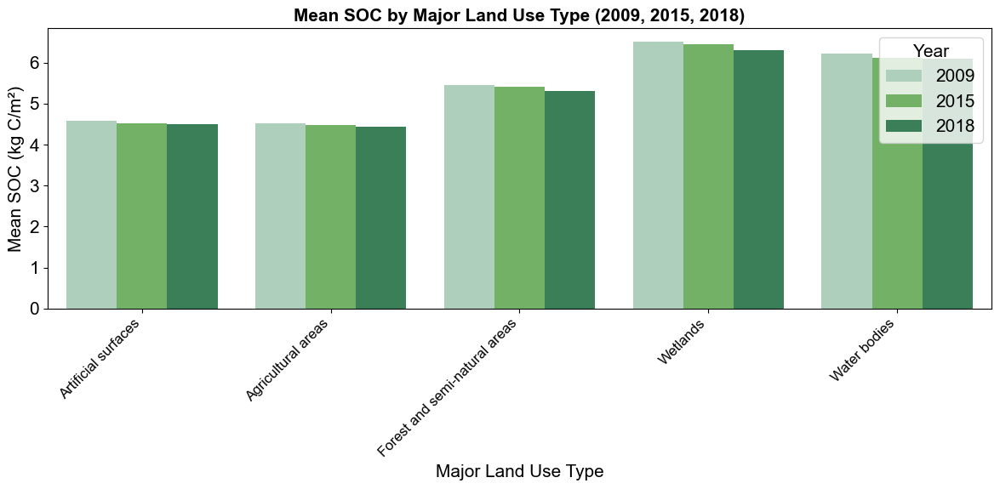

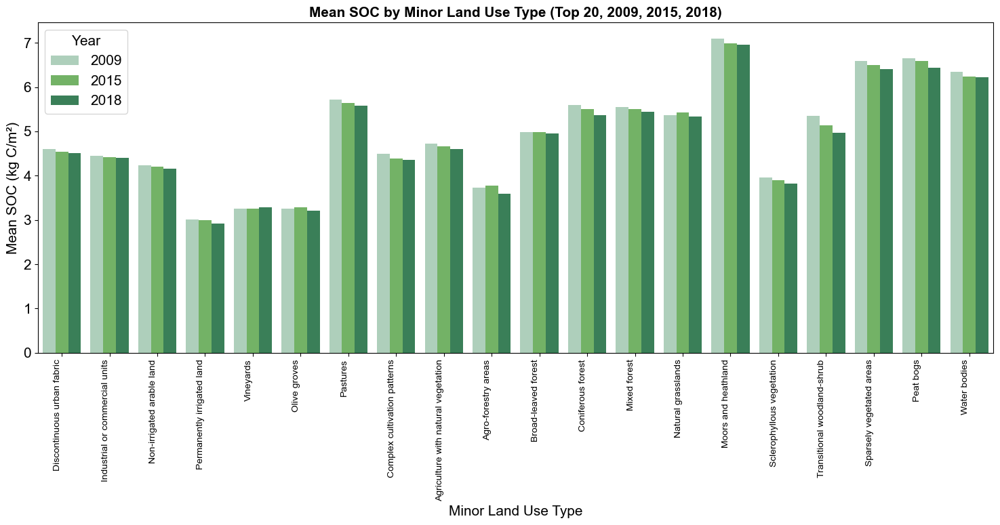

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ptitprince as pt
import rasterio
from rasterio.warp import reproject, Resampling
import logging
from matplotlib.colors import ListedColormap

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 设置字体
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 15

# 数据路径和年份
years = [2009, 2015, 2018]
soc_rasters = {
    2009: r'E:\Project-yqr\new\results\weight\weight_pred_2009.tif',
    2015: r'E:\Project-yqr\new\results\weight\weight_pred_2015.tif',
    2018: r'E:\Project-yqr\new\results\weight\weight_pred_2018.tif',
}
clc_rasters = {
    2009: r'E:\Project-yqr\EU_TIFF_500m\EU_CLC_2009.tif',
    2015: r'E:\Project-yqr\EU_TIFF_500m\EU_CLC_2015.tif',
    2018: r'E:\Project-yqr\EU_TIFF_500m\EU_CLC_2018.tif',
}

# 大类和小类定义
clc_classes = {
    'Artificial surfaces': list(range(1, 12)),
    'Agricultural areas': list(range(12, 23)),
    'Forest and semi-natural areas': list(range(23, 35)),
    'Wetlands': list(range(35, 40)),
    'Water bodies': list(range(40, 45))
}
clc_class_names = {
    1: 'Continuous urban fabric', 2: 'Discontinuous urban fabric',
    3: 'Industrial or commercial units', 4: 'Road and rail networks',
    5: 'Port areas', 6: 'Airports', 7: 'Mineral extraction sites',
    8: 'Dump sites', 9: 'Construction sites', 10: 'Green urban areas',
    11: 'Sport and leisure facilities', 12: 'Non-irrigated arable land',
    13: 'Permanently irrigated land', 14: 'Rice fields', 15: 'Vineyards',
    16: 'Fruit trees and berry plantations', 17: 'Olive groves', 18: 'Pastures',
    19: 'Annual crops with permanent crops', 20: 'Complex cultivation patterns',
    21: 'Agriculture with natural vegetation', 22: 'Agro-forestry areas',
    23: 'Broad-leaved forest', 24: 'Coniferous forest', 25: 'Mixed forest',
    26: 'Natural grasslands', 27: 'Moors and heathland', 28: 'Sclerophyllous vegetation',
    29: 'Transitional woodland-shrub', 30: 'Beaches, dunes, sands',
    31: 'Bare rocks', 32: 'Sparsely vegetated areas', 33: 'Burnt areas',
    34: 'Glaciers and perpetual snow', 35: 'Inland marshes', 36: 'Peat bogs',
    37: 'Salt marshes', 38: 'Salines', 39: 'Intertidal flats',
    40: 'Water courses', 41: 'Water bodies', 42: 'Coastal lagoons',
    43: 'Estuaries', 44: 'Sea and ocean'
}

# 创建CLC值到大类的映射
class_to_major = {cid: cat for cat, cids in clc_classes.items() for cid in cids}

# 读取并对齐栅格数据
def read_and_align_rasters(soc_path, clc_path):
    try:
        # 读取SOC栅格
        with rasterio.open(soc_path) as src_soc:
            soc_data = src_soc.read(1).astype(np.float32)
            nodata_soc = src_soc.nodatavals[0] if src_soc.nodatavals else None
            if nodata_soc is not None:
                soc_data[soc_data <= -9999] = np.nan
            soc_profile = src_soc.profile
            soc_transform = src_soc.transform
            soc_shape = soc_data.shape

        # 读取CLC栅格并对齐到SOC栅格
        with rasterio.open(clc_path) as src_clc:
            clc_data = src_clc.read(1).astype(np.float32)
            clc_data[clc_data == 48] = np.nan  # 处理CLC nodata值

            # 创建与SOC栅格相同形状的空数组
            clc_aligned = np.empty(soc_shape, dtype=np.float32)
            # 对齐CLC栅格到SOC栅格
            reproject(
                source=clc_data,
                destination=clc_aligned,
                src_transform=src_clc.transform,
                src_crs=src_clc.crs,
                dst_transform=soc_transform,
                dst_crs=soc_profile['crs'],
                resampling=Resampling.nearest
            )

            # 确保CLC值是整数
            clc_aligned = np.round(clc_aligned).astype(np.float32)
            clc_aligned[clc_aligned < 1] = np.nan  # 排除无效值
            clc_aligned[clc_aligned > 44] = np.nan

            # 记录唯一值
            unique_soc = np.unique(soc_data[~np.isnan(soc_data)]).astype(float)
            unique_clc = np.unique(clc_aligned[~np.isnan(clc_aligned)]).astype(int)
            logger.info(f"加载SOC栅格: {soc_path}, nodata值: {nodata_soc}, 唯一值: {unique_soc}")
            logger.info(f"加载并对齐CLC栅格: {clc_path}, 原形状: {clc_data.shape}, 对齐后形状: {clc_aligned.shape}, 唯一值: {unique_clc}")

            return soc_data, clc_aligned

    except Exception as e:
        logger.error(f"❌ 加载或对齐栅格失败: {str(e)}")
        return None, None

# 计算SOC统计值（按大类和小类）
def calculate_soc_stats(soc_data, clc_data, year):
    valid_mask = (~np.isnan(soc_data)) & (~np.isnan(clc_data))
    soc_valid = soc_data[valid_mask]
    clc_valid = clc_data[valid_mask].astype(int)

    # 过滤无效CLC值
    valid_clc_mask = np.isin(clc_valid, list(range(1, 45)))
    if not valid_clc_mask.all():
        invalid_clc = np.unique(clc_valid[~valid_clc_mask])
        logger.warning(f"⚠️ 发现无效CLC值: {invalid_clc}, 已排除")
    soc_valid = soc_valid[valid_clc_mask]
    clc_valid = clc_valid[valid_clc_mask]

    # 大类统计
    major_stats = []
    for major_class, class_ids in clc_classes.items():
        mask = np.isin(clc_valid, class_ids)
        soc_values = soc_valid[mask]
        if len(soc_values) > 0:
            major_stats.append({
                'Year': str(year),
                'Class': major_class,
                'Max': np.max(soc_values),
                'Min': np.min(soc_values),
                'Mean': np.mean(soc_values),
                'Median': np.median(soc_values),
                'Count': len(soc_values)
            })

    # 小类统计
    minor_stats = []
    for class_id in range(1, 45):
        mask = (clc_valid == class_id)
        soc_values = soc_valid[mask]
        if len(soc_values) > 0:
            minor_stats.append({
                'Year': str(year),
                'Class': clc_class_names[class_id],
                'Max': np.max(soc_values),
                'Min': np.min(soc_values),
                'Mean': np.mean(soc_values),
                'Median': np.median(soc_values),
                'Count': len(soc_values)
            })

    # 原始SOC值（用于箱线图）
    df_raw = pd.DataFrame({
        'SOC': soc_valid,
        'CLC': clc_valid,
        'Year': str(year),
        'MajorClass': [class_to_major.get(c, 'Unknown') for c in clc_valid]
    })

    # 检查是否有未知大类
    unknown_count = (df_raw['MajorClass'] == 'Unknown').sum()
    if unknown_count > 0:
        logger.warning(f"⚠️ {year} 数据中发现 {unknown_count} 个未映射到大类的CLC值")

    return pd.DataFrame(major_stats), pd.DataFrame(minor_stats), df_raw

# 主程序
def main():
    # 读取并对齐所有年份数据
    soc_data = {}
    clc_data = {}
    for year in years:
        soc_data[year], clc_data[year] = read_and_align_rasters(soc_rasters[year], clc_rasters[year])
        if soc_data[year] is None or clc_data[year] is None:
            logger.error(f"❌ 无法加载或对齐 {year} 数据，退出")
            return

    # 计算统计值
    major_stats_all = []
    minor_stats_all = []
    raw_data_all = []
    for year in years:
        major_stats, minor_stats, df_raw = calculate_soc_stats(soc_data[year], clc_data[year], year)
        major_stats_all.append(major_stats)
        minor_stats_all.append(minor_stats)
        raw_data_all.append(df_raw)
    
    df_major_stats = pd.concat(major_stats_all, ignore_index=True)
    df_minor_stats = pd.concat(minor_stats_all, ignore_index=True)
    df_raw = pd.concat(raw_data_all, ignore_index=True)

    # 输出统计结果
    logger.info("\n大类SOC统计 (kg C/m²):")
    logger.info(df_major_stats)
    logger.info("\n小类SOC统计 (kg C/m²):")
    logger.info(df_minor_stats)

    # 绿色系调色板
    green_palette = ['#A8D5BA', '#6BBF59', '#2E8B57']
    year_order = sorted(df_raw['Year'].unique())
    palette_dict = dict(zip(year_order, green_palette))

    # 条形图：大类SOC平均值
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Class', y='Mean', hue='Year', data=df_major_stats, palette=palette_dict)
    plt.title('Mean SOC by Major Land Use Type (2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Major Land Use Type', fontsize=15)
    plt.ylabel('Mean SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.legend(title='Year')
    plt.tight_layout()
    plt.show()

    # 条形图：小类SOC平均值（仅显示前20个高面积类型，避免拥挤）
    top_minor_classes = df_minor_stats.groupby('Class')['Count'].sum().nlargest(20).index
    df_minor_top = df_minor_stats[df_minor_stats['Class'].isin(top_minor_classes)]
    plt.figure(figsize=(15, 8))
    sns.barplot(x='Class', y='Mean', hue='Year', data=df_minor_top, palette=palette_dict)
    plt.title('Mean SOC by Minor Land Use Type (Top 20, 2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Minor Land Use Type', fontsize=15)
    plt.ylabel('Mean SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=90, ha='right', fontsize=10)
    plt.legend(title='Year')
    plt.tight_layout()
    plt.show()

    # 箱线图：大类SOC分布
    plt.figure(figsize=(12, 8))
    pt.half_violinplot(x='MajorClass', y='SOC', hue='Year', data=df_raw, 
                       palette=palette_dict, bw=0.2, cut=0, scale='area', width=0.6, inner=None)
    sns.boxplot(x='MajorClass', y='SOC', hue='Year', data=df_raw, palette=palette_dict, 
                width=0.2, dodge=True, showcaps=True, boxprops={'facecolor': 'none', 'edgecolor': 'black'},
                whiskerprops={'linewidth': 1.5}, medianprops={'color': 'black', 'linewidth': 1.5}, showfliers=False)
    np.random.seed(42)
    sampled_df = df_raw.groupby(['Year', 'MajorClass']).apply(lambda x: x.sample(min(len(x), 1000))).reset_index(drop=True)
    sns.stripplot(x='MajorClass', y='SOC', hue='Year', data=sampled_df, palette=palette_dict, 
                  size=3, jitter=0.15, alpha=0.5, dodge=True)
    
    # 标注平均值和中位数
    for i, major_class in enumerate(df_raw['MajorClass'].unique()):
        for j, year in enumerate(year_order):
            mean_val = df_raw[(df_raw['MajorClass'] == major_class) & (df_raw['Year'] == year)]['SOC'].mean()
            median_val = df_raw[(df_raw['MajorClass'] == major_class) & (df_raw['Year'] == year)]['SOC'].median()
            x_pos = i + (j - 1) * 0.2
            plt.scatter(x_pos, mean_val, facecolor='none', marker='o', edgecolor='black', s=70)
            plt.text(x_pos - 0.1, df_raw['SOC'].max() - 0.5, 
                     f'M:{mean_val:.2f}\nMed:{median_val:.2f}', 
                     ha='center', va='top', fontsize=10, color=green_palette[j])
    
    plt.title('SOC Distribution by Major Land Use Type (2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Major Land Use Type', fontsize=15)
    plt.ylabel('SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.legend(title='Year')
    sns.despine()
    plt.tight_layout()
    plt.show()

    # 箱线图：小类SOC分布（仅前10个类型，避免拥挤）
    top_minor_classes = df_minor_stats.groupby('Class')['Count'].sum().nlargest(10).index
    df_raw_top = df_raw[df_raw['CLC'].isin([k for k, v in clc_class_names.items() if v in top_minor_classes])]
    df_raw_top['ClassName'] = df_raw_top['CLC'].map(clc_class_names)
    
    plt.figure(figsize=(15, 8))
    pt.half_violinplot(x='ClassName', y='SOC', hue='Year', data=df_raw_top, 
                       palette=palette_dict, bw=0.2, cut=0, scale='area', width=0.6, inner=None)
    sns.boxplot(x='ClassName', y='SOC', hue='Year', data=df_raw_top, palette=palette_dict, 
                width=0.2, dodge=True, showcaps=True, boxprops={'facecolor': 'none', 'edgecolor': 'black'},
                whiskerprops={'linewidth': 1.5}, medianprops={'color': 'black', 'linewidth': 1.5}, showfliers=False)
    sampled_df = df_raw_top.groupby(['Year', 'ClassName']).apply(lambda x: x.sample(min(len(x), 1000))).reset_index(drop=True)
    sns.stripplot(x='ClassName', y='SOC', hue='Year', data=sampled_df, palette=palette_dict, 
                  size=3, jitter=0.15, alpha=0.5, dodge=True)
    
    # 标注平均值和中位数
    for i, class_name in enumerate(df_raw_top['ClassName'].unique()):
        for j, year in enumerate(year_order):
            mean_val = df_raw_top[(df_raw_top['ClassName'] == class_name) & (df_raw_top['Year'] == year)]['SOC'].mean()
            median_val = df_raw_top[(df_raw_top['ClassName'] == class_name) & (df_raw_top['Year'] == year)]['SOC'].median()
            x_pos = i + (j - 1) * 0.2
            plt.scatter(x_pos, mean_val, facecolor='none', marker='o', edgecolor='black', s=70)
            plt.text(x_pos - 0.1, df_raw_top['SOC'].max() - 0.5, 
                     f'M:{mean_val:.2f}\nMed:{median_val:.2f}', 
                     ha='center', va='top', fontsize=10, color=green_palette[j])
    
    plt.title('SOC Distribution by Minor Land Use Type (Top 10, 2009, 2015, 2018)', fontsize=15, weight='bold')
    plt.xlabel('Minor Land Use Type', fontsize=15)
    plt.ylabel('SOC (kg C/m²)', fontsize=15)
    plt.xticks(rotation=90, ha='right', fontsize=10)
    plt.legend(title='Year')
    sns.despine()
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

### 转换空间图

In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
from matplotlib.patches import Patch
import logging

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径
input_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)
periods = [(2009, 2015), (2015, 2018), (2009, 2018)]

# 大类定义（用于解析转换类型）
clc_classes = {
    'Artificial surfaces': [
        (1, 'Continuous urban fabric'), (2, 'Discontinuous urban fabric'),
        (3, 'Industrial or commercial units'), (4, 'Road and rail networks'),
        (5, 'Port areas'), (6, 'Airports'), (7, 'Mineral extraction sites'),
        (8, 'Dump sites'), (9, 'Construction sites'), (10, 'Green urban areas'),
        (11, 'Sport and leisure facilities')
    ],
    'Agricultural areas': [
        (12, 'Non-irrigated arable land'), (13, 'Permanently irrigated land'),
        (14, 'Rice fields'), (15, 'Vineyards'), (16, 'Fruit trees and berry plantations'),
        (17, 'Olive groves'), (18, 'Pastures'), (19, 'Annual crops with permanent crops'),
        (20, 'Complex cultivation patterns'), (21, 'Agriculture with natural vegetation'),
        (22, 'Agro-forestry areas')
    ],
    'Forest and semi-natural areas': [
        (23, 'Broad-leaved forest'), (24, 'Coniferous forest'),
        (25, 'Mixed forest'), (26, 'Natural grasslands'),
        (27, 'Moors and heathland'), (28, 'Sclerophyllous vegetation'),
        (29, 'Transitional woodland-shrub'), (30, 'Beaches, dunes, sands'),
        (31, 'Bare rocks'), (32, 'Sparsely vegetated areas'),
        (33, 'Burnt areas'), (34, 'Glaciers and perpetual snow')
    ],
    'Wetlands': [
        (35, 'Inland marshes'), (36, 'Peat bogs'), (37, 'Salt marshes'),
        (38, 'Salines'), (39, 'Intertidal flats')
    ],
    'Water bodies': [
        (40, 'Water courses'), (41, 'Water bodies'), (42, 'Coastal lagoons'),
        (43, 'Estuaries'), (44, 'Sea and ocean')
    ]
}

# 读取转换类型
def load_transition_types():
    transition_types = {}
    types_file = os.path.join(input_dir, "minor_transition_types.txt")
    try:
        with open(types_file, 'r', encoding='utf-8') as f:
            for line in f:
                tid = int(line.split(":")[0].replace("ID ", "").strip())
                name = line.split(":")[1].strip()
                transition_types[tid] = name
        logger.info(f"📝 已加载小类转换类型: {types_file}")
    except Exception as e:
        logger.error(f"❌ 加载小类转换类型失败: {str(e)}")
        return None
    return transition_types

# 读取转换栅格
def read_transition_tiff(path):
    try:
        with rasterio.open(path) as src:
            data = src.read(1).astype(np.int16)
            bounds = src.bounds
            logger.info(f"加载小类转换栅格: {path}")
            return data, bounds
    except Exception as e:
        logger.error(f"❌ 加载 {path} 失败: {str(e)}")
        return None, None

# 绘制空间分布图
def plot_minor_transition_maps():
    transition_types = load_transition_types()
    if transition_types is None:
        return
    
    # 使用颜色循环，避免过多转换类型
    colors = plt.cm.tab20.colors + plt.cm.tab20b.colors  # 40种颜色
    used_tids = set()
    for path in [os.path.join(input_dir, f"minor_transition_{from_year}_to_{to_year}.tif") 
                 for from_year, to_year in periods]:
        data, _ = read_transition_tiff(path)
        if data is not None:
            used_tids.update(np.unique(data[data != 0]).astype(int))
    
    # 仅显示实际存在的转换类型
    filtered_transition_types = {tid: name for tid, name in transition_types.items() if tid in used_tids}
    if not filtered_transition_types:
        logger.error("❌ 没有有效的转换类型可绘制")
        return
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': map_crs})
    axes = axes.flatten()
    
    for idx, (from_year, to_year) in enumerate(periods):
        path = os.path.join(input_dir, f"minor_transition_{from_year}_to_{to_year}.tif")
        transition, bounds = read_transition_tiff(path)
        if transition is None:
            logger.error(f"❌ 无法绘制 {from_year} 到 {to_year} 的转换图")
            continue
        
        ax = axes[idx]
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        cmap = plt.cm.colors.ListedColormap([colors[(tid-1) % len(colors)] for tid in sorted(filtered_transition_types.keys())])
        im = ax.imshow(transition, cmap=cmap, extent=extent, transform=ccrs.PlateCarree(), origin='upper')
        
        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)
        
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = idx == 1
        gl.left_labels = idx == 0
        gl.xlabel_style = {'size': 12}
        gl.ylabel_style = {'size': 12}
        
        ax.set_title(f"{from_year} to {to_year}", fontsize=14, weight='bold')
    
    legend_elements = [Patch(facecolor=colors[(tid-1) % len(colors)], label=name) 
                       for tid, name in sorted(filtered_transition_types.items(), key=lambda x: x[0])]
    fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.05, 0.5), 
               title="Minor Transition Types", fontsize=8)
    
    plt.tight_layout()
    plt.show()
    logger.info("✅ 完成小类转换空间分布图显示")

# 主程序
def main():
    plot_minor_transition_maps()

if __name__ == "__main__":
    main()

2025-08-11 14:16:24,326 - INFO - 📝 已加载小类转换类型: E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_types.txt
2025-08-11 14:16:25,336 - INFO - 加载小类转换栅格: E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_2009_to_2015.tif
2025-08-11 14:16:27,365 - INFO - 加载小类转换栅格: E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_2015_to_2018.tif
2025-08-11 14:16:29,250 - INFO - 加载小类转换栅格: E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_2009_to_2018.tif
2025-08-11 14:16:31,093 - INFO - 加载小类转换栅格: E:\Project-yqr\EU_TIFF_500m\transitions\minor_transition_2009_to_2015.tif


In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
from matplotlib.patches import Patch
import logging

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径
input_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)
periods = [(2009, 2015), (2015, 2018), (2009, 2018)]

# 大类定义（用于解析转换类型）
clc_classes = {
    'Artificial surfaces': [
        (1, 'Continuous urban fabric'), (2, 'Discontinuous urban fabric'),
        (3, 'Industrial or commercial units'), (4, 'Road and rail networks'),
        (5, 'Port areas'), (6, 'Airports'), (7, 'Mineral extraction sites'),
        (8, 'Dump sites'), (9, 'Construction sites'), (10, 'Green urban areas'),
        (11, 'Sport and leisure facilities')
    ],
    'Agricultural areas': [
        (12, 'Non-irrigated arable land'), (13, 'Permanently irrigated land'),
        (14, 'Rice fields'), (15, 'Vineyards'), (16, 'Fruit trees and berry plantations'),
        (17, 'Olive groves'), (18, 'Pastures'), (19, 'Annual crops with permanent crops'),
        (20, 'Complex cultivation patterns'), (21, 'Agriculture with natural vegetation'),
        (22, 'Agro-forestry areas')
    ],
    'Forest and semi-natural areas': [
        (23, 'Broad-leaved forest'), (24, 'Coniferous forest'),
        (25, 'Mixed forest'), (26, 'Natural grasslands'),
        (27, 'Moors and heathland'), (28, 'Sclerophyllous vegetation'),
        (29, 'Transitional woodland-shrub'), (30, 'Beaches, dunes, sands'),
        (31, 'Bare rocks'), (32, 'Sparsely vegetated areas'),
        (33, 'Burnt areas'), (34, 'Glaciers and perpetual snow')
    ],
    'Wetlands': [
        (35, 'Inland marshes'), (36, 'Peat bogs'), (37, 'Salt marshes'),
        (38, 'Salines'), (39, 'Intertidal flats')
    ],
    'Water bodies': [
        (40, 'Water courses'), (41, 'Water bodies'), (42, 'Coastal lagoons'),
        (43, 'Estuaries'), (44, 'Sea and ocean')
    ]
}

# 读取转换类型
def load_transition_types():
    transition_types = {}
    types_file = os.path.join(input_dir, "major_transition_types.txt")
    try:
        with open(types_file, 'r', encoding='utf-8') as f:
            for line in f:
                tid = int(line.split(":")[0].replace("ID ", "").strip())
                name = line.split(":")[1].strip()
                from_cat = name.split(" → ")[0]
                to_cat = name.split(" → ")[1]
                from_idx = list(clc_classes.keys()).index(from_cat)
                to_idx = list(clc_classes.keys()).index(to_cat)
                transition_types[(from_idx, to_idx)] = (tid, name)
        logger.info(f"📝 已加载大类转换类型: {types_file}")
    except Exception as e:
        logger.error(f"❌ 加载大类转换类型失败: {str(e)}")
        return None
    return transition_types

# 读取转换栅格
def read_transition_tiff(path):
    try:
        with rasterio.open(path) as src:
            data = src.read(1).astype(np.int8)
            bounds = src.bounds
            logger.info(f"加载大类转换栅格: {path}")
            return data, bounds
    except Exception as e:
        logger.error(f"❌ 加载 {path} 失败: {str(e)}")
        return None, None

# 绘制空间分布图
def plot_major_transition_maps():
    transition_types = load_transition_types()
    if transition_types is None:
        return
    
    colors = [
        '#e41a1c', '#ff7f00', '#4daf4a', '#377eb8', '#984ea3',
        '#ff4d4d', '#ff9933', '#66c2a5', '#8da0cb', '#e78ac3',
        '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3', '#8dd3c7',
        '#fb8072', '#b3de69', '#bc80bd', '#ccebc5', '#ffed6f'
    ]
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': map_crs})
    axes = axes.flatten()
    
    for idx, (from_year, to_year) in enumerate(periods):
        path = os.path.join(input_dir, f"major_transition_{from_year}_to_{to_year}.tif")
        transition, bounds = read_transition_tiff(path)
        if transition is None:
            logger.error(f"❌ 无法绘制 {from_year} 到 {to_year} 的转换图")
            continue
        
        ax = axes[idx]
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        cmap = plt.cm.colors.ListedColormap(colors[:len(transition_types)])
        im = ax.imshow(transition, cmap=cmap, extent=extent, transform=ccrs.PlateCarree(), origin='upper')
        
        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)
        
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = idx == 1
        gl.left_labels = idx == 0
        gl.xlabel_style = {'size': 12}
        gl.ylabel_style = {'size': 12}
        
        ax.set_title(f"{from_year} to {to_year}", fontsize=14, weight='bold')
    
    legend_elements = [Patch(facecolor=colors[tid-1], label=name) 
                       for (from_idx, to_idx), (tid, name) in sorted(transition_types.items(), key=lambda x: x[1][0])]
    fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.05, 0.5), 
               title="Major Transition Types", fontsize=10)
    
    plt.tight_layout()
    plt.show()
    logger.info("✅ 完成大类转换空间分布图显示")

# 主程序
def main():
    plot_major_transition_maps()

if __name__ == "__main__":
    main()

2025-08-11 14:20:23,295 - INFO - ✅ 使用 Arial 字体: C:\Windows\Fonts\arial.ttf
2025-08-11 14:20:23,317 - INFO - 📝 已加载大类转换类型: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_types.txt, 共 25 种
2025-08-11 14:20:25,721 - INFO - 加载大类转换栅格: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2009_to_2015.tif
2025-08-11 14:20:27,269 - INFO - 栅格唯一值: [1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25]
2025-08-11 14:20:30,982 - INFO - 加载大类转换栅格: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2015_to_2018.tif
2025-08-11 14:20:32,502 - INFO - 栅格唯一值: [1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25]
2025-08-11 14:20:36,100 - INFO - 加载大类转换栅格: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2009_to_2018.tif
2025-08-11 14:20:37,685 - INFO - 栅格唯一值: [1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25]
2025-08-11 14:20:39,225 - INFO - 所有栅格中的有效转换ID: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23

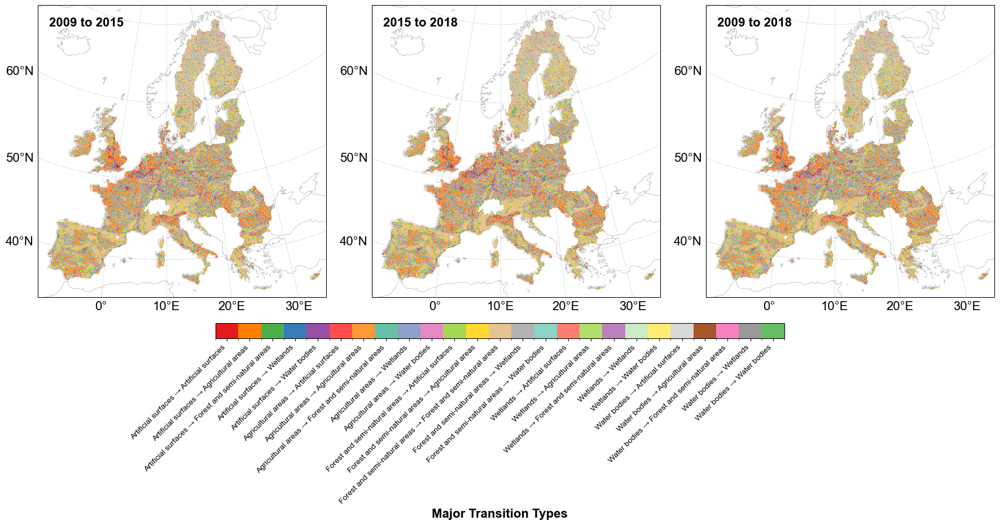

2025-08-11 14:24:56,808 - INFO - ✅ 完成大类转换空间分布图显示


In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import matplotlib.font_manager as fm
import logging
import gc

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径
input_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)
periods = [(2009, 2015), (2015, 2018), (2009, 2018)]

# 大类定义（用于解析转换类型）
clc_classes = {
    'Artificial surfaces': [
        (1, 'Continuous urban fabric'), (2, 'Discontinuous urban fabric'),
        (3, 'Industrial or commercial units'), (4, 'Road and rail networks'),
        (5, 'Port areas'), (6, 'Airports'), (7, 'Mineral extraction sites'),
        (8, 'Dump sites'), (9, 'Construction sites'), (10, 'Green urban areas'),
        (11, 'Sport and leisure facilities')
    ],
    'Agricultural areas': [
        (12, 'Non-irrigated arable land'), (13, 'Permanently irrigated land'),
        (14, 'Rice fields'), (15, 'Vineyards'), (16, 'Fruit trees and berry plantations'),
        (17, 'Olive groves'), (18, 'Pastures'), (19, 'Annual crops with permanent crops'),
        (20, 'Complex cultivation patterns'), (21, 'Agriculture with natural vegetation'),
        (22, 'Agro-forestry areas')
    ],
    'Forest and semi-natural areas': [
        (23, 'Broad-leaved forest'), (24, 'Coniferous forest'),
        (25, 'Mixed forest'), (26, 'Natural grasslands'),
        (27, 'Moors and heathland'), (28, 'Sclerophyllous vegetation'),
        (29, 'Transitional woodland-shrub'), (30, 'Beaches, dunes, sands'),
        (31, 'Bare rocks'), (32, 'Sparsely vegetated areas'),
        (33, 'Burnt areas'), (34, 'Glaciers and perpetual snow')
    ],
    'Wetlands': [
        (35, 'Inland marshes'), (36, 'Peat bogs'), (37, 'Salt marshes'),
        (38, 'Salines'), (39, 'Intertidal flats')
    ],
    'Water bodies': [
        (40, 'Water courses'), (41, 'Water bodies'), (42, 'Coastal lagoons'),
        (43, 'Estuaries'), (44, 'Sea and ocean')
    ]
}

# 字体兼容：Windows Arial / 自动 fallback
try:
    arial_path = fm.findfont("Arial")
    plt.rcParams["font.family"] = "Arial"
    logger.info(f"✅ 使用 Arial 字体: {arial_path}")
except:
    plt.rcParams["font.family"] = "DejaVu Sans"
    logger.warning("⚠️ Arial 字体未找到，已自动回退为 DejaVu Sans")

plt.rcParams["font.size"] = 16

# 读取转换类型
def load_transition_types():
    transition_types = {}
    types_file = os.path.join(input_dir, "major_transition_types.txt")
    try:
        with open(types_file, 'r', encoding='utf-8') as f:
            for line in f:
                tid = int(line.split(":")[0].replace("ID ", "").strip())
                name = line.split(":")[1].strip()
                from_cat = name.split(" → ")[0]
                to_cat = name.split(" → ")[1]
                from_idx = list(clc_classes.keys()).index(from_cat)
                to_idx = list(clc_classes.keys()).index(to_cat)
                transition_types[(from_idx, to_idx)] = (tid, name)
        logger.info(f"📝 已加载大类转换类型: {types_file}, 共 {len(transition_types)} 种")
    except Exception as e:
        logger.error(f"❌ 加载大类转换类型失败: {str(e)}")
        return None
    return transition_types

# 读取转换栅格
def read_transition_tiff(path):
    try:
        with rasterio.open(path) as src:
            data = src.read(1).astype(np.float32)  # 使用float32以支持np.nan
            nodata = src.nodatavals[0] if src.nodatavals else 0
            data = np.ma.masked_invalid(np.where(data == nodata, np.nan, data))  # nodata转为np.nan
            bounds = src.bounds
            logger.info(f"加载大类转换栅格: {path}")
            unique_vals = np.unique(data[~data.mask]).astype(int)
            logger.info(f"栅格唯一值: {unique_vals}")
            return data, bounds
    except Exception as e:
        logger.error(f"❌ 加载 {path} 失败: {str(e)}")
        return None, None

# 绘制空间分布图
def plot_major_transition_maps():
    transition_types = load_transition_types()
    if transition_types is None:
        return
    
    # 扩展颜色列表以支持25种转换
    colors = [
        '#e41a1c', '#ff7f00', '#4daf4a', '#377eb8', '#984ea3',
        '#ff4d4d', '#ff9933', '#66c2a5', '#8da0cb', '#e78ac3',
        '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3', '#8dd3c7',
        '#fb8072', '#b3de69', '#bc80bd', '#ccebc5', '#ffed6f',
        '#d9d9d9', '#a65628', '#f781bf', '#999999', '#66bd63'
    ]
    
    # 收集所有栅格中的唯一值（排除nodata）
    used_tids = set()
    datasets = []
    for from_year, to_year in periods:
        path = os.path.join(input_dir, f"major_transition_{from_year}_to_{to_year}.tif")
        data, bounds = read_transition_tiff(path)
        if data is not None:
            valid_tids = np.unique(data[~data.mask]).astype(int)
            used_tids.update(valid_tids)
            datasets.append((from_year, to_year, data, bounds))
    
    logger.info(f"所有栅格中的有效转换ID: {sorted(used_tids)}")
    
    # 过滤实际存在的转换类型
    filtered_transition_types = {k: v for k, v in transition_types.items() if v[0] in used_tids}
    if not filtered_transition_types:
        logger.error("❌ 没有有效的转换类型可绘制，请检查栅格数据")
        return
    
    logger.info(f"过滤后的转换类型: {[v[1] for v in filtered_transition_types.values()]}")
    
    # 创建离散色带
    valid_tids = sorted(set(v[0] for v in filtered_transition_types.values()))
    cmap = mcolors.ListedColormap([colors[tid-1] for tid in valid_tids])
    norm = mcolors.BoundaryNorm(boundaries=[tid-0.5 for tid in valid_tids] + [max(valid_tids)+0.5], ncolors=len(valid_tids))
    
    # 创建子图
    fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]  # 确保axes是列表，即使只有一个子图
    
    for ax, (from_year, to_year, data, bounds) in zip(axes, datasets):
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                       transform=ccrs.PlateCarree(), origin='upper')
        
        # 添加年份标签
        ax.text(0.04, 0.96, f"{from_year} to {to_year}", transform=ax.transAxes,
                fontsize=16, fontweight='bold', va='top', ha='left')
        
        # 添加海岸线
        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)
        
        # 配置网格线
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True
        gl.xlabel_style = {'size': 16, 'rotation': 0}
        gl.ylabel_style = {'size': 16, 'rotation': 0}
    
    # 添加色带
    cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=valid_tids)
    cb.ax.set_xticklabels([filtered_transition_types[k][1] for k in sorted(filtered_transition_types.keys(), key=lambda x: filtered_transition_types[x][0])], rotation=45, ha='right', fontsize=10)
    cb.set_label("Major Transition Types", fontsize=16, weight='bold')
    cb.ax.tick_params(labelsize=10)
    
    plt.tight_layout()
    plt.show()
    gc.collect()
    logger.info("✅ 完成大类转换空间分布图显示")

# 主程序
def main():
    plot_major_transition_maps()

if __name__ == "__main__":
    main()

2025-08-14 21:24:44,471 - INFO - ✅ 使用 Arial 字体: C:\Windows\Fonts\arial.ttf
2025-08-14 21:24:44,509 - INFO - 📝 已加载转换类型: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_types.txt, 共 25 种
2025-08-14 21:24:46,674 - INFO - 加载 E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2009_to_2015.tif, 唯一值(NaN处理后): [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25]
2025-08-14 21:24:49,686 - INFO - 加载 E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2015_to_2018.tif, 唯一值(NaN处理后): [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25]
2025-08-14 21:24:52,835 - INFO - 加载 E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_2009_to_2018.tif, 唯一值(NaN处理后): [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25]
D:\Temp\ipykernel_15384\858766571.py:167: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


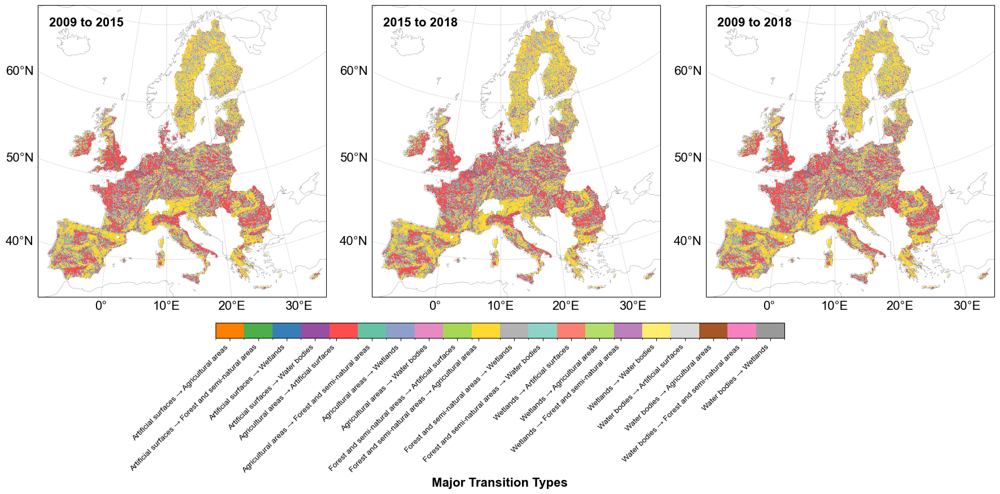

2025-08-14 21:28:53,778 - INFO - ✅ 完成大类转换空间分布图显示


In [18]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import matplotlib.font_manager as fm
import logging
import gc

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径
input_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)
periods = [(2009, 2015), (2015, 2018), (2009, 2018)]

# 大类定义
clc_classes = {
    'Artificial surfaces': [(1, 'Continuous urban fabric'), (2, 'Discontinuous urban fabric'),
        (3, 'Industrial or commercial units'), (4, 'Road and rail networks'),
        (5, 'Port areas'), (6, 'Airports'), (7, 'Mineral extraction sites'),
        (8, 'Dump sites'), (9, 'Construction sites'), (10, 'Green urban areas'),
        (11, 'Sport and leisure facilities')],
    'Agricultural areas': [(12, 'Non-irrigated arable land'), (13, 'Permanently irrigated land'),
        (14, 'Rice fields'), (15, 'Vineyards'), (16, 'Fruit trees and berry plantations'),
        (17, 'Olive groves'), (18, 'Pastures'), (19, 'Annual crops with permanent crops'),
        (20, 'Complex cultivation patterns'), (21, 'Agriculture with natural vegetation'),
        (22, 'Agro-forestry areas')],
    'Forest and semi-natural areas': [(23, 'Broad-leaved forest'), (24, 'Coniferous forest'),
        (25, 'Mixed forest'), (26, 'Natural grasslands'), (27, 'Moors and heathland'),
        (28, 'Sclerophyllous vegetation'), (29, 'Transitional woodland-shrub'), (30, 'Beaches, dunes, sands'),
        (31, 'Bare rocks'), (32, 'Sparsely vegetated areas'), (33, 'Burnt areas'), (34, 'Glaciers and perpetual snow')],
    'Wetlands': [(35, 'Inland marshes'), (36, 'Peat bogs'), (37, 'Salt marshes'),
        (38, 'Salines'), (39, 'Intertidal flats')],
    'Water bodies': [(40, 'Water courses'), (41, 'Water bodies'), (42, 'Coastal lagoons'),
        (43, 'Estuaries'), (44, 'Sea and ocean')]
}

# 字体兼容
try:
    arial_path = fm.findfont("Arial")
    plt.rcParams["font.family"] = "Arial"
    logger.info(f"✅ 使用 Arial 字体: {arial_path}")
except:
    plt.rcParams["font.family"] = "DejaVu Sans"
    logger.warning("⚠️ Arial 字体未找到，已自动回退为 DejaVu Sans")

plt.rcParams["font.size"] = 16

# 读取转换类型
def load_transition_types():
    transition_types = {}
    types_file = os.path.join(input_dir, "major_transition_types.txt")
    try:
        with open(types_file, 'r', encoding='utf-8') as f:
            for line in f:
                tid = int(line.split(":")[0].replace("ID ", "").strip())
                name = line.split(":")[1].strip()
                from_cat = name.split(" → ")[0]
                to_cat = name.split(" → ")[1]
                from_idx = list(clc_classes.keys()).index(from_cat)
                to_idx = list(clc_classes.keys()).index(to_cat)
                # 自变化归为 No Change
                if from_cat == to_cat:
                    tid = 0
                    name = "No Change"
                transition_types[(from_idx, to_idx)] = (tid, name)
        logger.info(f"📝 已加载转换类型: {types_file}, 共 {len(transition_types)} 种")
    except Exception as e:
        logger.error(f"❌ 加载大类转换类型失败: {str(e)}")
        return None
    return transition_types

# 读取栅格
def read_transition_tiff(path):
    try:
        with rasterio.open(path) as src:
            data = src.read(1).astype(np.float32)
            nodata = src.nodatavals[0] if src.nodatavals else 0
            data = np.where(data == nodata, np.nan, data)  # NaN表示无数据
            bounds = src.bounds
            unique_vals = np.unique(data[~np.isnan(data)]).astype(int)
            logger.info(f"加载 {path}, 唯一值(NaN处理后): {unique_vals}")
            return data, bounds
    except Exception as e:
        logger.error(f"❌ 加载 {path} 失败: {str(e)}")
        return None, None

# 绘图
def plot_major_transition_maps():
    transition_types = load_transition_types()
    if transition_types is None:
        return

    # 颜色列表, 0=白色
    colors = ['#ffffff', '#e41a1c', '#ff7f00', '#4daf4a', '#377eb8', '#984ea3',
              '#ff4d4d', '#ff9933', '#66c2a5', '#8da0cb', '#e78ac3',
              '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3', '#8dd3c7',
              '#fb8072', '#b3de69', '#bc80bd', '#ccebc5', '#ffed6f',
              '#d9d9d9', '#a65628', '#f781bf', '#999999', '#66bd63']

    datasets = []
    all_valid_tids = set()
    for from_year, to_year in periods:
        path = os.path.join(input_dir, f"major_transition_{from_year}_to_{to_year}.tif")
        data, bounds = read_transition_tiff(path)
        if data is not None:
            tids = np.unique(data[~np.isnan(data)]).astype(int)
            all_valid_tids.update(tids)
            datasets.append((from_year, to_year, data, bounds))

    # 过滤转换类型，只保留栅格中出现的
    filtered_transition_types = {}
    for k, v in transition_types.items():
        if v[0] in all_valid_tids:
            filtered_transition_types[k] = v
    valid_tids = sorted(set(v[0] for v in filtered_transition_types.values()))

    # color map
    cmap = mcolors.ListedColormap([colors[tid] for tid in valid_tids])
    norm = mcolors.BoundaryNorm([tid-0.5 for tid in valid_tids]+[max(valid_tids)+0.5], ncolors=len(valid_tids))

    # 子图
    fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]

    for ax, (from_year, to_year, data, bounds) in zip(axes, datasets):
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent,
                       transform=ccrs.PlateCarree(), origin='upper')
        ax.text(0.04, 0.96, f"{from_year} to {to_year}", transform=ax.transAxes,
                fontsize=16, fontweight='bold', va='top', ha='left')
        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0,10,20,30])
        gl.ylocator = mticker.FixedLocator([40,50,60,70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True
        gl.xlabel_style = {'size':16,'rotation':0}
        gl.ylabel_style = {'size':16,'rotation':0}

    # 色带
    cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=valid_tids)
    labels = []
    for tid in valid_tids:
        if tid == 0:
            labels.append("No Change")
        else:
            for k, v in filtered_transition_types.items():
                if v[0] == tid:
                    labels.append(v[1])
                    break
    cb.ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=10)
    cb.set_label("Major Transition Types", fontsize=16, weight='bold')
    cb.ax.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()
    gc.collect()
    logger.info("✅ 完成大类转换空间分布图显示")

def main():
    plot_major_transition_maps()

if __name__ == "__main__":
    main()


2025-08-15 14:01:18,369 - INFO - 跳过自己转自己转换: Artificial surfaces → Artificial surfaces (tid=1)
2025-08-15 14:01:18,370 - INFO - 跳过自己转自己转换: Agricultural areas → Agricultural areas (tid=7)
2025-08-15 14:01:18,370 - INFO - 跳过自己转自己转换: Forest and semi-natural areas → Forest and semi-natural areas (tid=13)
2025-08-15 14:01:18,371 - INFO - 跳过自己转自己转换: Wetlands → Wetlands (tid=19)
2025-08-15 14:01:18,371 - INFO - 跳过自己转自己转换: Water bodies → Water bodies (tid=25)


2025-08-15 14:01:18,372 - INFO - 📝 已加载并过滤自己转自己转换类型: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_types.txt, 共 20 种
2025-08-15 14:01:21,176 - INFO - 加载 major_transition_2009_to_2015.tif，有效 TID: [ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 20 21 22 23 24]
2025-08-15 14:01:23,539 - INFO - 加载 major_transition_2015_to_2018.tif，有效 TID: [ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 20 21 22 23 24]
2025-08-15 14:01:26,401 - INFO - 加载 major_transition_2009_to_2018.tif，有效 TID: [ 2  3  4  5  6  8  9 10 11 12 14 15 16 17 18 20 21 22 23 24]
2025-08-15 14:01:27,259 - INFO - 实际存在的有效 TID: [2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24]
2025-08-15 14:03:03,529 - INFO - 2009->2015 TID 2: 43491 pixels
2025-08-15 14:03:03,871 - INFO - 2009->2015 TID 3: 20678 pixels
2025-08-15 14:03:04,146 - INFO - 2009->2015 TID 4: 496 pixels
2025-08-15 14:03:04,430 - INFO - 2009->2015 TID 5: 4065 pixels
2025-08-15 14:03:04,699 - INFO - 2009->2015 TID 6: 134292 pixels
2025-08-15 14:0

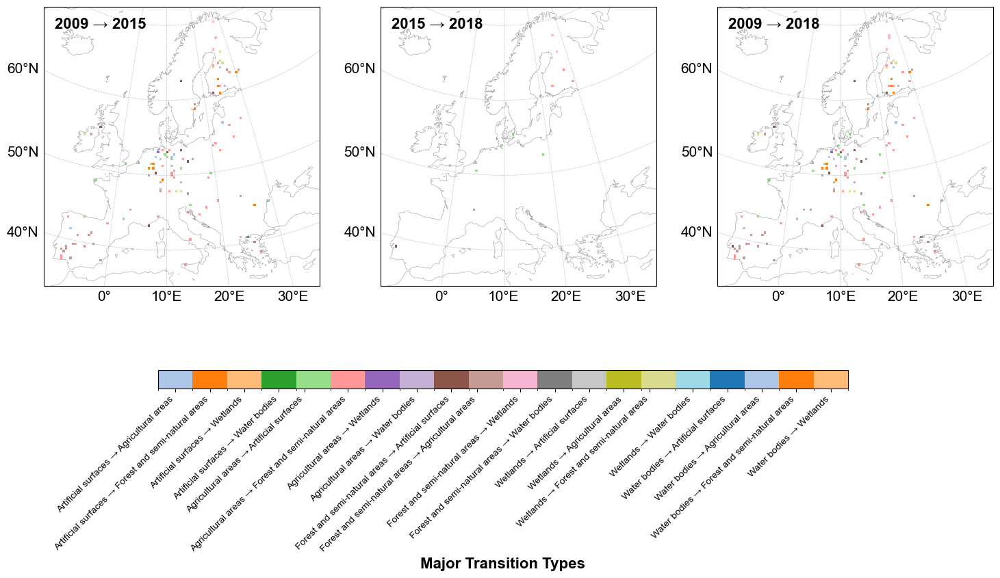

2025-08-15 14:06:23,599 - INFO - ✅ 完成大类转换空间分布图显示


In [25]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import matplotlib.font_manager as fm
import logging
import gc

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径
input_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
periods = [(2009, 2015), (2015, 2018), (2009, 2018)]
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 自己转自己的 TID
self_transition_tids = [1, 7, 13, 19, 25]

# 读取转换类型
def load_transition_types():
    transition_types = {}
    types_file = os.path.join(input_dir, "major_transition_types.txt")
    try:
        with open(types_file, 'r', encoding='utf-8') as f:
            for line in f:
                tid = int(line.split(":")[0].replace("ID ", "").strip())
                name = line.split(":")[1].strip()
                # 跳过自己转自己
                if tid in self_transition_tids:
                    logger.info(f"跳过自己转自己转换: {name} (tid={tid})")
                    continue
                transition_types[tid] = name
        logger.info(f"📝 已加载并过滤自己转自己转换类型: {types_file}, 共 {len(transition_types)} 种")
    except Exception as e:
        logger.error(f"❌ 加载大类转换类型失败: {str(e)}")
    return transition_types

# 读取栅格并过滤自己转自己
def read_transition_tiff(path):
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        nodata = src.nodatavals[0] if src.nodatavals else 0
        # 将 nodata 和自己转自己 TID 转为 nan
        data = np.where(np.isin(data, self_transition_tids) | (data == nodata), np.nan, data)
        bounds = src.bounds
    return data, bounds

# 绘图
def plot_major_transition_maps():
    transition_types = load_transition_types()
    if not transition_types:
        logger.error("❌ 没有有效的转换类型")
        return

    # 读取栅格
    datasets = []
    for from_year, to_year in periods:
        path = os.path.join(input_dir, f"major_transition_{from_year}_to_{to_year}.tif")
        data, bounds = read_transition_tiff(path)
        unique_vals = np.unique(data[~np.isnan(data)]).astype(int)
        logger.info(f"加载 {os.path.basename(path)}，有效 TID: {unique_vals}")
        datasets.append((from_year, to_year, data, bounds))

    # 计算实际存在的有效 TID
    all_valid_tids = sorted({int(val) for _, _, data, _ in datasets for val in np.unique(data[~np.isnan(data)])})
    logger.info(f"实际存在的有效 TID: {all_valid_tids}")

    # 建立颜色映射
    colors = plt.get_cmap("tab20").colors
    cmap = mcolors.ListedColormap([colors[(tid - 1) % 20] for tid in all_valid_tids])
    norm = mcolors.BoundaryNorm(boundaries=[tid - 0.5 for tid in all_valid_tids] + [max(all_valid_tids) + 0.5], ncolors=len(all_valid_tids))

    # 创建子图
    fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]

    for ax, (from_year, to_year, data, bounds) in zip(axes, datasets):
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent, transform=ccrs.PlateCarree(), origin='upper',interpolation='none')
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True
        ax.text(0.04, 0.96, f"{from_year} → {to_year}", transform=ax.transAxes, fontsize=16, fontweight='bold', va='top', ha='left')

        # 打印每个 TID 的像素数量
        for tid in all_valid_tids:
            count = np.sum(data == tid)
            logger.info(f"{from_year}->{to_year} TID {tid}: {count} pixels")

    # 色条
    cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=all_valid_tids)
    cb.ax.set_xticklabels([transition_types[tid] for tid in all_valid_tids], rotation=45, ha='right', fontsize=10)
    cb.set_label("Major Transition Types", fontsize=16, weight='bold')

    plt.subplots_adjust(bottom=0.2)
    plt.show()
    gc.collect()
    logger.info("✅ 完成大类转换空间分布图显示")

if __name__ == "__main__":
    plot_major_transition_maps()


In [2]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import logging
import gc
from rasterio.transform import from_bounds

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径
input_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
periods = [(2009, 2015), (2015, 2018), (2009, 2018)]
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 自己转自己的 TID
self_transition_tids = [1, 7, 13, 19, 25]

# 读取转换类型
def load_transition_types():
    transition_types = {}
    types_file = os.path.join(input_dir, "major_transition_types.txt")
    try:
        with open(types_file, 'r', encoding='utf-8') as f:
            for line in f:
                tid = int(line.split(":")[0].replace("ID ", "").strip())
                name = line.split(":")[1].strip()
                # 跳过自己转自己
                if tid in self_transition_tids:
                    logger.info(f"跳过自己转自己转换: {name} (tid={tid})")
                    continue
                transition_types[tid] = name
        logger.info(f"📝 已加载并过滤自己转自己转换类型: {types_file}, 共 {len(transition_types)} 种")
    except Exception as e:
        logger.error(f"❌ 加载大类转换类型失败: {str(e)}")
    return transition_types

# 读取栅格并过滤自己转自己
def read_transition_tiff(path):
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        nodata = src.nodatavals[0] if src.nodatavals else 0
        # 将 nodata 和自己转自己 TID 转为 nan
        data = np.where(np.isin(data, self_transition_tids) | (data == nodata), np.nan, data)
        bounds = src.bounds
    return data, bounds

# 绘图
def plot_major_transition_maps():
    transition_types = load_transition_types()
    if not transition_types:
        logger.error("❌ 没有有效的转换类型")
        return

    # 读取栅格
    datasets = []
    for from_year, to_year in periods:
        path = os.path.join(input_dir, f"major_transition_{from_year}_to_{to_year}.tif")
        data, bounds = read_transition_tiff(path)
        unique_vals = np.unique(data[~np.isnan(data)]).astype(int)
        logger.info(f"加载 {os.path.basename(path)}，有效 TID: {unique_vals}")
        datasets.append((from_year, to_year, data, bounds))

    # 计算实际存在的有效 TID
    all_valid_tids = sorted({int(val) for _, _, data, _ in datasets for val in np.unique(data[~np.isnan(data)])})
    logger.info(f"实际存在的有效 TID: {all_valid_tids}")

    # 建立颜色映射
    colors = plt.get_cmap("tab20").colors
    cmap = mcolors.ListedColormap([colors[(tid - 1) % 20] for tid in all_valid_tids])
    norm = mcolors.BoundaryNorm(
        boundaries=[tid - 0.5 for tid in all_valid_tids] + [max(all_valid_tids) + 0.5], 
        ncolors=len(all_valid_tids)
    )

    # 创建子图
    fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]

    for ax, (from_year, to_year, data, bounds) in zip(axes, datasets):
        rows, cols = data.shape
        x = np.linspace(bounds.left, bounds.right, cols + 1)
        y = np.linspace(bounds.bottom, bounds.top, rows + 1)
        X, Y = np.meshgrid(x, y)

        im = ax.pcolormesh(X, Y, data, cmap=cmap, norm=norm, shading='flat', transform=ccrs.PlateCarree())

        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)

        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True

        ax.text(0.04, 0.96, f"{from_year} → {to_year}", transform=ax.transAxes,
                fontsize=16, fontweight='bold', va='top', ha='left')

        # 打印每个 TID 的像素数量
        for tid in all_valid_tids:
            count = np.sum(data == tid)
            logger.info(f"{from_year}->{to_year} TID {tid}: {count} pixels")

    # 色条
    cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=all_valid_tids)
    cb.ax.set_xticklabels([transition_types[tid] for tid in all_valid_tids], rotation=45, ha='right', fontsize=10)
    cb.set_label("Major Transition Types", fontsize=16, weight='bold')

    plt.subplots_adjust(bottom=0.2)
    plt.show()
    gc.collect()
    logger.info("✅ 完成大类转换空间分布图显示")

if __name__ == "__main__":
    plot_major_transition_maps()


2025-08-15 15:17:20,463 - INFO - 跳过自己转自己转换: Artificial surfaces → Artificial surfaces (tid=1)
2025-08-15 15:17:20,464 - INFO - 跳过自己转自己转换: Agricultural areas → Agricultural areas (tid=7)
2025-08-15 15:17:20,465 - INFO - 跳过自己转自己转换: Forest and semi-natural areas → Forest and semi-natural areas (tid=13)
2025-08-15 15:17:20,466 - INFO - 跳过自己转自己转换: Wetlands → Wetlands (tid=19)


2025-08-15 15:17:20,466 - INFO - 跳过自己转自己转换: Water bodies → Water bodies (tid=25)
2025-08-15 15:17:20,467 - INFO - 📝 已加载并过滤自己转自己转换类型: E:\Project-yqr\EU_TIFF_500m\transitions\major_transition_types.txt, 共 20 种


MemoryError: Unable to allocate 839. MiB for an array with shape (9644, 22804) and data type float32

2025-08-14 22:14:57,943 - INFO - 📝 已加载小类转换类型，共 1936 种
2025-08-14 22:22:14,417 - INFO - 自动识别不变小类 TID: [1, 46, 91, 136, 181, 226, 271, 316, 361, 406, 451, 496, 541, 586, 631, 676, 721, 766, 811, 856, 901, 946, 991, 1036, 1081, 1126, 1171, 1216, 1261, 1306, 1351, 1396, 1441, 1486, 1531, 1576, 1621, 1666, 1711, 1756, 1801, 1846, 1891, 1936]
2025-08-14 22:22:36,198 - INFO - 实际存在的有效小类 TID (排除 No Change): [2, 3, 4, 5, 6, 9, 10, 11, 12, 13, 15, 16, 17, 18, 20, 21, 23, 24, 25, 26, 28, 29, 32, 40, 41, 42, 43, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 123, 124, 125, 127, 128, 129, 130, 131, 132, 133, 134, 135, 137, 138, 139, 140, 141, 142, 143, 144, 145, 147, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 164, 167, 169, 1

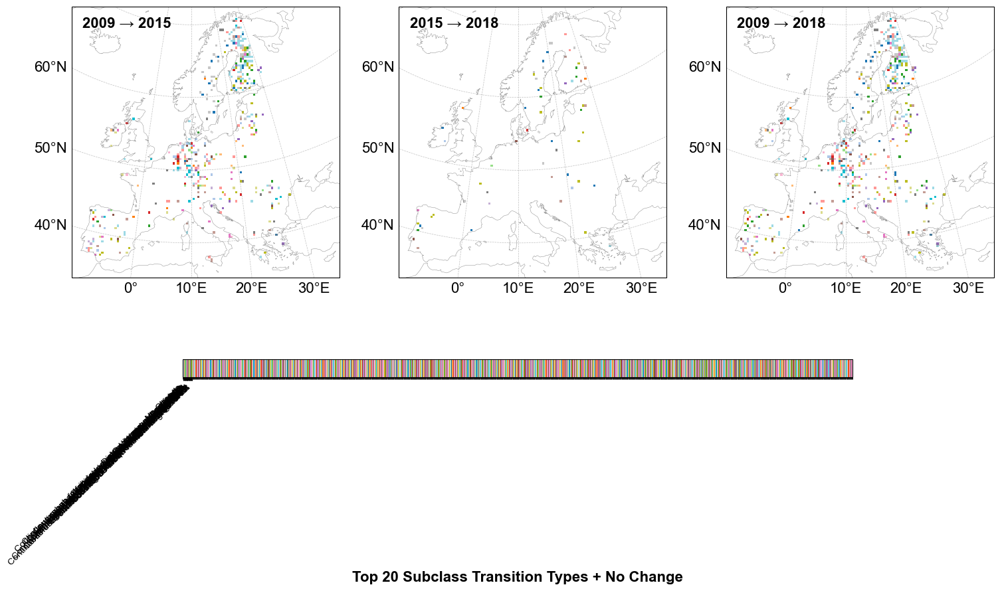

2025-08-14 22:45:28,332 - INFO - ✅ 完成小类转换空间分布图显示


In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import matplotlib.font_manager as fm
import logging
import gc

# 日志配置
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# 输入路径
input_dir = r"E:\Project-yqr\EU_TIFF_500m\transitions"
periods = [(2009, 2015), (2015, 2018), (2009, 2018)]
map_crs = ccrs.LambertAzimuthalEqualArea(central_longitude=10, central_latitude=52)

# 读取小类转换类型
def load_subclass_transition_types():
    transition_types = {}
    types_file = os.path.join(input_dir, "minor_transition_types.txt")
    try:
        with open(types_file, 'r', encoding='utf-8') as f:
            for line in f:
                tid = int(line.split(":")[0].replace("ID ", "").strip())
                name = line.split(":")[1].strip()
                transition_types[tid] = name
        logger.info(f"📝 已加载小类转换类型，共 {len(transition_types)} 种")
    except Exception as e:
        logger.error(f"❌ 加载小类转换类型失败: {str(e)}")
    return transition_types

# 读取栅格
def read_transition_tiff(path):
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        nodata = src.nodatavals[0] if src.nodatavals else 0
        # 将 nodata 转为 nan
        data = np.where(data == nodata, np.nan, data)
        bounds = src.bounds
    return data, bounds

# 绘图
def plot_subclass_transition_maps():
    transition_types = load_subclass_transition_types()
    if not transition_types:
        logger.error("❌ 没有有效的小类转换类型")
        return

    # 读取栅格
    datasets = []
    for from_year, to_year in periods:
        path = os.path.join(input_dir, f"minor_transition_{from_year}_to_{to_year}.tif")
        data, bounds = read_transition_tiff(path)
        datasets.append((from_year, to_year, data, bounds))

    # 识别不变 TID：所有时期数据完全相同的值
    all_data_stack = np.stack([d[2] for d in datasets], axis=0)
    unique_vals_per_period = [set(np.unique(d[2][~np.isnan(d[2])]).astype(int)) for d in datasets]
    candidate_tids = set.intersection(*unique_vals_per_period)
    unchanged_tids = set()
    for tid in candidate_tids:
        if np.all(all_data_stack == tid, axis=0).any():  # 该 TID 在所有时期存在且像素不变
            unchanged_tids.add(tid)
    logger.info(f"自动识别不变小类 TID: {sorted(unchanged_tids)}")

    # 将不变 TID 替换为 0，表示 "No Change"
    for i in range(len(datasets)):
        data = datasets[i][2]
        for tid in unchanged_tids:
            data[data == tid] = 0
        datasets[i] = (datasets[i][0], datasets[i][1], data, datasets[i][3])

    # 计算实际存在的有效 TID（排除 0）
    all_valid_tids = sorted({int(val) for _, _, data, _ in datasets for val in np.unique(data[~np.isnan(data)]) if val != 0})
    logger.info(f"实际存在的有效小类 TID (排除 No Change): {all_valid_tids}")

    # 建立颜色映射：0 为白色，其他按 tab20 颜色
    colors = [(1,1,1)] + list(plt.get_cmap("tab20").colors)  # 0 白色 + tab20
    cmap = mcolors.ListedColormap([colors[0]] + [colors[(tid-1)%20+1] for tid in all_valid_tids])
    norm = mcolors.BoundaryNorm(
        boundaries=[0-0.5] + [tid-0.5 for tid in all_valid_tids] + [max(all_valid_tids)+0.5],
        ncolors=len(all_valid_tids)+1
    )

    # 创建子图
    fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6), subplot_kw={'projection': map_crs})
    if len(datasets) == 1:
        axes = [axes]

    for ax, (from_year, to_year, data, bounds) in zip(axes, datasets):
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        im = ax.imshow(data, cmap=cmap, norm=norm, extent=extent, transform=ccrs.PlateCarree(), origin='upper',interpolation='nearest')
        ax.set_extent([-10, 35, 35, 71], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='gray', linewidth=0.4, alpha=0.8)
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.xlocator = mticker.FixedLocator([0, 10, 20, 30])
        gl.ylocator = mticker.FixedLocator([40, 50, 60, 70])
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = True
        ax.text(0.04, 0.96, f"{from_year} → {to_year}", transform=ax.transAxes,
                fontsize=16, fontweight='bold', va='top', ha='left')

        # 打印每个 TID 的像素数量
        for tid in [0] + all_valid_tids:
            count = np.sum(data == tid)
            label = "No Change" if tid==0 else str(tid)
            logger.info(f"{from_year}->{to_year} TID {label}: {count} pixels")

    # 色条：0 为 No Change + 前 20 个有效 TID
    cbar_tids = [0] + all_valid_tids[:20]
    cbar_labels = ["No Change"] + [transition_types[tid] for tid in all_valid_tids[:20]]
    cbar_ax = fig.add_axes([0.22, -0.05, 0.56, 0.045])
    cb = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=cbar_tids)
    cb.ax.set_xticklabels(cbar_labels, rotation=45, ha='right', fontsize=10)
    cb.set_label("Top 20 Subclass Transition Types + No Change", fontsize=16, weight='bold')

    plt.subplots_adjust(bottom=0.2)
    plt.show()
    gc.collect()
    logger.info("✅ 完成小类转换空间分布图显示")

if __name__ == "__main__":
    plot_subclass_transition_maps()
